In [3]:
import os
from tokenize import group
import numpy as np
import pandas as pd
import time
from math import radians, degrees, sin, cos, asin, acos, sqrt, atan2
from typing import List, Optional, Union, Tuple, Dict
from tqdm import tqdm
import xarray as xr

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable 
import matplotlib.ticker as mticker
# from matplotlib.font_manager import FontPropertiesa
import matplotlib.font_manager as fm
import matplotlib.lines as mlines
import tcmarkers

import pickle  

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from sklearn.decomposition import PCA

from scipy.ndimage import uniform_filter

from datetime import datetime, timedelta

# import haversine
from haversine import haversine
import tropycal.tracks as tracks

from numba import jit, prange, njit
from joblib import Parallel, delayed

# from metpy import potential_vorticity_baroclinic as pv_bc
from metpy.units import units
from metpy.calc import potential_temperature, lat_lon_grid_deltas
from metpy.calc import potential_vorticity_baroclinic as pv_bc
from metpy.calc import potential_vorticity_barotropic as pv_bt

from dask import delayed, compute
from dask.diagnostics import ProgressBar

# from ty_pkg import latlon
from tool.ty_pkg import latlon_extent, haversine_distance, Met, weighted_sum

from tool.ESA import calculate_potential_vorticity, process_ens, var_axis0, mean_axis0, compute_cov_vector, compute_cov_var

from draw.easy_map import map_background, colorline

# pangu_dir = r'/home1/jek/Pangu-Weather'
pangu_dir = r'/data09/Pangu_TC_ENS'

pres_list = ['1000','925','850','700','600','500','400','300','250','200','150','100','50']
steer_pres = [850,700,600,500]
# STEER_DP = [50, 75, 100, 100, 100, 125, 100]
STEER_DP = [112.5, 125, 100, 100]
pres_array = np.array(pres_list, dtype=np.float32)
steer_array = np.array(steer_pres, dtype=np.float32)
steer_idx = np.where(np.isin(pres_array, steer_array))[0]

surface_factor = ['MSLP', 'U10', 'V10', 'T2M']
surface_dict = {'MSLP':0, 'U10':1, 'V10':2, 'T2M':3}
upper_factor = ['z', 'q', 't', 'u', 'v']
upper_dict = {'z':0, 'q':1, 't':2, 'u':3, 'v':4}

proj = ccrs.PlateCarree()
norm_p = mcolors.Normalize(vmin=950, vmax=1020)

# Define the colors you want in your colormap
colors = ["purple", "darkblue", "lightblue", "white", "yellow", "red", "pink"]

# Create a colormap from the colors
pwp = LinearSegmentedColormap.from_list("custom_cmap", colors, N=256)


#! 태풍 경로 정보 기존 정보 불러오기
#위경도 지정
# lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(100,160,5,45)  
# lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(90,180,0,60) 
lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(100,160,5,45)  
lon_grid, lat_grid = np.meshgrid(lon_indices[lon_start:lon_end + 1], lat_indices[lat_start:lat_end + 1])


ssv_dict = {}


#태풍 지정
storm_name, storm_year, key_time_list  = 'HINNAMNOR', 2022, ['2022/08/27/00UTC']
# storm_name, storm_year, key_time_list  = 'NORU', 2017, ['2017/07/30/00UTC']
# storm_name, storm_year, key_time_list  = 'DEBBY', 2012, ['2012/06/23/00UTC']                                                                               


if storm_name == 'DEBBY':
    lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(250,310,5,45)  
    lon_grid, lat_grid = np.meshgrid(lon_indices[lon_start:lon_end + 1], lat_indices[lat_start:lat_end + 1])


surface_factors = []  # 예시: 지표면에서는 'MSLP'만 선택
upper_factors = ['z'] 
upper_factors = ['z'] 
if storm_name == 'HINNAMNOR':
    perturbation_scale = 0.05
else:
    perturbation_scale = 0.1

#예측 시간 지정, 초기 시간 지정, 앙상블 수
predict_interval_list = np.arange(0,24*5+1,6)  
ens_list = range(0,500)
new_ssv = 'n'           #새로 생성할 것인지 여부, n이면 기존 파일 불러옴
retro_opt = 'td'        #다시 돌아가면서 태풍 추적시 강한 것만 추적하려면 td로
six_hour_opt = 'y'      #6시간 간격으로 태풍 위치를 저장할 것인지 여부

if retro_opt =='td':
    retro_opt = '_td'
else:
    retro_opt = ''

six_hour_suffix = '_6h' if six_hour_opt == 'y' else ''

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
  background: radial-gradient(ellipse at center, #009cd9 0%, #01263a 100%);
">
  <div style="
    text-align: center;
    color: #fff;
    font-weight: bold;
    font-size: 3.5rem;
    padding: 32px 56px;
    border-radius: 40px;
    background: rgba(0,156,217,0.75);
    box-shadow: 0 8px 32px 0 rgba(0,40,80,0.35);
    letter-spacing: 0.05em;
    text-shadow: 
      0 4px 20px #0088b8,
      0 0 30px #3df2ff,
      0 0 8px #fff;
    position: relative;
    overflow: hidden;
  ">
    <span style="font-size: 2.7rem; margin-right: 0.5em; vertical-align: middle; animation:spin 2s linear infinite;">🌀</span>
    <span style="display: inline-block; vertical-align: middle;">
      Bring <span style="color: #ffe66b; filter: drop-shadow(0 0 12px #fffbe7);">TC data</span>
    </span>
    <span style="font-size: 2.7rem; margin-left: 0.5em; vertical-align: middle; animation:spinrev 2s linear infinite;">🌀</span>
    <div style="font-size: 1.2rem; margin-top: 18px; opacity: 0.8; letter-spacing: 0.04em;">
      <span style="font-size:1.6rem;">🌬️</span> Typhoon’s track <span style="font-size:1.6rem;">🌊</span>
    </div>
  </div>
</div>
<style>
@keyframes spin {
  0% {transform: rotate(0deg);}
  100% {transform: rotate(360deg);}
}
@keyframes spinrev {
  0% {transform: rotate(360deg);}
  100% {transform: rotate(0deg);}
}
</style>


# Bring TC data

In [4]:

        
#! 태풍 경로 정보 새로 생성하기

for first_str in key_time_list:
    first_time = datetime.strptime(first_str, "%Y/%m/%d/%HUTC")
    key_str = first_time.strftime("%m.%d.%HUTC")
    ssv_key = first_time
    surface_factors.sort()
    upper_factors.sort()
    surface_str = "".join([f"_{factor}" for factor in surface_factors])  # 각 요소 앞에 _ 추가
    upper_str = "".join([f"_{factor}" for factor in upper_factors])  # 각 요소 앞에 _ 추가
    
    datetime_list = np.array([first_time + timedelta(hours=int(hours)) for hours in predict_interval_list])
    # datetime_array = np.array([(first_time + timedelta(hours=int(hours))) for hours in predict_interval_list])
    # storm_lon, storm_lat, storm_mslp, storm_time = storm_info(pangu_dir, storm_name, storm_year, datetime_list = datetime_list, wind_thres=0)   #태풍 영문명, 년도 입력

    
    # with open(rf'/data09/Pangu_TC_ENS/{perturbation_scale}ENS{surface_str}{upper_str}/ssv_dict{retro_opt}_{min(ens_list)}_{max(ens_list)}.pkl', 'rb') as f:
    with open(rf'{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/ssv_dict{retro_opt}_{min(ens_list)}_{max(ens_list)}.pkl', 'rb') as f:
        ssv_dict = pickle.load(f)



'''
ens_idx_list는 전체 4000개 멤버 중에서 key_time에 해당하는 멤버들에 대한 인덱스 리스트

이후에 ens_idx_list에서 group에 속하는 것들은 group_idx_all_list에 저장

group_idx_list는 ens_idx_list에서 해당하는 인덱스를 추출, ens_uv_factor_uv_all에서 group_idx_list로 인덱싱하여 ens_factor_uv를 구함
'''

if storm_name == 'HINNAMNOR':
    # key_time = datetime(2022,8,28,0)             #처음 시점 지정
    # start_time = datetime(2022,8,28,0)           #분석 시작 시점
    # target_time = datetime(2022,8,31,0)            #위치 projection을 구하고자 하는 시간
    # steer_target_time = datetime(2022,9,2,0)
    key_time = datetime(2022,8,27,0)             #처음 시점 지정
    start_time = datetime(2022,8,27,12)           #분석 시작 시점
    # target_time = datetime(2022,8,29,0)           #위치 projection을 구하고자 하는 시간
    target_time = datetime(2022,8,30,0)           #위치 projection을 구하고자 하는 시간
    # steer_target_time = datetime(2022,8,30,0)
elif storm_name == 'NORU':
    key_time = datetime(2017,7,30,0)              #처음 시점 지정
    start_time = datetime(2017,7,30,0)            #분석 시작 시점
    target_time = datetime(2017,8,3,0)            #위치 projection을 구하고자 하는 시간
elif storm_name == 'DEBBY':
    key_time = datetime(2012,6,23,0)              #처음 시점 지정
    start_time = datetime(2012,6,24,0)            #분석 시작 시점
    target_time = datetime(2012,6,26,0)            #위치 projection을 구하고자 하는 시간

key_str = key_time.strftime("%m.%d %HUTC")
start_str = start_time.strftime("%m.%d %HUTC")
target_str = target_time.strftime("%m.%d %HUTC")

total_time_range = int((target_time - key_time).total_seconds() / 3600)
start_time_range = int((start_time  - key_time).total_seconds() / 3600)

# 변수 지정
distance_threshold = 0                      #가까운 태풍의 거리
steer_pres = [850,700,600,500]  #steering wind 구할 때 사용하는 고도 바꿀 필요 x
axis_opt = 'quiver'                         #axis 뭘로 잡을지, opt: 위치 상관관계 최대인 axis, tar: 최종 위치의 axis, mid: 중간 위치의 axis, lon: 경도, lat: 위도
data_sign = 'y'                             #기존의 데이터를 사용할 것인지, n이면 새로 구함
time_array = np.arange(start_time_range,total_time_range+1,6)  #예측 시간 범위
if storm_name == 'NORU':
    time_array = np.arange(6, 121, 6)  #Noru는 6시간 단위로만 진행

nearby_sign_name = '_nearby'
altitude = '850_200'
choosen_factor = 'steering_wind'


## Draw Best and ENS Track ↕️

In [5]:
ds = xr.open_dataset(rf'/home1/jek/Pangu-Weather/input_data/IBTrACS.ALL.v04r01.nc')
hin_ds = ds.where((ds['season'] == storm_year) & (ds['name'] == storm_name.encode('utf-8')), drop=True)
storm_lat, storm_lon, storm_time, storm_speed, storm_type = hin_ds['usa_lat'][0].values.astype(np.float32), hin_ds['usa_lon'][0].values.astype(np.float32), hin_ds['iso_time'][0].values.astype('datetime64').astype(datetime), hin_ds['usa_wind'][0].values.astype(np.float32), hin_ds['nature'][0].values.astype('str')
storm_usa_type = hin_ds['usa_status'][0].values.astype('str')

storm_lat = storm_lat[(storm_lat != '') & (storm_lat != None)]
storm_lon = storm_lon[(storm_lon != '') & (storm_lon != None)]
storm_time = storm_time[(storm_time != '') & (storm_time != None)]
storm_speed = storm_speed[(storm_speed != '') & (storm_speed != None)]
storm_type = storm_type[(storm_type != '') & (storm_type != None)]
storm_usa_type = storm_usa_type[(storm_usa_type != '') & (storm_usa_type != None)]

color_dict = {'DB': 'cyan', 'TD': 'cyan', 'TS': 'green', 'TY': 'orange', 'ST': 'red', 'SSW': 'purple', 'EX': 'gray'}
type_colors = [color_dict[t] for t in storm_usa_type if t in color_dict]
# Define the order and mapping for your legend labels
legend_labels_order = {'TD': 'TD', 'TS': 'TS', 'TY': 'TY', 'ST': 'ST'}

color_dict = {'DB': 'cyan', 'TD': 'blue', 'TS': 'cyan', 'Cat.1': 'green', 'Cat.2': 'yellow', 'Cat.3': 'orange', 'Cat.4': 'red', 'Cat.5': 'purple', 'EX': 'gray'}
legend_labels_order = {'TD': f"{'TD':<5}", 'TS': f"{'TS':<5}", 'Cat.1': f"{'Cat.1':<5}", 'Cat.2': f"{'Cat.2':<5}", 'Cat.3': f"{'Cat.3':<5}", 'Cat.4': f"{'Cat.4':<5}", 'Cat.5': f"{'Cat.5':<5}"}

# Tokyo lon, lat starts from -8/28 06 UTC

def classify_tropical_cyclone(storm_speed_kt):
    """
    태풍의 최대 지속 풍속(knots)을 기준으로 강도를 분류합니다.
    사피어-심프슨 허리케인 등급을 기반으로 합니다.
    """
    if storm_speed_kt <= 33:
        return "TD"
    elif 34 <= storm_speed_kt <= 63:
        return "TS"
    elif 64 <= storm_speed_kt <= 82:
        return "Cat.1"
    elif 83 <= storm_speed_kt <= 95:
        return "Cat.2"
    elif 96 <= storm_speed_kt <= 112:
        return "Cat.3"
    elif 113 <= storm_speed_kt <= 136:
        return "Cat.4"
    elif storm_speed_kt >= 137:
        return "Cat.5"
    else:
        return "Unknown" # 예외 처리
    
storm_cat = []
for speed in storm_speed:
    category = classify_tropical_cyclone(speed)
    storm_cat.append(category)

### SER 구하기

### ENS member tracks

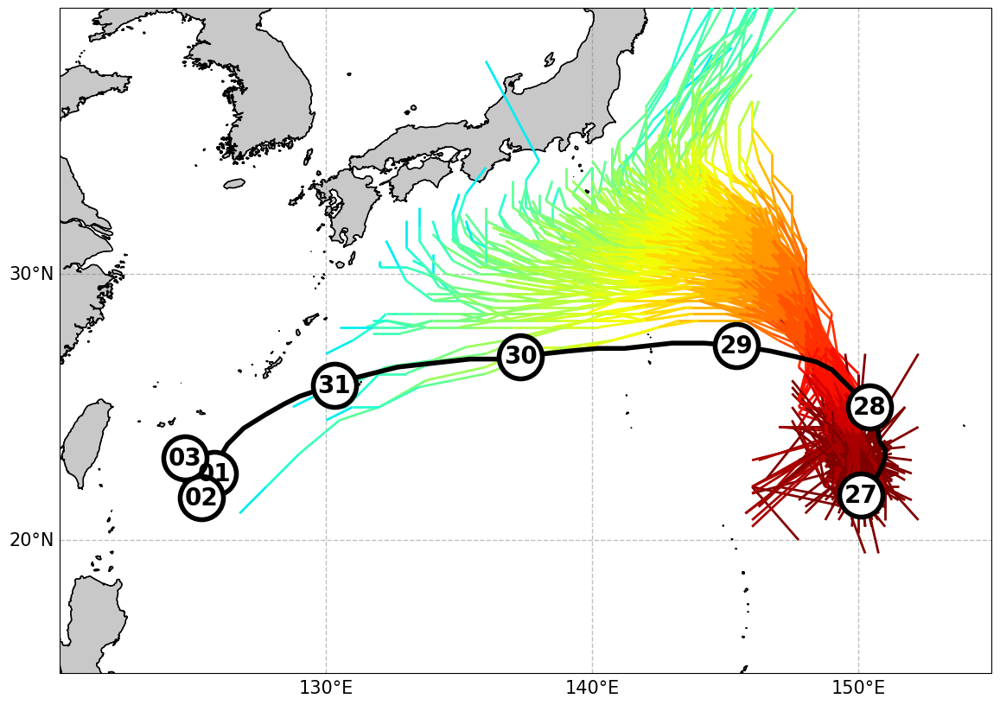

In [16]:
ens_idx_list = []
        
for ens in ens_list[:]:
    if (target_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

for predict_interval in range(168, 169, 12):
# storm_lon, storm_lat, storm_mslp, storm_time = storm_info(pangu_dir, storm_name, storm_year, datetime_list = None, wind_thres=0)   #태풍 영문명, 년도 입력
# storm_lon, storm_lat, storm_mslp, storm_time = storm_info(pangu_dir, storm_name, storm_year, datetime_list = datetime_list, wind_thres=0)   #태풍 영문명, 년도 입력
# for predict_interval in range(12, 13, 12):
    datetime1 = key_time + timedelta(hours=int(predict_interval))


            
    for key_time ,min_position in ssv_dict.items():
        fig, ax = plt.subplots(1, 1, figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
        key_str = key_time.strftime("%m.%d.%HUTC")
        if storm_name == 'DEBBY':
            ax.set_extent([255,290,20,45], crs=proj)
        else:
            ax.set_extent([120,155,15,40], crs=proj)
        # ocean_color = mcolors.to_rgba((147/255, 206/255, 229/255))
        land_color = mcolors.to_rgba((200/255, 200/255, 200/255))
        ax.add_feature(cfeature.LAND, color=land_color, edgecolor='none')
        # ax.add_feature(cfeature.OCEAN, color=ocean_color)
        ax.coastlines(resolution='10m', color='black', linewidth=1)
        # map_gridlines(ax, proj, font_size=20)
        map_background(ax, proj)

        ax.plot(storm_lon[:57], storm_lat[:57], color='black', linestyle='-', marker='', transform=ax.projection, zorder=10, linewidth=4)
        for i in range(len(storm_usa_type))[:57:2]:
            new_time = storm_time[i].strftime("%Y/%m/%d/%HUTC")
            if new_time.endswith('00UTC'):
                ax.scatter(storm_lon[i], storm_lat[i], color='w', transform=ax.projection, zorder=10, s=1300, edgecolors='black', linewidth=4)
                ax.text(storm_lon[i], storm_lat[i], new_time[8:-6]
                        , horizontalalignment='center', verticalalignment='center', fontsize=20, zorder = 20, fontweight = 'bold')



        for ens in ens_list:  
        # for ens in ens_idx_list:  
        # for ens in [0]:  
            # print(ens)

            pred_times = [pos for pos, _ in min_position[ens].items()]
            if datetime1 in pred_times:
                time_idx = pred_times.index(datetime1)
            elif any(key < datetime1 for key in min_position[ens].keys()):
                time_idx = -1
            else:
                continue
            lons = [pos['lon'] for _,pos in min_position[ens].items()][:time_idx]
            lats = [pos['lat'] for _,pos in min_position[ens].items()][:time_idx]
            min_values = [pos['mslp'] for _,pos in min_position[ens].items()][:time_idx]
            pred_times = [pos for pos, _ in min_position[ens].items()][:time_idx]
            z = np.array([(t - key_time).total_seconds() / 3600 for t in pred_times])
            # print(ens)
            if len(lons) < 1:
                continue
            # ax.plot(lons, lats, color='red', linestyle='-', marker='', transform=ax.projection, zorder=5, linewidth=4)
            # ax.scatter(lons[-1], lats[-1], color='red', s=400, transform=ax.projection, zorder=5, marker = tcmarkers.HU)
            lc = colorline(ax, lons, lats, z=z, cmap=plt.get_cmap('jet_r'), norm=mcolors.Normalize(vmin=0, vmax=168), linewidth=2, alpha=1, transform=ax.projection, zorder=5)
            # lc = colorline(ax, lons, lats, z=z, cmap=plt.get_cmap('jet_r'), norm=mcolors.Normalize(vmin=0, vmax=12), linewidth=2, alpha=0.1, transform=ax.projection, zorder=5)

        # # --- 오버레이 텍스트 생성 ---
        # text_str = f"{datetime1.strftime('%m/%d %HZ')} (+{predict_interval}h)"

        # # 오른쪽 위에 박스 스타일로 표시 (axes fraction 사용)
        # ax.text(
        #     0.98, 0.97, text_str,             # x, y (axes 좌표: 1,1이 오른쪽 위)
        #     transform=ax.transAxes,
        #     ha='right', va='top',
        #     fontsize=20,
        #     fontweight='bold',
        #     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4', alpha=0.85),
        #     zorder=99,
        # )
        # fig.savefig(f'/home1/jek/Pangu-Weather/plot/{storm_name}_Ensemble_track_{predict_interval}h_lc.png',bbox_inches='tight')
        # plt.close(fig)
        plt.show()




In [40]:
for predict_interval in range(0, 97, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)

    print(predict_interval, len(ens_idx_list))

0 13
6 2633
12 2984
18 3211
24 3272
30 3279
36 3284
42 3285
48 3285
54 3285
60 3285
66 3285
72 3285
78 3285
84 3282
90 3281
96 3191


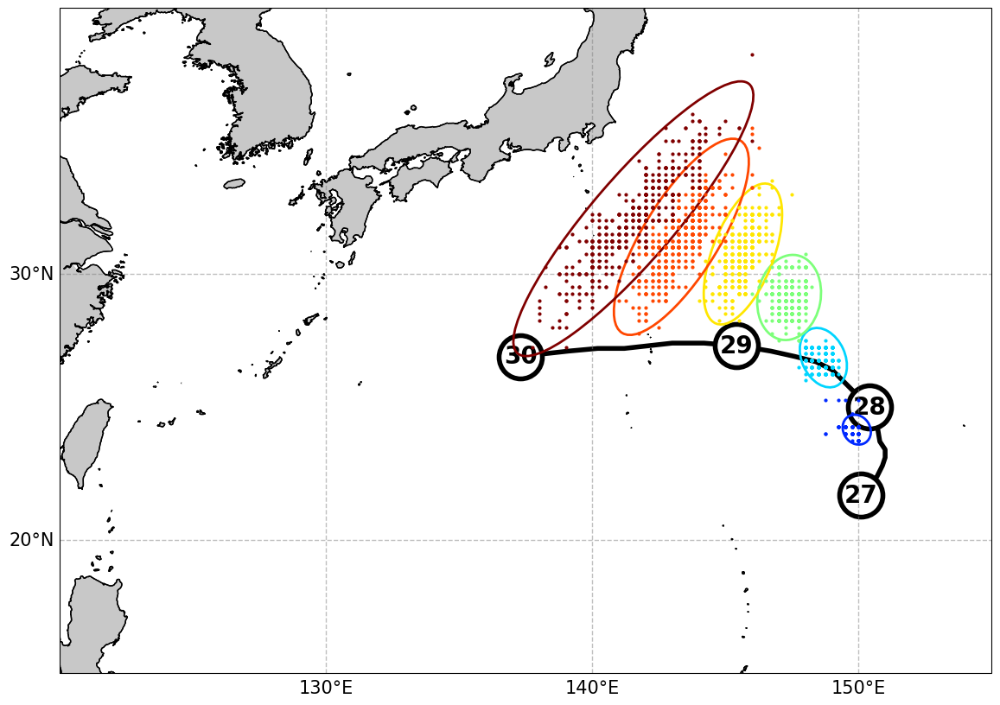

In [71]:
ens_idx_list = []
        
for ens in ens_list[:]:
    if (target_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)


# 데이터를 추출합니다
tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])

#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])


for key_time ,min_position in ssv_dict.items():
    fig, ax = plt.subplots(1, 1, figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
    key_str = key_time.strftime("%m.%d.%HUTC")
    ax.set_extent([120,155,15,40], crs=proj)
    ax.add_feature(cfeature.LAND, color=mcolors.to_rgba((200/255, 200/255, 200/255)), edgecolor='none')
    ax.coastlines(resolution='10m', color='black', linewidth=1)
    map_background(ax, proj, gl_alpha=20)

    mean_lon_list = []
    mean_lat_list = []

    ax.plot(storm_lon[:25], storm_lat[:25], color='black', linestyle='-', marker='', transform=ax.projection, zorder=-1, linewidth=4)
    for i in range(len(storm_usa_type))[:25:2]:
        new_time = storm_time[i].strftime("%Y/%m/%d/%HUTC")
        if new_time.endswith('00UTC'):
            ax.scatter(storm_lon[i], storm_lat[i], color='w', transform=ax.projection, zorder=0, s=1300, edgecolors='black', linewidth=4)
            ax.text(storm_lon[i], storm_lat[i], new_time[8:-6]
                    , horizontalalignment='center', verticalalignment='center', fontsize=20, zorder = 0, fontweight = 'bold')
    import matplotlib.cm as cm

    norm = mcolors.Normalize(vmin=0, vmax=72)  # 0~168 사이
    cmap = cm.get_cmap("jet")
    for predict_interval in [12,24,36,48,60,72]:
        color = cmap(norm(predict_interval))
        datetime1 = key_time + timedelta(hours=int(predict_interval))
        mean_lon = []
        mean_lat = []

        mid_idx_list = []
            
        for ens in ens_list:
            if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
                mid_idx_list.append(ens)

        mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in mid_idx_list])

        import matplotlib.patches as mpatches
        if len(mid_pos) > 2:  # 최소 3개 ensemble 있어야 ellipse 가능
            # 공분산 계산 (경도, 위도)
            cov = np.cov(mid_pos.T)
            vals, vecs = np.linalg.eigh(cov)

            # 고유값 정렬 (큰게 장축)
            order = vals.argsort()[::-1]
            vals, vecs = vals[order], vecs[:, order]

            # 타원의 장단축 길이 (표준편차 기반, 2σ로 크게 그림)
            width, height = 2 * np.sqrt(vals) * 2  # factor=2 → 95% confidence
            angle = np.degrees(np.arctan2(*vecs[:,0][::-1]))  # 회전각

            # 중심점
            mean_lon_val, mean_lat_val = np.mean(mid_pos[:,0]), np.mean(mid_pos[:,1])

            # 타원 객체 생성
            ellip = mpatches.Ellipse(
                (mean_lon_val, mean_lat_val),
                width=width*1.5, height=height*1.5,
                angle=angle,
                edgecolor=color, facecolor="none",
                lw=2, zorder=5, transform=ccrs.PlateCarree()
            )
            ax.add_patch(ellip)



        corr_pos_mid = np.copy(mid_pos)
        corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
        pca_mid = PCA(n_components=1)
        pca_mid.fit(corr_pos_mid)
        pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
        # color = 'blue' if predict_interval == 0 else plt.get_cmap('jet_r')((predict_interval) / (96))  # 색상 맵을 사용하여 색상 지정
        for ens in ens_list:
            pred_times = [pos for pos, _ in min_position[ens].items()]
            if datetime1 in pred_times:
                # Find the exact 00UTC prediction for this ensemble and predict_interval
                predicted_pos = min_position[ens].get(datetime1)
                if predicted_pos:
                    ax.plot(predicted_pos['lon'], predicted_pos['lat'],
                            marker='o', markersize=2, color=color,
                            linestyle='None', transform=ax.projection, zorder=10,
                            label=f'Ensemble {ens} 00UTC', alpha = 1) # Add a label for clarity
                    
                mean_lon.append(predicted_pos['lon'])
                mean_lat.append(predicted_pos['lat'])
                    
            elif any(key < datetime1 for key in min_position[ens].keys()):
                # If datetime1 is not an exact match but there are earlier predictions,
                # you might want to find the closest 00UTC prediction before datetime1
                # or just skip if you only want exact 00UTC for the predict_interval.
                # For this specific request, we'll only plot the exact predict_interval if it's 00UTC.
                pass
            else:
                continue
       
        # if predict_interval != 96:
        #     ax.quiver(pca_mid.mean_[0]-axis_vec_dict[predict_interval][0]*3, pca_mid.mean_[1]-axis_vec_dict[predict_interval][1]*3,  axis_vec_dict[predict_interval][0],  axis_vec_dict[predict_interval][1] , scale=6, color='r', width=0.005, label='Principal Axis', zorder = 30)
        # else:
        #     ax.quiver(pca_mid.mean_[0]-axis_vec_dict[predict_interval][0]*3, pca_mid.mean_[1]-axis_vec_dict[predict_interval][1]*3,  axis_vec_dict[predict_interval][0],  axis_vec_dict[predict_interval][1] , scale=6, color='r', width=0.005, label='Principal Axis', zorder = 30)


        # --- 오버레이 텍스트 생성 ---
        # text_str = f"{datetime1.strftime('%m/%d %HZ')} (+{predict_interval}h)"

        # # 오른쪽 위에 박스 스타일로 표시 (axes fraction 사용)
        # ax.text(
        #     0.98, 0.97, text_str,             # x, y (axes 좌표: 1,1이 오른쪽 위)
        #     transform=ax.transAxes,
        #     ha='right', va='top',
        #     fontsize=20,
        #     fontweight='bold',
        #     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4', alpha=0.85),
        #     zorder=99,
        # )
        # fig.savefig(f'/home1/jek/Pangu-Weather/plot/{storm_name}_Ensemble_track_{predict_interval}h_lc.png',bbox_inches='tight')
        # plt.close(fig)
        mean_lon_list.append(np.mean(mean_lon))
        mean_lat_list.append(np.mean(mean_lat))
    # ax.plot(mean_lon_list, mean_lat_list, color='blue', linestyle='-', marker='', transform=ax.projection, zorder=5, alpha = 1, label='Mean Ensemble Track')
    # ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    plt.show()

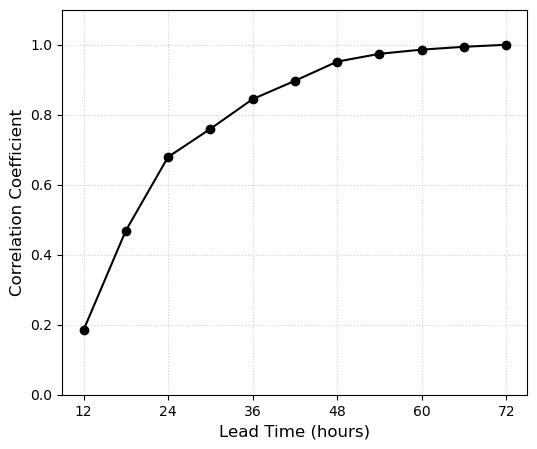

Best Angles for each lead time: [110.0, 80.0, 80.0, 80.0, 80.0, 80.0, 250.00000000000003, 70.0, 70.0, 59.99999999999999, 50.0]


In [104]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from datetime import timedelta

# 탐색할 각도 리스트 (라디안)
angles = np.arange(0, 360, 10)
rad_angles = np.radians(angles)

final_corr_list = []
best_angles = []

for analysis_hour in range(12, 73, 6):
    analysis_time = key_time + timedelta(hours=analysis_hour)
    
    # 1. 데이터 추출 및 numpy 배열 변환
    mid_lon = np.array([ssv_dict[key_time][ens][analysis_time]['lon'] for ens in mems_sort])
    mid_lat = np.array([ssv_dict[key_time][ens][analysis_time]['lat'] for ens in mems_sort])
    tar_lon = np.array([ssv_dict[key_time][ens][target_time]['lon'] for ens in mems_sort])
    tar_lat = np.array([ssv_dict[key_time][ens][target_time]['lat'] for ens in mems_sort])

    # 2. 거리 왜곡 보정 및 중심화 (Anomalies)
    # Target 시점: PCA를 위해 x, y 좌표 준비
    tar_x = (tar_lon - np.mean(tar_lon)) * np.cos(np.radians(np.mean(tar_lat))) * 111.0
    tar_y = (tar_lat - np.mean(tar_lat)) * 111.0
    tar_pos_corr = np.column_stack([tar_x, tar_y])
    
    # Analysis(Middle) 시점
    mid_x = (mid_lon - np.mean(mid_lon)) * np.cos(np.radians(np.mean(mid_lat))) * 111.0
    mid_y = (mid_lat - np.mean(mid_lat)) * 111.0

    # 3. Target은 PCA로 제1주성분(가장 분산이 큰 방향) 추출 후 고정 사영
    pca = PCA(n_components=1)
    proj_tar = pca.fit_transform(tar_pos_corr).ravel()

    # 4. Middle만 사영축을 0~360도 회전하며 최적 상관관계 탐색
    max_corr = 0
    best_theta = 0
    
    for theta in rad_angles:
        # Middle 데이터를 theta 방향으로 내적(Projection)
        proj_mid = mid_x * np.cos(theta) + mid_y * np.sin(theta)
        
        # 상관관계 계산 (절대값 기준)
        current_corr = np.abs(np.corrcoef(proj_tar, proj_mid)[0, 1])
        
        if current_corr > max_corr:
            max_corr = current_corr
            best_theta = np.degrees(theta)
            
    final_corr_list.append(max_corr)
    best_angles.append(best_theta)

# 5. 결과 시각화
fig, ax1 = plt.subplots(figsize=(6, 5))

# 상관관계 선 그래프
ax1.plot(list(range(12, 73, 6)), final_corr_list, marker='o', color='black', label='Max Correlation')
ax1.set_xlabel('Lead Time (hours)', fontsize = 12)
ax1.set_ylabel('Correlation Coefficient', fontsize = 12)
ax1.set_ylim(0, 1.1)
ax1.grid(True, linestyle=':', alpha=0.6)

# 최적 각도 표시 (텍스트)
# for i, txt in enumerate(best_angles):
#     ax1.annotate(f"{txt:.0f}°", ([12, 24, 36, 48, 60, 72][i], final_corr_list[i]), 
#                  textcoords="offset points", xytext=(0,10), ha='center', fontsize=9, color='blue')

plt.xticks([12, 24, 36, 48, 60, 72])
plt.show()

print("Best Angles for each lead time:", best_angles)

12시간 시점 앙상블 멤버 수: 406
총 14개의 고유 지점에 406명의 멤버가 분포합니다.


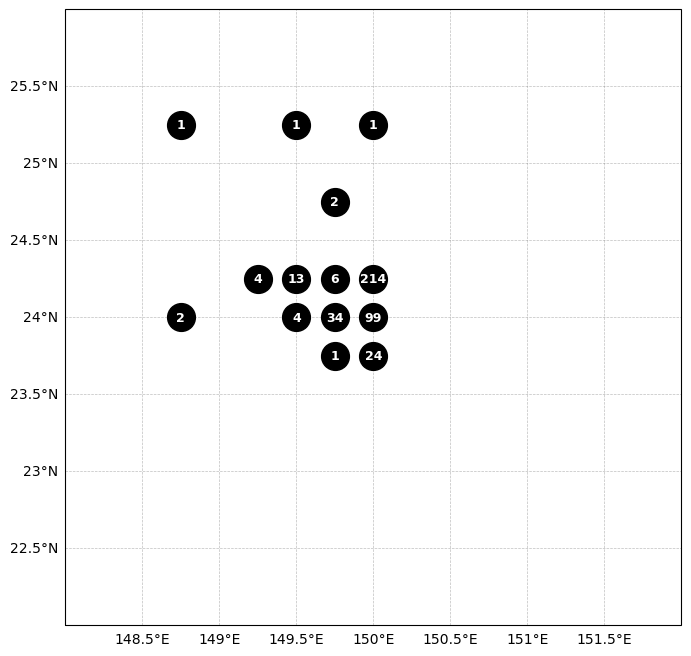

In [50]:
# 1) 12시간(T0 + 12h) 시점의 데이터 필터링 및 카운트
target_time = key_time + timedelta(hours=12)
pos_12h = []

for ens in range(500):
    snap_data = ssv_dict[key_time][ens].get(target_time, None)
    target_data = ssv_dict[key_time][ens].get(key_time+timedelta(hours=72), None)
    if snap_data and target_data:
        pos_12h.append([snap_data['lon'], snap_data['lat']])

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
plot_extent = [148, 152, 22, 26]
ax.set_extent(plot_extent, crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='lightgray')
# 2) 앙상블 멤버가 존재할 경우 지도에 표시
if pos_12h:
    pos_12h = np.array(pos_12h)
    num_12h = len(pos_12h)
    
    # 표시할 위치 결정 (멤버들 위치의 평균값)
    avg_lon = np.mean(pos_12h[:, 0])
    avg_lat = np.mean(pos_12h[:, 1])
    
    # 지도(ax)에 텍스트 표시
    # transform=ccrs.PlateCarree()를 꼭 지정해야 경위도 좌표계로 찍힙니다.
    # (선택사항) 해당 시점의 멤버들을 점으로 표시하고 싶다면
    ax.scatter(pos_12h[:, 0], pos_12h[:, 1], color='red', s=5, 
               transform=ccrs.PlateCarree(), zorder=14, alpha=0.5)

print(f"12시간 시점 앙상블 멤버 수: {len(pos_12h)}")

from collections import Counter


# 2) 각 좌표별 발생 횟수 계산
# 결과 예시: {(145.2, 22.1): 5, (146.0, 23.5): 2, ...}
counts = Counter(tuple(pos) for pos in pos_12h)

# 3) 지도에 각 점(Point)별 개수 표시
for (lon, lat), count in counts.items():
    # 실제 점 찍기
    ax.scatter(lon, lat, color='black', s=400, transform=ccrs.PlateCarree(), zorder=14)
    
    # 해당 점 위에 개수(N) 표시
    # va='bottom'으로 설정하여 점 바로 위에 텍스트가 오도록 함
    ax.text(lon, lat, str(count), 
            transform=ccrs.PlateCarree(),
            color='White', 
            fontsize=9, 
            fontweight='bold',
            ha='center', va='center',
            zorder=15)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  
gl.right_labels = False
print(f"총 {len(counts)}개의 고유 지점에 {len(pos_12h)}명의 멤버가 분포합니다.")

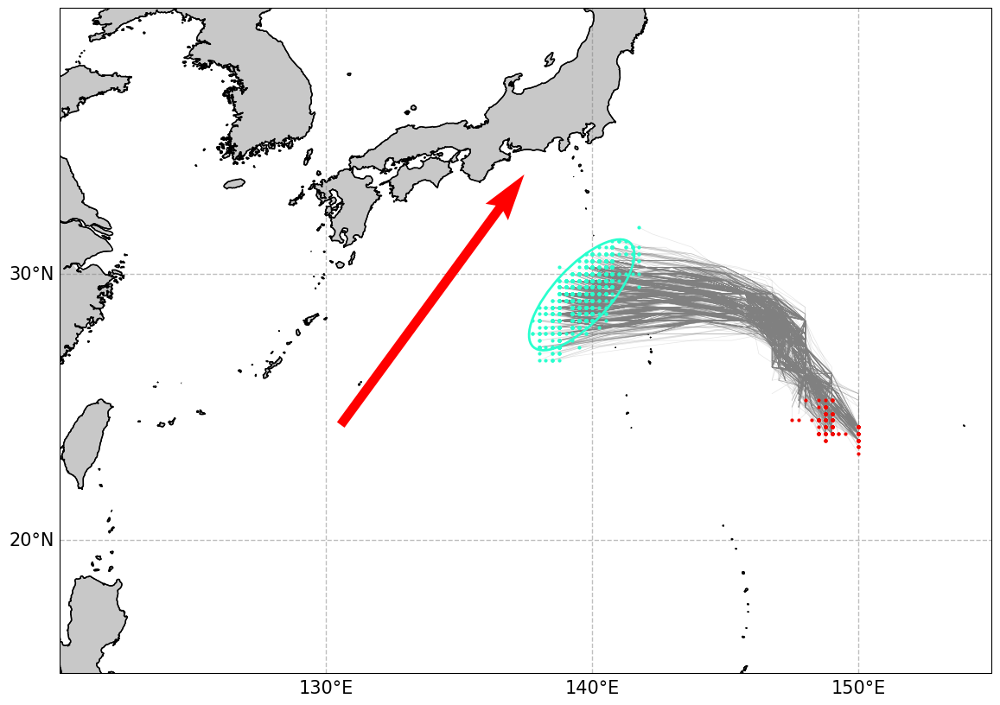

In [21]:
ens_idx_list = []
        
for ens in ens_list[:]:
    if (target_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)


# 데이터를 추출합니다
tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])

#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])


for key_time ,min_position in ssv_dict.items():
    fig, ax = plt.subplots(1, 1, figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
    key_str = key_time.strftime("%m.%d.%HUTC")
    ax.set_extent([120,155,15,40], crs=proj)
    ax.add_feature(cfeature.LAND, color=mcolors.to_rgba((200/255, 200/255, 200/255)), edgecolor='none')
    ax.coastlines(resolution='10m', color='black', linewidth=1)
    map_background(ax, proj, gl_alpha=20)


    mean_lon_list = []
    mean_lat_list = []


    #96h까지의 경로들 그리기
    for ens in ens_list:  
        # print(ens)

        pred_times = [pos for pos, _ in min_position[ens].items()]
        if key_time + timedelta(hours=72) in pred_times:
            time_idx = pred_times.index(key_time + timedelta(hours=72))
        elif any(key < key_time + timedelta(hours=72) for key in min_position[ens].keys()):
            time_idx = -1
        else:
            continue

        if key_time + timedelta(hours=12) in pred_times:
            start_idx = pred_times.index(key_time + timedelta(hours=12))
        else:
            start_idx = 0
        lons = [pos['lon'] for _,pos in min_position[ens].items()][start_idx:time_idx+1]
        lats = [pos['lat'] for _,pos in min_position[ens].items()][start_idx:time_idx+1]
        plt.plot(lons, lats, color='gray', alpha = 0.2, linewidth = 0.5)


    import matplotlib.cm as cm

    norm = mcolors.Normalize(vmin=0, vmax=120)  # 0~168 사이
    cmap = cm.get_cmap("jet_r")
    for predict_interval in [12, 72]:
        color = cmap(norm(predict_interval))
        datetime1 = key_time + timedelta(hours=int(predict_interval))
        mean_lon = []
        mean_lat = []

        mid_idx_list = []
            
        for ens in ens_list:
            if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
                mid_idx_list.append(ens)

        mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in mid_idx_list])

        import matplotlib.patches as mpatches
        if len(mid_pos) > 2 and predict_interval == 72:  # 최소 3개 ensemble 있어야 ellipse 가능
            # 공분산 계산 (경도, 위도)
            cov = np.cov(mid_pos.T)
            vals, vecs = np.linalg.eigh(cov)

            # 고유값 정렬 (큰게 장축)
            order = vals.argsort()[::-1]
            vals, vecs = vals[order], vecs[:, order]

            # 타원의 장단축 길이 (표준편차 기반, 2σ로 크게 그림)
            width, height = 2 * np.sqrt(vals) * 2  # factor=2 → 95% confidence
            angle = np.degrees(np.arctan2(*vecs[:,0][::-1]))  # 회전각

            # 중심점
            mean_lon_val, mean_lat_val = np.mean(mid_pos[:,0]), np.mean(mid_pos[:,1])

            # 타원 객체 생성
            ellip = mpatches.Ellipse(
                (mean_lon_val, mean_lat_val),
                width=width*1.5, height=height*1.5,
                angle=angle,
                edgecolor=color, facecolor="none",
                lw=2, zorder=5, transform=ccrs.PlateCarree()
            )
            ax.add_patch(ellip)



        corr_pos_mid = np.copy(mid_pos)
        corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
        pca_mid = PCA(n_components=1)
        pca_mid.fit(corr_pos_mid)
        pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
        # color = 'blue' if predict_interval == 0 else plt.get_cmap('jet_r')((predict_interval) / (96))  # 색상 맵을 사용하여 색상 지정
        for ens in ens_list:
            pred_times = [pos for pos, _ in min_position[ens].items()]
            if datetime1 in pred_times:
                # Find the exact 00UTC prediction for this ensemble and predict_interval
                predicted_pos = min_position[ens].get(datetime1)
                if predicted_pos:
                    ax.plot(predicted_pos['lon'], predicted_pos['lat'],
                            marker='o', markersize=2, color=color,
                            linestyle='None', transform=ax.projection, zorder=10,
                            label=f'Ensemble {ens} 00UTC', alpha = 1) # Add a label for clarity
                    
                mean_lon.append(predicted_pos['lon'])
                mean_lat.append(predicted_pos['lat'])
                    
            elif any(key < datetime1 for key in min_position[ens].keys()):
                # If datetime1 is not an exact match but there are earlier predictions,
                # you might want to find the closest 00UTC prediction before datetime1
                # or just skip if you only want exact 00UTC for the predict_interval.
                # For this specific request, we'll only plot the exact predict_interval if it's 00UTC.
                pass
            else:
                continue
       
        # if predict_interval != 96:
        #     ax.quiver(pca_mid.mean_[0]-axis_vec_dict[predict_interval][0]*3, pca_mid.mean_[1]-axis_vec_dict[predict_interval][1]*3,  axis_vec_dict[predict_interval][0],  axis_vec_dict[predict_interval][1] , scale=6, color='r', width=0.005, label='Principal Axis', zorder = 30)
        # else:
        #     ax.quiver(pca_mid.mean_[0]-axis_vec_dict[predict_interval][0]*3, pca_mid.mean_[1]-axis_vec_dict[predict_interval][1]*3,  axis_vec_dict[predict_interval][0],  axis_vec_dict[predict_interval][1] , scale=6, color='r', width=0.005, label='Principal Axis', zorder = 30)


        # --- 오버레이 텍스트 생성 ---
        # text_str = f"{datetime1.strftime('%m/%d %HZ')} (+{predict_interval}h)"

        # # 오른쪽 위에 박스 스타일로 표시 (axes fraction 사용)
        # ax.text(
        #     0.98, 0.97, text_str,             # x, y (axes 좌표: 1,1이 오른쪽 위)
        #     transform=ax.transAxes,
        #     ha='right', va='top',
        #     fontsize=20,
        #     fontweight='bold',
        #     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4', alpha=0.85),
        #     zorder=99,
        # )
        # fig.savefig(f'/home1/jek/Pangu-Weather/plot/{storm_name}_Ensemble_track_{predict_interval}h_lc.png',bbox_inches='tight')
        # plt.close(fig)
        mean_lon_list.append(np.mean(mean_lon))
        mean_lat_list.append(np.mean(mean_lat))
    # ax.plot(mean_lon_list, mean_lat_list, color='blue', linestyle='-', marker='', transform=ax.projection, zorder=5, alpha = 1, label='Mean Ensemble Track')
    ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    plt.show()

### 각 시간대 별 생존한 앙상블 개수

In [51]:
# target_time = datetime(2022,8,31,0)           #위치 projection을 구하고자 하는 시간
# key_time = datetime(2022,8,27,0)
for predict_interval in range(0, 96+1, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]
    print(f'{predict_interval}h')
    print(f'Number of ensemble members: {len(ens_idx_list)}')

0h
Number of ensemble members: 159
6h
Number of ensemble members: 206
12h
Number of ensemble members: 406
18h
Number of ensemble members: 431
24h
Number of ensemble members: 449
30h
Number of ensemble members: 449
36h
Number of ensemble members: 449
42h
Number of ensemble members: 449
48h
Number of ensemble members: 449
54h
Number of ensemble members: 449
60h
Number of ensemble members: 449
66h
Number of ensemble members: 449
72h
Number of ensemble members: 449
78h
Number of ensemble members: 336
84h
Number of ensemble members: 306
90h
Number of ensemble members: 157
96h
Number of ensemble members: 91


## Draw IBTRACS TRACK & Intensity

findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


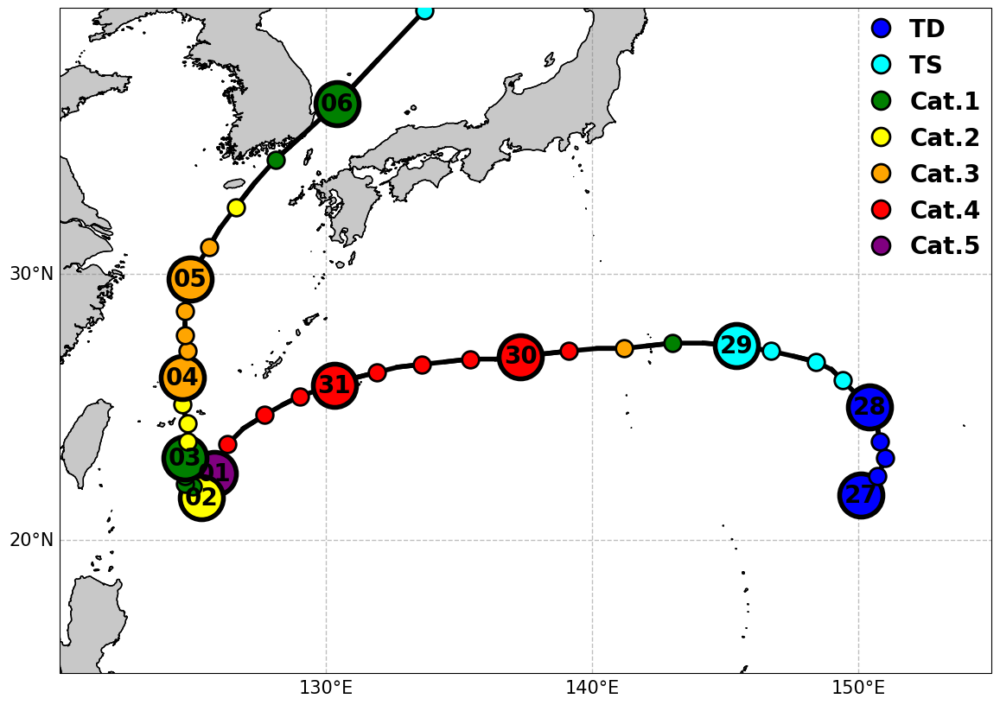

In [ ]:
fig, ax = plt.subplots(figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
ax.set_extent([120,155,15,40], crs=proj)
# ax.add_feature(cfeature.LAND, color=mcolors.to_rgba((200/255, 200/255, 200/255)), edgecolor='none')
map_background(ax, proj, back_color='y', land_rgb = (200/255, 200/255, 200/255), ocean_rgb = (1,1,1), gridline_spaces=10)

legend_handles = []
# Keep track of which labels have already been added to avoid duplicates
added_labels = set()

for i in range(len(storm_usa_type))[::2]:
    current_type = storm_cat[i]
    if current_type in color_dict:
        # Plot the storm track with the corresponding color
        if storm_time[i] == datetime(2022, 8, 28, 0):
            current_type = 'TD'  # 태풍이 TD로 시작하는 경우
        ax.plot(storm_lon[i: i+4], storm_lat[i: i+4], color='black', linestyle='-', marker='', transform=ax.projection, zorder=10, linewidth=4)
        ax.scatter(storm_lon[i], storm_lat[i], color=color_dict[current_type], transform=ax.projection, zorder=10, s=200, edgecolors='black', linewidth=2)


        new_time = storm_time[i].strftime("%Y/%m/%d/%HUTC")
        if new_time.endswith('00UTC'):
            ax.scatter(storm_lon[i], storm_lat[i], color=color_dict[current_type], transform=ax.projection, zorder=10, s=1300, edgecolors='black', linewidth=4)
            dx, dy = 0, -0  # 시간 나타낼 위치 조정
            new_lon, new_lat = storm_lon[i] + dx, storm_lat[i] + dy
            
            # annotate를 사용하여 텍스트와 함께 선(화살표)을 그림
            ax.text(new_lon, new_lat, new_time[8:-6]
                    , horizontalalignment='center', verticalalignment='center', fontsize=20, zorder = 20, fontweight = 'bold')
        # Add to legend handles if it's one of the types you want to label and hasn't been added yet


for current_type in legend_labels_order:
    label = legend_labels_order[current_type]
    color = color_dict[current_type]
    # Create a proxy artist for the legend
    legend_handle = mlines.Line2D([], [], color=color, marker='o', linestyle='None',
                                  markersize=15, # Adjust marker size for the legend
                                  markeredgecolor='black', # Match the edge color of your plotted points
                                  markeredgewidth=2, # Match the edge width
                                  label=label)
    legend_handles.append(legend_handle)
    added_labels.add(current_type)

# Add the legend to the plot
font_props = fm.FontProperties(size=20, weight='bold', family='Times New Roman')

# Key changes here:
ax.legend(handles=legend_handles,
          loc='upper left',          # Use 'upper left' with bbox_to_anchor
          bbox_to_anchor=(0.845, 1),  # Adjust x (1.02, 1.03 etc.) to move right. y=1 for top.
          frameon=False,
          prop=font_props,
          handletextpad=0.2,         # Decrease this value to bring marker and text closer
          borderaxespad=0.           # Optional: Reduce padding between axes and legend bbox
         )

# plt.title('Storm Tracks')
ax.coastlines(resolution='10m', color='black', linewidth=1)
plt.show()

### Find 30°N ECS typhoon

In [ ]:
ds = xr.open_dataset(rf'/home1/jek/Pangu-Weather/input_data/IBTrACS.WP.v04r01.nc')
hin_ds = ds.where((ds['season'] == storm_year) & (ds['name'] == b'HINNAMNOR'), drop=True)
storm_lat, storm_lon, storm_time, storm_speed, storm_type = hin_ds['usa_lat'][0].values.astype(np.float32), hin_ds['usa_lon'][0].values.astype(np.float32), hin_ds['iso_time'][0].values.astype('datetime64').astype(datetime), hin_ds['usa_wind'][0].values.astype(np.float32), hin_ds['nature'][0].values.astype('str')
storm_usa_type = hin_ds['usa_status'][0].values.astype('str')

storm_lat = storm_lat[(storm_lat != '') & (storm_lat != None)]
storm_lon = storm_lon[(storm_lon != '') & (storm_lon != None)]
storm_time = storm_time[(storm_time != '') & (storm_time != None)]
storm_speed = storm_speed[(storm_speed != '') & (storm_speed != None)]
storm_type = storm_type[(storm_type != '') & (storm_type != None)]
storm_usa_type = storm_usa_type[(storm_usa_type != '') & (storm_usa_type != None)]

color_dict = {'DB': 'cyan', 'TD': 'cyan', 'TS': 'green', 'TY': 'orange', 'ST': 'red', 'SSW': 'purple', 'EX': 'gray'}
type_colors = [color_dict[t] for t in storm_usa_type if t in color_dict]
# Define the order and mapping for your legend labels
legend_labels_order = {'TD': 'TD', 'TS': 'TS', 'TY': 'TY', 'ST': 'ST'}

color_dict = {'DB': 'cyan', 'TD': 'blue', 'TS': 'cyan', 'Cat.1': 'green', 'Cat.2': 'yellow', 'Cat.3': 'orange', 'Cat.4': 'red', 'Cat.5': 'purple', 'EX': 'gray'}
legend_labels_order = {'TD': f"{'TD':<5}", 'TS': f"{'TS':<5}", 'Cat.1': f"{'Cat.1':<5}", 'Cat.2': f"{'Cat.2':<5}", 'Cat.3': f"{'Cat.3':<5}", 'Cat.4': f"{'Cat.4':<5}", 'Cat.5': f"{'Cat.5':<5}"}

# Tokyo lon, lat starts from -8/28 06 UTC

def classify_tropical_cyclone(storm_speed_kt):
    """
    태풍의 최대 지속 풍속(knots)을 기준으로 강도를 분류합니다.
    사피어-심프슨 허리케인 등급을 기반으로 합니다.
    """
    if storm_speed_kt <= 33:
        return "TD"
    elif 34 <= storm_speed_kt <= 63:
        return "TS"
    elif 64 <= storm_speed_kt <= 82:
        return "Cat.1"
    elif 83 <= storm_speed_kt <= 95:
        return "Cat.2"
    elif 96 <= storm_speed_kt <= 112:
        return "Cat.3"
    elif 113 <= storm_speed_kt <= 136:
        return "Cat.4"
    elif storm_speed_kt >= 137:
        return "Cat.5"
    else:
        return "Unknown" # 예외 처리
    
storm_cat = []
for speed in storm_speed:
    category = classify_tropical_cyclone(speed)
    storm_cat.append(category)


east_china_sea_data = ds.where(
    (ds['lat'] >= 30) & (ds['lat'] <= 40) &
    (ds['lon'] >= 120) & (ds['lon'] <= 130) & (ds['usa_wind'] >= 100),
    drop=True
)

name_list = east_china_sea_data['name'].values
season_list = east_china_sea_data['season'].values
wind_list = east_china_sea_data['usa_wind'].values
lat_list = east_china_sea_data['usa_lat'].values
lon_list = east_china_sea_data['usa_lon'].values

for name, season, wind, lat, lon in zip(name_list, season_list  , wind_list, lat_list, lon_list):
    for i, j, k, l, m in zip(name, season, wind, lat, lon):
        if isinstance(i, bytes):
            # It's a bytes object, so decode it
            i = i.decode('utf-8')
            print(i, j ,f'{int(k)}kt', l, m)

GRACE 1954.0 100kt 31.6 129.9
WANDA 1956.0 110kt 30.5 120.9
EMMA 1956.0 118kt 30.4 127.4
EMMA 1956.0 115kt 31.0 127.5
EMMA 1956.0 113kt 31.4 127.6
EMMA 1956.0 110kt 32.0 127.9
EMMA 1956.0 108kt 32.9 128.4
EMMA 1956.0 105kt 34.0 129.0
EMMA 1956.0 103kt 35.2 129.8
SARAH 1959.0 110kt 30.2 125.8
SARAH 1959.0 113kt 31.1 126.3
SARAH 1959.0 115kt 32.1 126.8
SARAH 1959.0 108kt 33.1 127.4
SARAH 1959.0 100kt 34.2 128.1
JEAN 1965.0 135kt 30.1 128.8
JEAN 1965.0 130kt 30.7 129.3
JEAN 1965.0 130kt 31.4 129.6
JEAN 1965.0 130kt 32.1 130.0
WILDA 1970.0 103kt 29.9 128.7
WILDA 1970.0 100kt 30.4 128.6
BILLIE 1973.0 100kt 30.2 125.4
BABE 1977.0 105kt 30.7 125.3
BABE 1977.0 100kt 31.3 124.7
ED 1984.0 100kt 30.5 128.3
JANIS 1992.0 100kt 30.4 129.4
YANCY 1993.0 118kt 30.1 129.6
FAYE 1995.0 105kt 30.7 127.6
FAYE 1995.0 105kt 31.4 127.7
FAYE 1995.0 105kt 32.3 127.8
FAYE 1995.0 100kt 33.4 127.9
RYAN 1995.0 100kt 30.9 129.5
BART 1999.0 110kt 30.2 128.6
BART 1999.0 105kt 31.0 129.1
BART 1999.0 100kt 32.0 129.8
MAE

## GIF maker

In [49]:
import os
import re
from PIL import Image

# 이미지 폴더 경로
img_dir = r"/home1/jek/Pangu-Weather/plot"

# 이미지 확장자 목록 (원하는 형식 추가)
img_exts = ("h_lc.png")

# 파일명 오름차순 정렬
img_files = sorted([
    os.path.join(img_dir, f) 
    for f in os.listdir(img_dir)
    if (f.lower().endswith(img_exts))
])

def extract_hour(fname):
    match = re.search(r'_(\d+)h_', fname)
    return int(match.group(1)) if match else -1

img_files_sorted = sorted(img_files, key=extract_hour)

frames = []
# 예시로, 위 50픽셀, 아래 50픽셀, 왼쪽 30픽셀 잘라내기
for file in img_files_sorted[::]:
    img = Image.open(file)
    frames.append(img)

# GIF로 저장 (duration=각 프레임 밀리초)
frames[0].save(
    os.path.join(img_dir, f"{storm_name}_lc.gif"),
    save_all=True,
    append_images=frames[1:],
    duration=500,  # 0.1초당 한장 (원하면 수정)
    loop=0
)

print("GIF 저장 완료!")


GIF 저장 완료!


# <span style ="background:yellow; color:blue; font-weight:bold">**Calculate & Draw Sensitivity 🔢**</span>

In [7]:
def prep_x_flat(x_array, dtype=np.float32):
    N = x_array.shape[0]
    grid_shape = x_array.shape[1:]
    x_flat = x_array.reshape(N, -1).astype(dtype, copy=False)
    return x_flat, grid_shape

def prep_x_norm(x_array, ddof=1, eps_rel=1e-6, dtype=np.float32):
    N = x_array.shape[0]
    x = x_array.reshape(N, -1).astype(dtype, copy=False)
    mean = x.mean(axis=0)
    var = x.var(axis=0, ddof=ddof)

    # var 스케일 기반 eps: 중앙값 * eps_rel
    var_med = np.median(var[var > 0]) if np.any(var > 0) else 0.0
    eps = eps_rel * var_med

    std = np.sqrt(var + eps)
    std[std == 0] = 1.0
    return (x - mean) / std, x_array.shape[1:]


def torn_bootstrap_fast(x_flat, k, n_boot=5000, batch=200, seed=0):
    rng = np.random.default_rng(seed)
    N, n_grid = x_flat.shape

    diff_samples = np.empty((n_boot, n_grid), dtype=np.float32)

    done = 0
    while done < n_boot:
        b = min(batch, n_boot - done)
        W = np.zeros((b, N), dtype=np.float32)

        for i in range(b):
            idx = rng.permutation(N)
            W[i, idx[:k]]     =  1.0 / k
            W[i, idx[k:2*k]]  = -1.0 / k

        diff_samples[done:done+b] = W @ x_flat
        done += b

    return diff_samples


In [16]:
from collections import defaultdict

cov_var_dict = {}
sig_mask_dict = {}
mean_flow_500hPa = {}
mean_flow_850hPa = {}
mean_steer_tc_rm = {}


mean_steer = defaultdict(dict)
mean_tc_rm = defaultdict(lambda: defaultdict(dict))
mean_map = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

# n_boot = 5000  # bootstrap 횟수
# batch=1000
# k=100
n_boot = 10  # bootstrap 횟수
batch = 1
k = 2        # Torn 그룹 크기
ENS_ERA5 = 33
Rand_num = 0
# end_num = -1 # 전체 쓸거면 -1
# k = 25        # Torn 그룹 크기
# end_num = 500 # 전체 쓸거면 -1
from pathlib import Path
def make_sig_masks(obs_diff, diff_samples, grid_shape):
    low95, high95 = np.percentile(diff_samples, [2.5, 97.5], axis=0)
    low99, high99 = np.percentile(diff_samples, [0.5, 99.5], axis=0)

    sig95 = ((obs_diff < low95) | (obs_diff > high95)).reshape(grid_shape)
    sig99 = ((obs_diff < low99) | (obs_diff > high99)).reshape(grid_shape)
    return {95: sig95, 99: sig99}

for predict_interval in range(12, 13, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))

    cov_var_dict[predict_interval] = {}
    sig_mask_dict[predict_interval] = {}
    mean_flow_500hPa[predict_interval] = {}
    mean_flow_850hPa[predict_interval] = {} 
    mean_steer_tc_rm[predict_interval] = {}

    ens_idx_list = []

    # -----------------------------
    # 1. 사용할 ensemble 멤버 선택
    # -----------------------------
    for ens in ens_list:
        # if (target_time in ssv_dict[key_time][ens]): #! u,v _tc_rm을 쓸거면 이거 선택 x
        if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
        # if (steer_target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)

    ens_idx_list = ens_idx_list[ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1)]  # ERA5와 동일한 멤버 수로 제한
    
    print(f'Processing {predict_interval} hours forecast... with {len(ens_idx_list)} ensemble members')
    
    # 데이터를 추출합니다
    tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])
    

    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

    #distance 구하기
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
    distances_tar = (projection - ensemble_mean) * 111

    # (N, M, K) N: ensemble number, M: lon, K: lat
    level_list = pres_array
    input_data_dir = f'{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}'

    d = distances_tar.astype(np.float32)
    d -= d.mean()

    # Torn 그룹 인덱스
    idx_sorted = np.argsort(distances_tar)
    group_pos = idx_sorted[-k:]
    group_neg = idx_sorted[:k]

    N = len(distances_tar)
    w_obs = np.zeros(N, dtype=np.float32)
    w_obs[group_pos] =  1.0 / k
    w_obs[group_neg] = -1.0 / k

    # -----------------------------
    # 3. Ensemble 데이터 로딩 (병목 구간)
    # -----------------------------
    delayed_results = [
        delayed(process_ens)(
            input_data_dir, ens, predict_interval,
            pres_array=pres_array,
            lon_grid=lon_grid,
            lat_grid=lat_grid,
            level=pres_array
        )
        for ens in ens_idx_list
        # for ens in range(end_num)
    ]

    with ProgressBar():
        results = compute(*delayed_results, scheduler='processes')
        print("Dask computation completed.")

    x_array_all = np.array([r[0] for r in results])
    q_col = np.array([r[1] for r in results])
    pv_all_raw = np.array([r[2] for r in results])

    x_array_all = np.transpose(x_array_all, (1, 2, 0, 3, 4)) # (N_ens, N_var, N_level, lat, lon) -> (N_var, N_level, N_ens, lat, lon)
    pv_all = np.transpose(pv_all_raw, (1, 0, 2, 3)) # (N_ens, N_level, lat, lon) -> (N_level, N_ens, lat, lon)

    del results, pv_all_raw

    # -----------------------------
    # 4. 기본 변수 (u, v, z, t ...)
    # -----------------------------
    print(f'Processing basic variables for {predict_interval} hours forecast...')
    for upper_variable_idx, upper_variable in enumerate(upper_factor):
        cov_var_dict[predict_interval][upper_variable] = {}
        sig_mask_dict[predict_interval][upper_variable] = {}

        for pres_idx, pres in enumerate(pres_array):
            x_array = x_array_all[upper_variable_idx][pres_idx]

            # ---- ESA (cov_var) ----
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval][upper_variable][pres] = ((d @ x_norm) / N).reshape(grid_shape)

            # ---- Torn sig_mask ----
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=1000 + pres_idx + 100 * upper_variable_idx
            )

            sig_mask_dict[predict_interval][upper_variable][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)

    # -----------------------------
    # 5. TPW
    # -----------------------------
    print(f'Processing TPW for {predict_interval} hours forecast...')
    q_col_norm, _ = prep_x_norm(q_col)
    cov_var_dict[predict_interval]['tpw'] = ((d @ q_col_norm) / N).reshape(grid_shape)

    x_flat, grid_shape = prep_x_flat(q_col)
    obs_diff = (w_obs @ x_flat)

    diff_samples = torn_bootstrap_fast(
        x_flat, k, n_boot=n_boot, batch=batch, seed=9999
    )

    sig_mask_dict[predict_interval]['tpw'] = make_sig_masks(obs_diff, diff_samples, grid_shape)

    # -----------------------------
    # 6. Divergence and vorticity and Mean wind flow at 500hPa, 850hPa
    # -----------------------------
    print(f'Processing divergence and vorticity for {predict_interval} hours forecast...')
    cov_var_dict[predict_interval]['div']  = {}
    cov_var_dict[predict_interval]['vort'] = {}
    sig_mask_dict[predict_interval]['div']  = {}
    sig_mask_dict[predict_interval]['vort'] = {}
    sig_mask_dict[predict_interval]['u_steer'] = {}
    sig_mask_dict[predict_interval]['v_steer'] = {}

    for pres_idx, pres in enumerate(pres_array):
        u = x_array_all[upper_dict['u'], pres_idx]
        v = x_array_all[upper_dict['v'], pres_idx]

        dx = 111000 * 0.25 * np.cos(np.radians(lat_grid))
        dy = -111000 * 0.25

        u_dx = np.gradient(u, axis=2) / dx
        u_dy = np.gradient(u, axis=1) / dy
        v_dx = np.gradient(v, axis=2) / dx
        v_dy = np.gradient(v, axis=1) / dy

        div  = u_dx + v_dy
        vort = v_dx - u_dy

        for name, x_array in zip(['div', 'vort'], [div, vort]):
            # ESA
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval][name][pres] = ((d @ x_norm) / N).reshape(grid_shape)

            # Torn
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=3000 + pres_idx
            )

            sig_mask_dict[predict_interval][name][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)
            
        if pres == 500:
            idx_500 = np.where(pres_array == 500)[0][0]
            mean_flow_500hPa[predict_interval]['u'] = np.mean(u, axis=0)
            mean_flow_500hPa[predict_interval]['v'] = np.mean(v, axis=0)
        elif pres == 850:
            idx_850 = np.where(pres_array == 850)[0][0]
            mean_flow_850hPa[predict_interval]['u'] = np.mean(u, axis=0)
            mean_flow_850hPa[predict_interval]['v'] = np.mean(v, axis=0)


    #-----------------------------
    # 7. Steering flow (850-250 hPa)
    #-----------------------------
    print(f'Processing steering flow for {predict_interval} hours forecast...')
    u_steer = weighted_sum(
        x_array_all[upper_dict['u'], steer_idx], steer_array
    )
    v_steer = weighted_sum(
        x_array_all[upper_dict['v'], steer_idx], steer_array
    )


    for name, x_array in zip(['u_steer', 'v_steer'], [u_steer, v_steer]):
        # ESA
        x_norm, grid_shape = prep_x_norm(x_array)
        cov_var_dict[predict_interval][name] = ((d @ x_norm) / N).reshape(grid_shape)

        # Torn
        x_flat, _ = prep_x_flat(x_array)
        obs_diff = (w_obs @ x_flat)

        diff_samples = torn_bootstrap_fast(
            x_flat, k,
            n_boot=n_boot,
            batch=batch,
            seed=4000 + pres_idx + predict_interval
        )

        sig_mask_dict[predict_interval][name] = make_sig_masks(obs_diff, diff_samples, grid_shape)

    # ens_factor_uv = np.load(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{start_str}_{steer_target_time.strftime("%m.%d %HUTC")}_e{len(ens_list)}/ens_factor_uv/{predict_interval}h.npy")
    # 경로 조각들 정의
    case_dir = f"{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}"
    run_id = f"{start_str}_{target_str}_e{len(ens_list)}"

    # 최종 경로 생성 (Path 객체 사용 시 슬래시(/)로 연결 가능)
    file_path = (
        Path(pangu_dir) / "output_data" / first_str / 
        case_dir / run_id / "ens_factor_uv" / f"{predict_interval}h.npy"
    )

    # 데이터 로드
    ens_factor_uv = np.load(file_path)
    if ENS_ERA5:
        u_tc_rm = ens_factor_uv[0, ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1), :, :, :]  # (N_ens, lat, lon)
        v_tc_rm = ens_factor_uv[1, ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1), :, :, :]  # (N_ens, lat, lon)
    else:
        u_tc_rm = ens_factor_uv[0, :, :, :, :]  # (N_ens, lat, lon)
        v_tc_rm = ens_factor_uv[1, :, :, :, :]  # (N_ens, lat, lon)

    u_tc_rm_steer = np.average(u_tc_rm, weights=np.array(STEER_DP), axis=1)
    v_tc_rm_steer = np.average(v_tc_rm, weights=np.array(STEER_DP), axis=1)
    mean_steer_tc_rm[predict_interval]['u'] = np.mean(u_tc_rm_steer, axis = 0)
    mean_steer_tc_rm[predict_interval]['v'] = np.mean(v_tc_rm_steer, axis = 0)

    for name, x_array_total in zip(['u_tc_rm', 'v_tc_rm'], [u_tc_rm, v_tc_rm]):
        cov_var_dict[predict_interval][name] = {}
        sig_mask_dict[predict_interval][name] = {}
        
        for pres_idx, pres in enumerate(steer_pres):
            x_array = x_array_total[:,pres_idx,:,:]
            # ESA
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval][name][pres] = ((d @ x_norm) / N).reshape(grid_shape)
            mean_tc_rm[predict_interval][name][pres] = np.nanmean(x_array, axis=0)
            # Torn
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=4000 + pres_idx + predict_interval
            )

            sig_mask_dict[predict_interval][name][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)

    for name, x_array in zip(['u_tc_rm_steer', 'v_tc_rm_steer'], [u_tc_rm_steer, v_tc_rm_steer]):
        # ESA
        x_norm, grid_shape = prep_x_norm(x_array)
        cov_var_dict[predict_interval][name] = ((d @ x_norm) / N).reshape(grid_shape)

        # Torn
        x_flat, _ = prep_x_flat(x_array)
        obs_diff = (w_obs @ x_flat)

        diff_samples = torn_bootstrap_fast(
            x_flat, k,
            n_boot=n_boot,
            batch=batch,
            seed=4000 + pres_idx + predict_interval
        )

        sig_mask_dict[predict_interval][name] = make_sig_masks(obs_diff, diff_samples, grid_shape)
    
        

    #-----------------------------
    # 8. PV
    #-----------------------------
    print(f'Processing PV for {predict_interval} hours forecast...')
    cov_var_dict[predict_interval]['pv'] = {}
    sig_mask_dict[predict_interval]['pv'] = {}

    for pres_idx, pres in enumerate(pres_array):
        x_array = pv_all[pres_idx]   # (N, lat, lon)

        # ESA
        x_norm, grid_shape = prep_x_norm(x_array)
        cov_var_dict[predict_interval]['pv'][pres] = ((d @ x_norm) / N).reshape(grid_shape)
        mean_map[predict_interval]['pv'][pres] = np.nanmean(x_array, axis=0)
        # Torn
        x_flat, _ = prep_x_flat(x_array)
        obs_diff = (w_obs @ x_flat)

        diff_samples = torn_bootstrap_fast(
            x_flat, k,
            n_boot=n_boot,
            batch=batch,
            seed=2000 + pres_idx + predict_interval
        )

        sig_mask_dict[predict_interval]['pv'][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)
    
    del x_array_all, q_col, pv_all

# import dill as pickle

# pickle.dump(
#     cov_var_dict,
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/cov_var_all_variable_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )

# pickle.dump(
#     sig_mask_dict,
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/sig_mask_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )

# pickle.dump(
#     mean_flow_500hPa,
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_500hPa_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )

# pickle.dump(
#     mean_flow_850hPa,
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_850hPa_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )

# pickle.dump(
#     mean_steer_tc_rm,
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_steer_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )

# pickle.dump(
#     dict(mean_tc_rm),
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )
# pickle.dump(
#     dict(mean_map),
#     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_map_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
# )


Processing 12 hours forecast... with 33 ensemble members
[                                        ] | 0% Completed | 111.54 us

[########################################] | 100% Completed | 2.86 ss
Dask computation completed.
Processing basic variables for 12 hours forecast...
Processing TPW for 12 hours forecast...
Processing divergence and vorticity for 12 hours forecast...
Processing steering flow for 12 hours forecast...
Processing PV for 12 hours forecast...


6
Processing 12 hours forecast... with 33 ensemble members
[########################################] | 100% Completed | 6.86 ss
Dask computation completed.
Processing basic variables for 12 hours forecast...
Processing TPW for 12 hours forecast...
Processing divergence and vorticity for 12 hours forecast...
Processing steering flow for 12 hours forecast...
Processing PV for 12 hours forecast...
Plotting sensitive wind at steerhPa for 12h forecast with 33 ENS...
max: 189.52081298828125


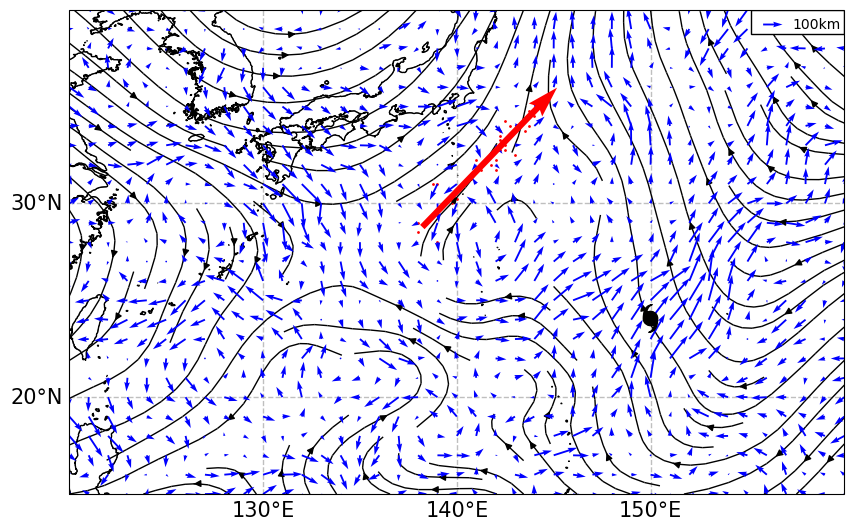

Plotting sensitive wind at 850hPa for 12h forecast with 33 ENS...
max: 169.30606079101562


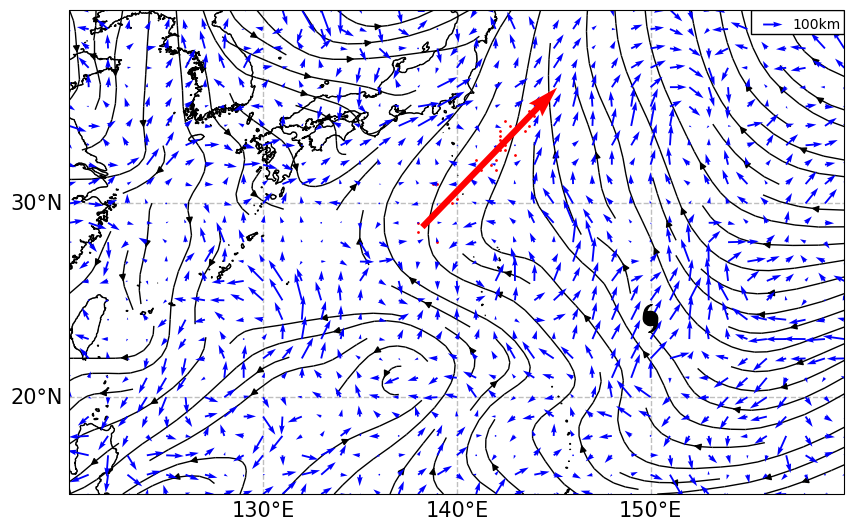

Plotting sensitive wind at 500hPa for 12h forecast with 33 ENS...
max: 166.8628692626953


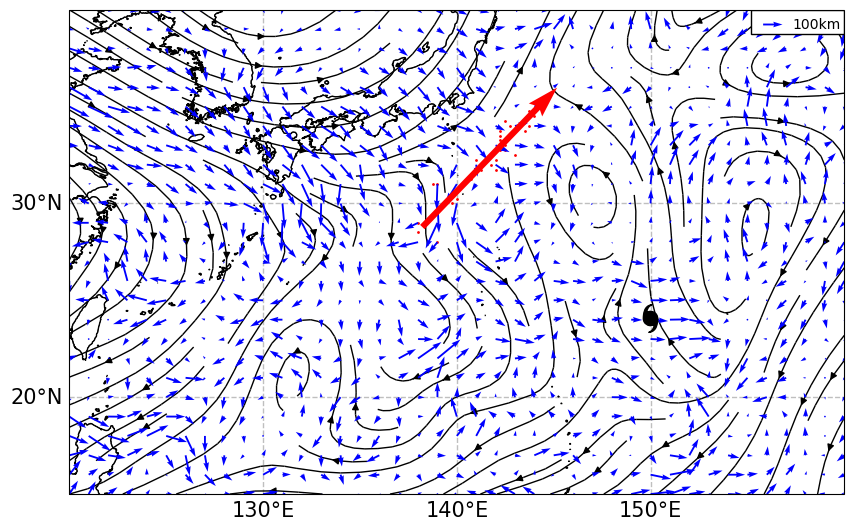

7
Processing 12 hours forecast... with 33 ensemble members
[########################################] | 100% Completed | 2.66 ss
Dask computation completed.
Processing basic variables for 12 hours forecast...
Processing TPW for 12 hours forecast...
Processing divergence and vorticity for 12 hours forecast...
Processing steering flow for 12 hours forecast...
Processing PV for 12 hours forecast...
Plotting sensitive wind at steerhPa for 12h forecast with 33 ENS...
max: 143.07330322265625


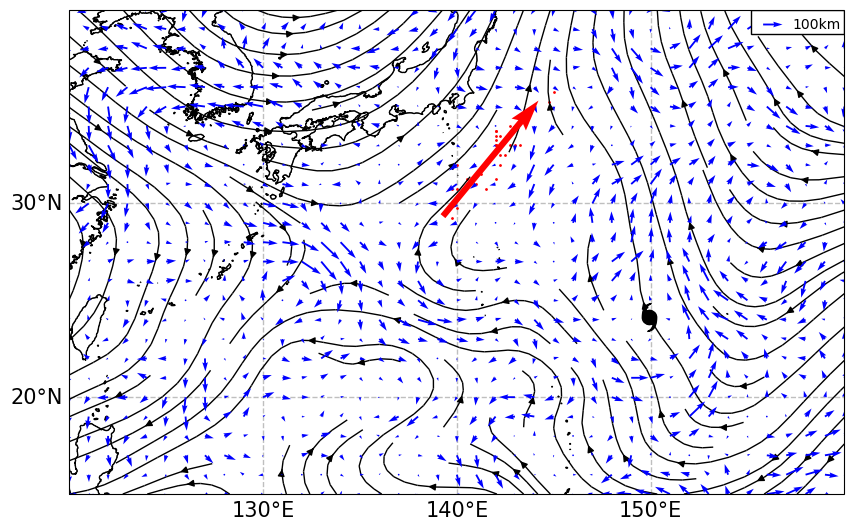

Plotting sensitive wind at 850hPa for 12h forecast with 33 ENS...
max: 137.2222900390625


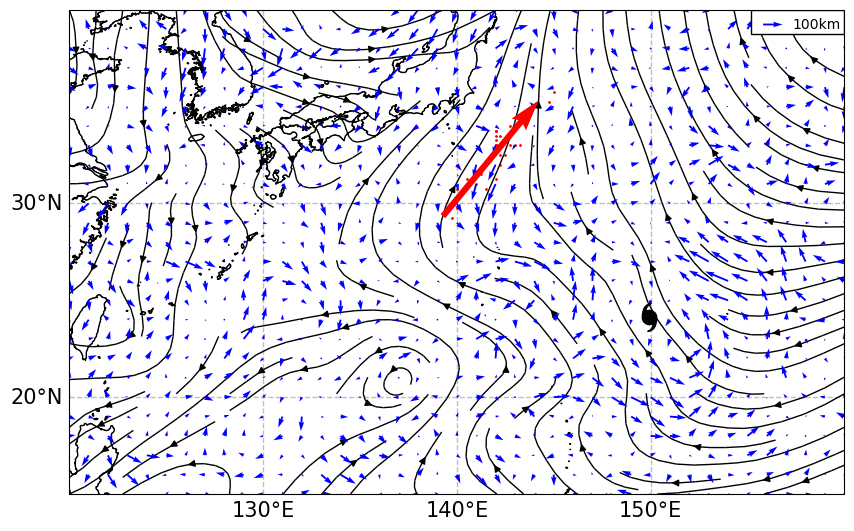

Plotting sensitive wind at 500hPa for 12h forecast with 33 ENS...
max: 140.5978240966797


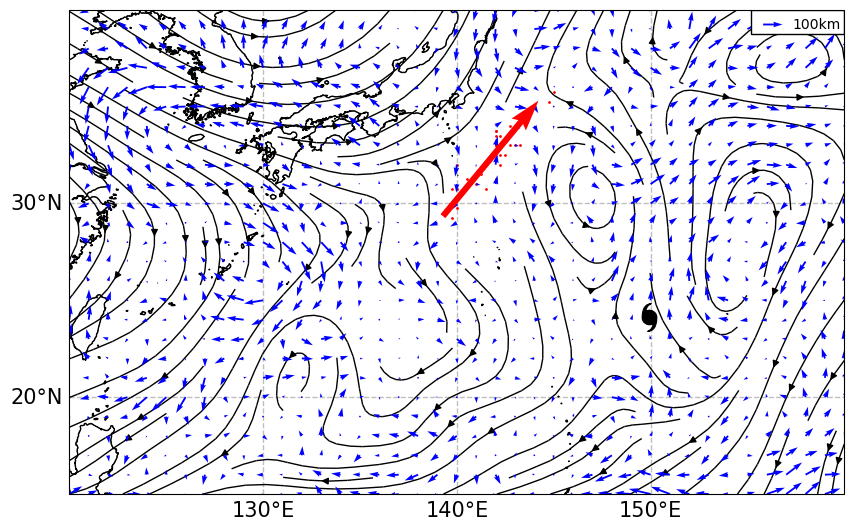

8
Processing 12 hours forecast... with 33 ensemble members
[########################################] | 100% Completed | 2.65 ss
Dask computation completed.
Processing basic variables for 12 hours forecast...
Processing TPW for 12 hours forecast...
Processing divergence and vorticity for 12 hours forecast...
Processing steering flow for 12 hours forecast...
Processing PV for 12 hours forecast...
Plotting sensitive wind at steerhPa for 12h forecast with 33 ENS...
max: 160.09963989257812


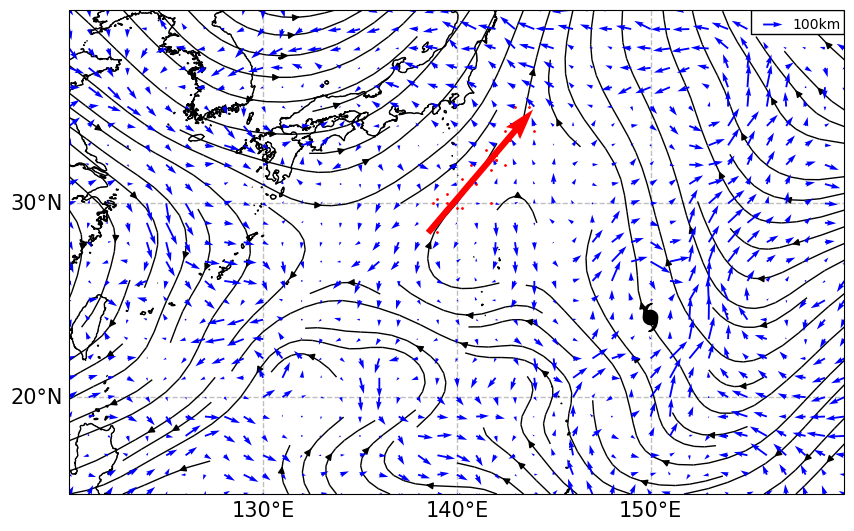

Plotting sensitive wind at 850hPa for 12h forecast with 33 ENS...
max: 148.48397827148438


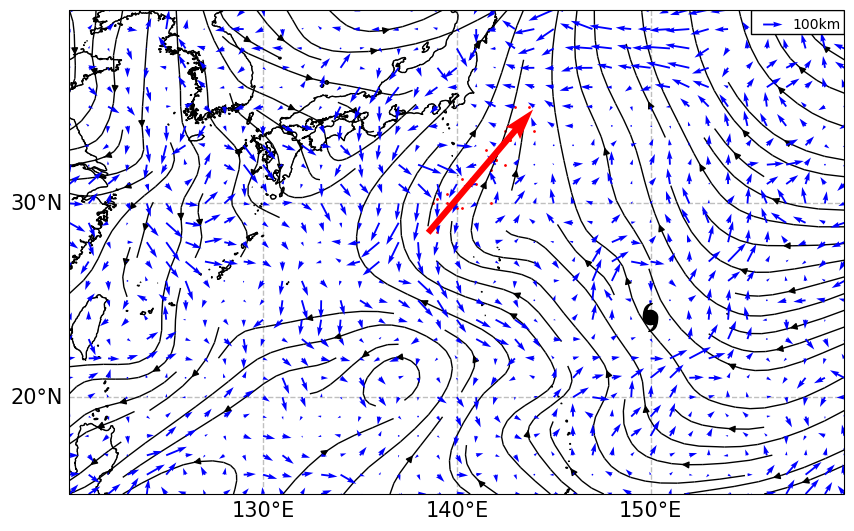

Plotting sensitive wind at 500hPa for 12h forecast with 33 ENS...
max: 161.01864624023438


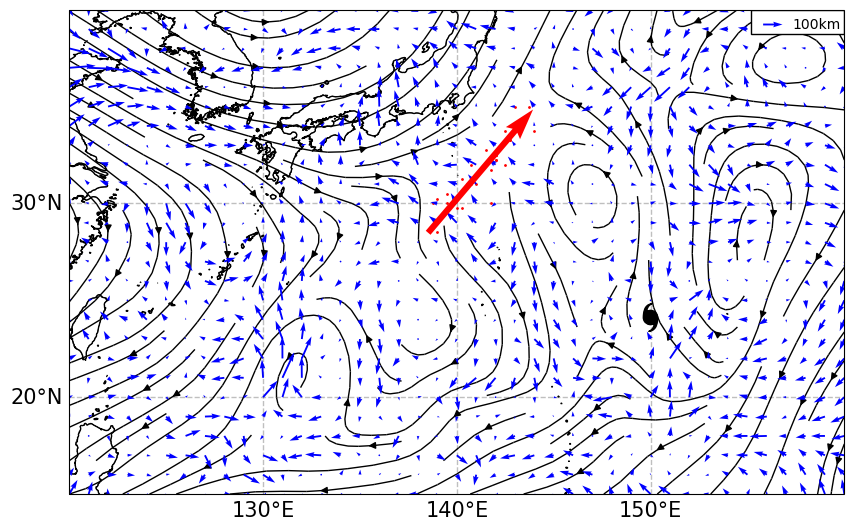

In [20]:
for Rand_num in range(6,9,1):
    print(Rand_num)
    from collections import defaultdict

    cov_var_dict = {}
    sig_mask_dict = {}
    mean_flow_500hPa = {}
    mean_flow_850hPa = {}
    mean_steer_tc_rm = {}


    mean_steer = defaultdict(dict)
    mean_tc_rm = defaultdict(lambda: defaultdict(dict))
    mean_map = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    # n_boot = 5000  # bootstrap 횟수
    # batch=1000
    # k=100
    n_boot = 10  # bootstrap 횟수
    batch = 1
    k = 2        # Torn 그룹 크기
    ENS_ERA5 = 33
    # Rand_num = 0
    # end_num = -1 # 전체 쓸거면 -1
    # k = 25        # Torn 그룹 크기
    # end_num = 500 # 전체 쓸거면 -1
    from pathlib import Path
    def make_sig_masks(obs_diff, diff_samples, grid_shape):
        low95, high95 = np.percentile(diff_samples, [2.5, 97.5], axis=0)
        low99, high99 = np.percentile(diff_samples, [0.5, 99.5], axis=0)

        sig95 = ((obs_diff < low95) | (obs_diff > high95)).reshape(grid_shape)
        sig99 = ((obs_diff < low99) | (obs_diff > high99)).reshape(grid_shape)
        return {95: sig95, 99: sig99}

    for predict_interval in range(12, 13, 6):
        datetime1 = key_time + timedelta(hours=int(predict_interval))

        cov_var_dict[predict_interval] = {}
        sig_mask_dict[predict_interval] = {}
        mean_flow_500hPa[predict_interval] = {}
        mean_flow_850hPa[predict_interval] = {} 
        mean_steer_tc_rm[predict_interval] = {}

        ens_idx_list = []

        # -----------------------------
        # 1. 사용할 ensemble 멤버 선택
        # -----------------------------
        for ens in ens_list:
            # if (target_time in ssv_dict[key_time][ens]): #! u,v _tc_rm을 쓸거면 이거 선택 x
            if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
            # if (steer_target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
                ens_idx_list.append(ens)

        ens_idx_list = ens_idx_list[ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1)]  # ERA5와 동일한 멤버 수로 제한
        
        print(f'Processing {predict_interval} hours forecast... with {len(ens_idx_list)} ensemble members')
        
        # 데이터를 추출합니다
        tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])
        

        #타겟 위치의 PCA
        corr_pos_tar = np.copy(tar_pos)
        corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
        pca_tar = PCA(n_components=1)
        pca_tar.fit(corr_pos_tar)
        pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
        ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

        #distance 구하기
        corr_pos_tar = np.copy(tar_pos)
        corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
        projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
        distances_tar = (projection - ensemble_mean) * 111

        # (N, M, K) N: ensemble number, M: lon, K: lat
        level_list = pres_array
        input_data_dir = f'{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}'

        d = distances_tar.astype(np.float32)
        d -= d.mean()

        # Torn 그룹 인덱스
        idx_sorted = np.argsort(distances_tar)
        group_pos = idx_sorted[-k:]
        group_neg = idx_sorted[:k]

        N = len(distances_tar)
        w_obs = np.zeros(N, dtype=np.float32)
        w_obs[group_pos] =  1.0 / k
        w_obs[group_neg] = -1.0 / k

        # -----------------------------
        # 3. Ensemble 데이터 로딩 (병목 구간)
        # -----------------------------
        delayed_results = [
            delayed(process_ens)(
                input_data_dir, ens, predict_interval,
                pres_array=pres_array,
                lon_grid=lon_grid,
                lat_grid=lat_grid,
                level=pres_array
            )
            for ens in ens_idx_list
            # for ens in range(end_num)
        ]

        with ProgressBar():
            results = compute(*delayed_results, scheduler='processes')
            print("Dask computation completed.")

        x_array_all = np.array([r[0] for r in results])
        q_col = np.array([r[1] for r in results])
        pv_all_raw = np.array([r[2] for r in results])

        x_array_all = np.transpose(x_array_all, (1, 2, 0, 3, 4)) # (N_ens, N_var, N_level, lat, lon) -> (N_var, N_level, N_ens, lat, lon)
        pv_all = np.transpose(pv_all_raw, (1, 0, 2, 3)) # (N_ens, N_level, lat, lon) -> (N_level, N_ens, lat, lon)

        del results, pv_all_raw

        # -----------------------------
        # 4. 기본 변수 (u, v, z, t ...)
        # -----------------------------
        print(f'Processing basic variables for {predict_interval} hours forecast...')
        for upper_variable_idx, upper_variable in enumerate(upper_factor):
            cov_var_dict[predict_interval][upper_variable] = {}
            sig_mask_dict[predict_interval][upper_variable] = {}

            for pres_idx, pres in enumerate(pres_array):
                x_array = x_array_all[upper_variable_idx][pres_idx]

                # ---- ESA (cov_var) ----
                x_norm, grid_shape = prep_x_norm(x_array)
                cov_var_dict[predict_interval][upper_variable][pres] = ((d @ x_norm) / N).reshape(grid_shape)

                # ---- Torn sig_mask ----
                x_flat, _ = prep_x_flat(x_array)
                obs_diff = (w_obs @ x_flat)

                diff_samples = torn_bootstrap_fast(
                    x_flat, k,
                    n_boot=n_boot,
                    batch=batch,
                    seed=1000 + pres_idx + 100 * upper_variable_idx
                )

                sig_mask_dict[predict_interval][upper_variable][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)

        # -----------------------------
        # 5. TPW
        # -----------------------------
        print(f'Processing TPW for {predict_interval} hours forecast...')
        q_col_norm, _ = prep_x_norm(q_col)
        cov_var_dict[predict_interval]['tpw'] = ((d @ q_col_norm) / N).reshape(grid_shape)

        x_flat, grid_shape = prep_x_flat(q_col)
        obs_diff = (w_obs @ x_flat)

        diff_samples = torn_bootstrap_fast(
            x_flat, k, n_boot=n_boot, batch=batch, seed=9999
        )

        sig_mask_dict[predict_interval]['tpw'] = make_sig_masks(obs_diff, diff_samples, grid_shape)

        # -----------------------------
        # 6. Divergence and vorticity and Mean wind flow at 500hPa, 850hPa
        # -----------------------------
        print(f'Processing divergence and vorticity for {predict_interval} hours forecast...')
        cov_var_dict[predict_interval]['div']  = {}
        cov_var_dict[predict_interval]['vort'] = {}
        sig_mask_dict[predict_interval]['div']  = {}
        sig_mask_dict[predict_interval]['vort'] = {}
        sig_mask_dict[predict_interval]['u_steer'] = {}
        sig_mask_dict[predict_interval]['v_steer'] = {}

        for pres_idx, pres in enumerate(pres_array):
            u = x_array_all[upper_dict['u'], pres_idx]
            v = x_array_all[upper_dict['v'], pres_idx]

            dx = 111000 * 0.25 * np.cos(np.radians(lat_grid))
            dy = -111000 * 0.25

            u_dx = np.gradient(u, axis=2) / dx
            u_dy = np.gradient(u, axis=1) / dy
            v_dx = np.gradient(v, axis=2) / dx
            v_dy = np.gradient(v, axis=1) / dy

            div  = u_dx + v_dy
            vort = v_dx - u_dy

            for name, x_array in zip(['div', 'vort'], [div, vort]):
                # ESA
                x_norm, grid_shape = prep_x_norm(x_array)
                cov_var_dict[predict_interval][name][pres] = ((d @ x_norm) / N).reshape(grid_shape)

                # Torn
                x_flat, _ = prep_x_flat(x_array)
                obs_diff = (w_obs @ x_flat)

                diff_samples = torn_bootstrap_fast(
                    x_flat, k,
                    n_boot=n_boot,
                    batch=batch,
                    seed=3000 + pres_idx
                )

                sig_mask_dict[predict_interval][name][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)
                
            if pres == 500:
                idx_500 = np.where(pres_array == 500)[0][0]
                mean_flow_500hPa[predict_interval]['u'] = np.mean(u, axis=0)
                mean_flow_500hPa[predict_interval]['v'] = np.mean(v, axis=0)
            elif pres == 850:
                idx_850 = np.where(pres_array == 850)[0][0]
                mean_flow_850hPa[predict_interval]['u'] = np.mean(u, axis=0)
                mean_flow_850hPa[predict_interval]['v'] = np.mean(v, axis=0)


        #-----------------------------
        # 7. Steering flow (850-250 hPa)
        #-----------------------------
        print(f'Processing steering flow for {predict_interval} hours forecast...')
        u_steer = weighted_sum(
            x_array_all[upper_dict['u'], steer_idx], steer_array
        )
        v_steer = weighted_sum(
            x_array_all[upper_dict['v'], steer_idx], steer_array
        )


        for name, x_array in zip(['u_steer', 'v_steer'], [u_steer, v_steer]):
            # ESA
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval][name] = ((d @ x_norm) / N).reshape(grid_shape)

            # Torn
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=4000 + pres_idx + predict_interval
            )

            sig_mask_dict[predict_interval][name] = make_sig_masks(obs_diff, diff_samples, grid_shape)

        # ens_factor_uv = np.load(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{start_str}_{steer_target_time.strftime("%m.%d %HUTC")}_e{len(ens_list)}/ens_factor_uv/{predict_interval}h.npy")
        # 경로 조각들 정의
        case_dir = f"{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}"
        run_id = f"{start_str}_{target_str}_e{len(ens_list)}"

        # 최종 경로 생성 (Path 객체 사용 시 슬래시(/)로 연결 가능)
        file_path = (
            Path(pangu_dir) / "output_data" / first_str / 
            case_dir / run_id / "ens_factor_uv" / f"{predict_interval}h.npy"
        )

        # 데이터 로드
        ens_factor_uv = np.load(file_path)
        if ENS_ERA5:
            u_tc_rm = ens_factor_uv[0, ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1), :, :, :]  # (N_ens, lat, lon)
            v_tc_rm = ens_factor_uv[1, ENS_ERA5*Rand_num:ENS_ERA5*(Rand_num+1), :, :, :]  # (N_ens, lat, lon)
        else:
            u_tc_rm = ens_factor_uv[0, :, :, :, :]  # (N_ens, lat, lon)
            v_tc_rm = ens_factor_uv[1, :, :, :, :]  # (N_ens, lat, lon)

        u_tc_rm_steer = np.average(u_tc_rm, weights=np.array(STEER_DP), axis=1)
        v_tc_rm_steer = np.average(v_tc_rm, weights=np.array(STEER_DP), axis=1)
        mean_steer_tc_rm[predict_interval]['u'] = np.mean(u_tc_rm_steer, axis = 0)
        mean_steer_tc_rm[predict_interval]['v'] = np.mean(v_tc_rm_steer, axis = 0)

        for name, x_array_total in zip(['u_tc_rm', 'v_tc_rm'], [u_tc_rm, v_tc_rm]):
            cov_var_dict[predict_interval][name] = {}
            sig_mask_dict[predict_interval][name] = {}
            
            for pres_idx, pres in enumerate(steer_pres):
                x_array = x_array_total[:,pres_idx,:,:]
                # ESA
                x_norm, grid_shape = prep_x_norm(x_array)
                cov_var_dict[predict_interval][name][pres] = ((d @ x_norm) / N).reshape(grid_shape)
                mean_tc_rm[predict_interval][name][pres] = np.nanmean(x_array, axis=0)
                # Torn
                x_flat, _ = prep_x_flat(x_array)
                obs_diff = (w_obs @ x_flat)

                diff_samples = torn_bootstrap_fast(
                    x_flat, k,
                    n_boot=n_boot,
                    batch=batch,
                    seed=4000 + pres_idx + predict_interval
                )

                sig_mask_dict[predict_interval][name][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)

        for name, x_array in zip(['u_tc_rm_steer', 'v_tc_rm_steer'], [u_tc_rm_steer, v_tc_rm_steer]):
            # ESA
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval][name] = ((d @ x_norm) / N).reshape(grid_shape)

            # Torn
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=4000 + pres_idx + predict_interval
            )

            sig_mask_dict[predict_interval][name] = make_sig_masks(obs_diff, diff_samples, grid_shape)
        
            

        #-----------------------------
        # 8. PV
        #-----------------------------
        print(f'Processing PV for {predict_interval} hours forecast...')
        cov_var_dict[predict_interval]['pv'] = {}
        sig_mask_dict[predict_interval]['pv'] = {}

        for pres_idx, pres in enumerate(pres_array):
            x_array = pv_all[pres_idx]   # (N, lat, lon)

            # ESA
            x_norm, grid_shape = prep_x_norm(x_array)
            cov_var_dict[predict_interval]['pv'][pres] = ((d @ x_norm) / N).reshape(grid_shape)
            mean_map[predict_interval]['pv'][pres] = np.nanmean(x_array, axis=0)
            # Torn
            x_flat, _ = prep_x_flat(x_array)
            obs_diff = (w_obs @ x_flat)

            diff_samples = torn_bootstrap_fast(
                x_flat, k,
                n_boot=n_boot,
                batch=batch,
                seed=2000 + pres_idx + predict_interval
            )

            sig_mask_dict[predict_interval]['pv'][pres] = make_sig_masks(obs_diff, diff_samples, grid_shape)
        
        del x_array_all, q_col, pv_all

    # import dill as pickle

    # pickle.dump(
    #     cov_var_dict,
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/cov_var_all_variable_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )

    # pickle.dump(
    #     sig_mask_dict,
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/sig_mask_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )

    # pickle.dump(
    #     mean_flow_500hPa,
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_500hPa_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )

    # pickle.dump(
    #     mean_flow_850hPa,
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_850hPa_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )

    # pickle.dump(
    #     mean_steer_tc_rm,
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_steer_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )

    # pickle.dump(
    #     dict(mean_tc_rm),
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )
    # pickle.dump(
    #     dict(mean_map),
    #     open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_map_{storm_name}_p{six_hour_suffix}.pkl', 'wb')
    # )


    from matplotlib.colors import BoundaryNorm

    step = 4
    quiver_scale = 100
    # quiver_scale = 25
    sensitivity_scale = 250
    sig_thres = 99
    if storm_name == 'DEBBY':
        extent = [250, 290, 15, 40]
    else:
        extent = [120, 160, 15, 40]
    window = 13

    levels = np.linspace(-sensitivity_scale, sensitivity_scale, 51)
    norm = BoundaryNorm(levels, ncolors=plt.get_cmap('seismic').N, clip=False)

    # for predict_interval in cov_var_dict:
    # for predict_interval in [12,18,24]:
    for predict_interval in [12]:
        datetime1 = key_time + timedelta(hours=int(predict_interval))
        
        wind_speed = np.sqrt(mean_flow_500hPa[predict_interval]['u']**2+mean_flow_500hPa[predict_interval]['v']**2)
        masked_u = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['u'])
        masked_v = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['v'])
        masked_u_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['u'])
        masked_v_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['v'])
        
        
        mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list])
        tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])

        

        for pres in ['steer', 850, 500]:
            
            if pres != 'steer':
                u_cv = cov_var_dict[predict_interval]['u_tc_rm'][pres]
                v_cv = cov_var_dict[predict_interval]['v_tc_rm'][pres]
                wind_speed = np.sqrt(mean_tc_rm[predict_interval]['u_tc_rm'][pres]**2+mean_tc_rm[predict_interval]['v_tc_rm'][pres]**2)
                masked_u = np.where(wind_speed < 1, np.nan, mean_tc_rm[predict_interval]['u_tc_rm'][pres])
                masked_v = np.where(wind_speed < 1, np.nan, mean_tc_rm[predict_interval]['v_tc_rm'][pres])
            else:
                # u_cv = cov_var_dict[predict_interval]['u_steer']
                # v_cv = cov_var_dict[predict_interval]['v_steer']
                u_cv = cov_var_dict[predict_interval]['u_tc_rm_steer']
                v_cv = cov_var_dict[predict_interval]['v_tc_rm_steer']
                wind_speed = np.sqrt(mean_steer_tc_rm[predict_interval]['u']**2+mean_steer_tc_rm[predict_interval]['v']**2)
                masked_u = np.where(wind_speed < 1, np.nan, mean_steer_tc_rm[predict_interval]['u'])
                masked_v = np.where(wind_speed < 1, np.nan, mean_steer_tc_rm[predict_interval]['v'])

            
            print(f"Plotting sensitive wind at {pres}hPa for {predict_interval}h forecast with {len(mid_pos)} ENS...")
            print(f"max: {np.max(np.sqrt(u_cv**2+v_cv**2))}")

            # Plotting the covariance/variance
            fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
            ax.set_extent(extent, crs=proj)
            ax.coastlines('10m', linewidth=0.5)
            ax.streamplot(lon_grid, lat_grid, masked_u, masked_v, color='black', linewidth=1, density=1)

            uv_quiver = ax.quiver(lon_grid[::step, ::step], lat_grid[::step, ::step], u_cv[::step, ::step], v_cv[::step, ::step], color = 'blue', transform=proj, scale = quiver_scale*40, zorder = 2)
            uv_quiver_key = ax.quiverkey(uv_quiver, 0.92, 0.97, quiver_scale, f'{quiver_scale}km', labelpos='E', coordinates='axes', color = 'blue', zorder = 10)
            # ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
            # ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], -pca_tar.components_[0, 0], -pca_tar.components_[0, 1] , scale=20, color='r', width=0.005, label='Principal Axis', zorder = 2)
            explained_var = pca_tar.explained_variance_[0]
            spread_scale  = 1 * np.sqrt(explained_var)*4

            # --- PCA 성분 추출 및 보정 ---
            v1 = pca_tar.components_[0]  # [dx_corrected, dy]

            # 위경도 평면에서 보여질 실제 방향 벡터 (경도 보정 역산)
            # dx = dx_corrected / cos_lat
            cos_lat = np.cos(np.radians(tar_pos[:, 1].mean()))  # 타겟 위치의 평균 위도에서 cos 계산
            v_lon = v1[0] / cos_lat
            v_lat = v1[1]

            # 화살표의 길이를 결정하는 스케일 (사용자 정의 spread_scale 사용)
            # 여기서는 중심으로부터 양쪽으로 spread_scale만큼 뻗어나가게 설정
            origin_lon = np.mean(tar_pos[:, 0])
            origin_lat = np.mean(tar_pos[:, 1])

            # --- Quiver 그리기 ---
            # 중심에서 시작하지 않고, 벡터의 뒤쪽 절반 지점에서 시작하여 
            # 중심을 관통하도록 그려야 "축"처럼 보입니다.
            ax.quiver(
                origin_lon - v_lon * spread_scale / 2, 
                origin_lat - v_lat * spread_scale / 2, 
                v_lon * spread_scale, 
                v_lat * spread_scale,
                angles='xy', scale_units='xy', scale=1, # 단위계를 데이터 좌표계에 고정
                color='red', width=0.008, headwidth=3, 
                label='Principal Axis', zorder=30
            )

            plt.scatter(np.mean(mid_pos[:, 0]), np.mean(mid_pos[:, 1]), c='black', marker = tcmarkers.HU, s=100, transform=proj, zorder = 20)
            plt.scatter(tar_pos[:, 0], tar_pos[:, 1], c='red', s=1, transform=proj)
            map_background(ax, proj=proj)
            rect = patches.Rectangle((0.88, 0.95), 0.12, 0.05, linewidth=1, edgecolor='black', facecolor='white', transform=ax.transAxes, zorder = 2)
            ax.add_patch(rect)

        
            plt.show()


## <span style ="background:White; color:black; font-weight:bold">**Draw Sensitivity 🖼️**</span>

### Bring cov_var data

In [3]:
import dill as pickle
#! Bring data
#! 현재 _72h라는 suffix를 사용한 경우 72h를 target으로 연산
with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/cov_var_all_variable_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
    cov_var_dict = pickle.load(f)

with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/sig_mask_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
    sig_mask_dict = pickle.load(f)

with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_500hPa_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
    mean_flow_500hPa = pickle.load(f)
    
with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_flow_850hPa_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
    mean_flow_850hPa = pickle.load(f)

with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_steer_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
    mean_steer_tc_rm = pickle.load(f)
    
# with open(f'/data09/Pangu_TC_ENS/output_data/cov_var/mean_tc_rm_{storm_name}_p{six_hour_suffix}.pkl', 'rb') as f:
#     mean_tc_rm = pickle.load(f)

ens_idx_list = []
for ens in ens_list:
    if target_time in ssv_dict[key_time][ens]:
        ens_idx_list.append(ens)

# 데이터를 추출합니다
tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])

#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

#distance 구하기
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
distances_tar = (projection - ensemble_mean) * 111




[12h] ESA 단면 추출 및 시각화 중...
(13, 161, 241)


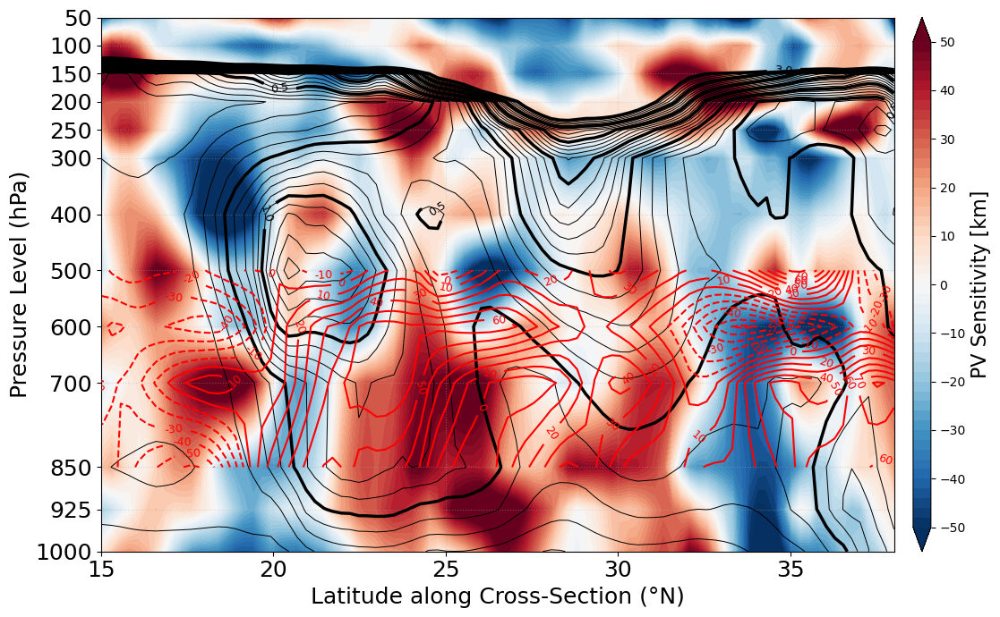

In [41]:
# fig, ax = plt.subplots(figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
# ax.set_extent([120,155,15,40], crs=proj)
# ax.coastlines(resolution='10m', color='black', linewidth=1)


# ax.contourf(lon_grid, lat_grid, cov_var_dict[24]['pv'][300], cmap = 'bwr')
# plt.show()

import metpy.calc as mpcalc
from metpy.units import units
import metpy.interpolate

def prepare_esa_cross_ds(analysis_hour):
    """mean_map과 cov_map 데이터를 MetPy 단면 추출용 Dataset으로 변환"""
    pv_cov = np.array([cov_var_dict[analysis_hour]['pv'][i] for i in pres_array])  # (level, lat, lon)
    rv_cov = np.array([cov_var_dict[analysis_hour]['vort'][i] for i in pres_array])  # (level, lat, lon)
    pv_mean = np.array([mean_map[analysis_hour]['pv'][i] for i in pres_array])  # (level, lat, lon)
    print(pv_cov.shape)

    
    # NaN으로 가득 찬 빈 배열 생성 (shape: [len(pressure), len(lat), len(lon)])
    grid_shape = pv_cov.shape
    u_blank = np.full(grid_shape, np.nan)
    v_blank = np.full(grid_shape, np.nan)

    # steer_pres에 해당하는 인덱스에만 데이터 채우기
    for i, p in enumerate(pres_array):
        if p in steer_pres:
            # cov_map 데이터가 dict 형태이거나 array 형태일 때 해당 레벨 값을 삽입
            if p in cov_var_dict[analysis_hour]['u_tc_rm']:
                u_blank[i, :, :] = cov_var_dict[analysis_hour]['u_tc_rm'][p]
                v_blank[i, :, :] = cov_var_dict[analysis_hour]['v_tc_rm'][p]
    # 1. 데이터 수집 (mean_map: Contour용, cov_map: Contourf용)
    ds_esa = xr.Dataset(
        {
            "pv_cov":  (['pressure', 'latitude', 'longitude'], pv_cov),
            "rv_cov":  (['pressure', 'latitude', 'longitude'], rv_cov),
            "pv_mean": (['pressure', 'latitude', 'longitude'], pv_mean),
            "u_tc_rm": (['pressure', 'latitude', 'longitude'], u_blank),
            "v_tc_rm": (['pressure', 'latitude', 'longitude'], v_blank)
        },
        coords={
            "pressure": np.array(pres_array, dtype = int),
            "latitude": lat_grid[:,0],
            "longitude": lon_grid[0,:]}
    )
    
    # 2. MetPy 좌표계 설정
    ds_esa = ds_esa.metpy.assign_crs(grid_mapping_name='latitude_longitude')
    ds_esa = ds_esa.metpy.parse_cf()
    return ds_esa


end_point = (40.0, 142.0) 
start_point = (15.0, 155.0) 
width_deg = 4.0
num_lines = 13

# 분석 시간별 루프
for analysis_hour in [12]:
    print(f"\n[{analysis_hour}h] ESA 단면 추출 및 시각화 중...")
    
    # 1. Dataset 준비
    # coords는 이전 단계에서 정의한 {'pressure', 'latitude', 'longitude'} 사용
    ds_esa = prepare_esa_cross_ds(analysis_hour)
    
    # 2. 6도 영역 평균 단면 추출 (offsets 활용)
    offsets = np.linspace(-width_deg/2, width_deg/2, num_lines)
    
    cross_list = []
    t_wind_list = []
    n_wind_list = []
    for off in offsets:
        start_pt_off = (start_point[0]+off, start_point[1])
        end_pt_off = (end_point[0]+off, end_point[1])
        # 단면 추출
        cross = metpy.interpolate.cross_section(ds_esa, start=start_pt_off, end=end_pt_off, steps=100)
        t_wind, n_wind = mpcalc.cross_section_components(cross['u_tc_rm'], cross['v_tc_rm'])  # 단면에서 성분 분리 위해 좌표 설정
        cross_list.append(cross)
        t_wind_list.append(t_wind)
        n_wind_list.append(-n_wind)
    
    # 6도 영역에 대한 평균 계산 (Xarray의 내장 mean 활용)
    # concat으로 묶은 후 첫 번째 차원(오프셋 차원)에 대해 평균
    # ds_cross_mean = xr.concat(cross_list, dim='offset', coords='all').mean(dim='offset')
    
    # # 3. 플로팅 데이터 준비
    # # x축: 단면상의 위도, y축: 기압 레벨
    # # X, Y = np.meshgrid(ds_cross_mean['latitude'], ds_cross_mean['pressure'])
    # lat_axis = ds_cross_mean['latitude'].values 
    # pres_axis = ds_cross_mean['pressure'].values
    # X, Y = np.meshgrid(lat_axis, pres_axis)
    
    # # --- 시각화 시작 ---
    # plt.figure(figsize=(12, 7))
    
    # # (A) Contourf: PV 공분산 (Sensitivity)
    # # d_anom(PCA 거리)와의 공분산이므로, 양(+)의 값은 거리가 멀어질수록 PV가 커짐을 의미
    # cf = plt.contourf(X, Y, ds_cross_mean['pv_cov'], levels=clevs_cov, cmap='RdBu_r', extend='both')
    # # cf = plt.contourf(X, Y, ds_cross_mean['rv_cov'], levels=clevs_cov, cmap='RdBu_r', extend='both')
    # cb = plt.colorbar(cf, orientation='vertical', pad=0.02, aspect=30)
    # cb.set_ticks(np.arange(-np.max(clevs_cov), np.max(clevs_cov)+1, 10), fontsize = 12)
    # cb.set_label('PV Sensitivity [km]', fontsize=12)

    # 2. 6도 영역 평균 단면 추출
    # 2. 6도 영역 평균 단면 추출
    ds_cross_mean = xr.concat(cross_list, dim='offset', coords='all').mean(dim='offset')
    t_wind_mean = xr.concat(t_wind_list, dim='offset').mean(dim='offset') 
    n_wind_mean = xr.concat(n_wind_list, dim='offset').mean(dim='offset') 
    
    # 3. 플로팅 데이터 준비 (유실된 좌표를 cross_list의 첫 번째 요소에서 복구)
    # ds_cross_mean에 longitude가 없으므로, 원본 cross 데이터에서 직접 가져옵니다.
    X, Y = np.meshgrid(cross_list[0]['latitude'], ds_cross_mean['pressure'])
    
    # --- 시각화 부분 ---
    plt.figure(figsize=(12, 7))
    
    # (A) Contourf 그리기
    clevs_cov = np.arange(-50, 51, 2)
    cf = plt.contourf(X, Y, ds_cross_mean['pv_cov'], levels=clevs_cov, cmap='RdBu_r', extend='both')
    
    # 컬러바 추가 (이전 답변에서 드린 10단위 설정 적용)
    cb = plt.colorbar(cf, orientation='vertical', pad=0.02, aspect=30)
    cb.set_ticks(np.arange(-50, 51, 10))
    cb.set_label('PV Sensitivity [km]', fontsize=16)

    
    # (B) Contour: 앙상블 평균 PV (검정색)
    pv_levels = np.arange(0.1, 3.1, 0.1)
    pv_bold_levels = np.arange(0.5, 3.1, 0.5)
    cpv = plt.contour(X, Y, ds_cross_mean['pv_mean']*1e06, levels=pv_levels, colors='black', linewidths=0.7)
    cpv_bold = plt.contour(X, Y, ds_cross_mean['pv_mean']*1e06, levels=pv_bold_levels, colors='black', linewidths=2.5)
    # plt.clabel(cpv, inline=True, fontsize=9, fmt='%1.1f')
    plt.clabel(cpv_bold, inline=True, fontsize=9, fmt='%1.1f')
        # con_n_wind = plt.contour(X, Y, n_wind_mean.values, levels=np.arange(-50, 51, 10), colors='blue', linewidths=1.5)
    # con_n_wind = plt.contour(X, Y, n_wind_mean.values, levels=np.arange(-100, 101, 10), colors='blue', linewidths=1.5)
    # plt.clabel(con_n_wind, inline=True, fontsize=9, fmt='%1.0f')
    con_t_wind = plt.contour(X, Y, t_wind_mean.values, levels=np.arange(-100, 101, 10), colors='red', linewidths=1.5)
    plt.clabel(con_t_wind, inline=True, fontsize=9, fmt='%1.0f')

    # cpv = plt.contour(X, Y, ds_cross_mean['pv_ne'], levels=pv_levels, colors='red', linewidths=0.7)
    # cpv_bold = plt.contour(X, Y, ds_cross_mean['pv_ne'], levels=pv_bold_levels, colors='red', linewidths=2.5)
    # plt.clabel(cpv, inline=True, fontsize=9, fmt='%1.1f')
    # plt.clabel(cpv_bold, inline=True, fontsize=9, fmt='%1.1f')
    # pv_levels = np.arange(-10.1, 10.1, 1)
    # cpv = plt.contour(X, Y, ds_cross_mean['rv_mean'], levels=pv_levels, colors='black', linewidths=1.2)
    
    # # (C) Contour: 앙상블 평균 온위 (회색)
    # theta_levels = np.arange(280, 450, 10)
    # cth = plt.contour(X, Y, ds_cross_mean['theta_mean'], levels=theta_levels, colors='gray', 
    #                   linewidths=0.8, alpha=0.6, linestyles='--')
    # plt.clabel(cth, inline=True, fontsize=8, fmt='%1.0f')
    
    # # (D) 특수 라인: 대류권계면 (1.5 PVU)
    # plt.contour(X, Y, ds_cross_mean['pv_mean'], levels=[1.5], colors='lime', linewidths=2, linestyles='--')

    # 축 설정
    plt.gca().invert_yaxis()
    # plt.yscale('log') # 기압 좌표이므로 로그 스케일 추천
    plt.yticks(pres_array, [str(int(p)) for p in pres_array]) # 실제 기압 레벨 표시
    plt.tick_params(axis='both', which='major', labelsize=18)
    
    plt.xlim(15, 38) # 위도 범위 제한
    plt.xlabel('Latitude along Cross-Section (°N)', fontsize=18)
    plt.ylabel('Pressure Level (hPa)', fontsize=18)
    # plt.title(f' T+{analysis_hour}h', fontsize=20)
    plt.grid(True, linestyle=':', alpha=0.4)
    
    plt.tight_layout()
    plt.show()


### <span style="background:White; color:black; font-weight:bold">Maximum Convection Box🌧️ Vertical Profile</span>

슬라이딩 4x4 평균 최댓값 위치: (lat, lon) = (42.25, 142.0)
슬라이딩 4x4 평균 최솟값 위치: (lat, lon) = (22.75, 150.0)
최댓값: 36.8374
최댓값: -53.6019


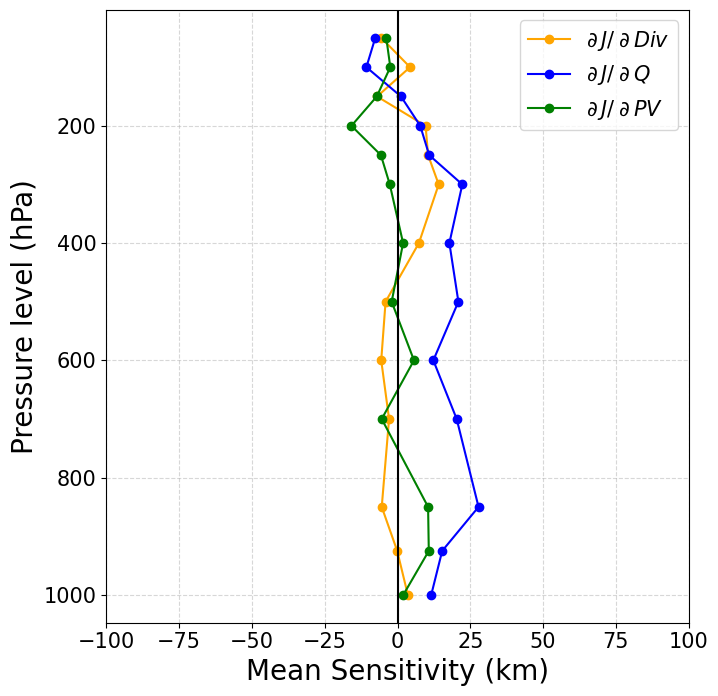

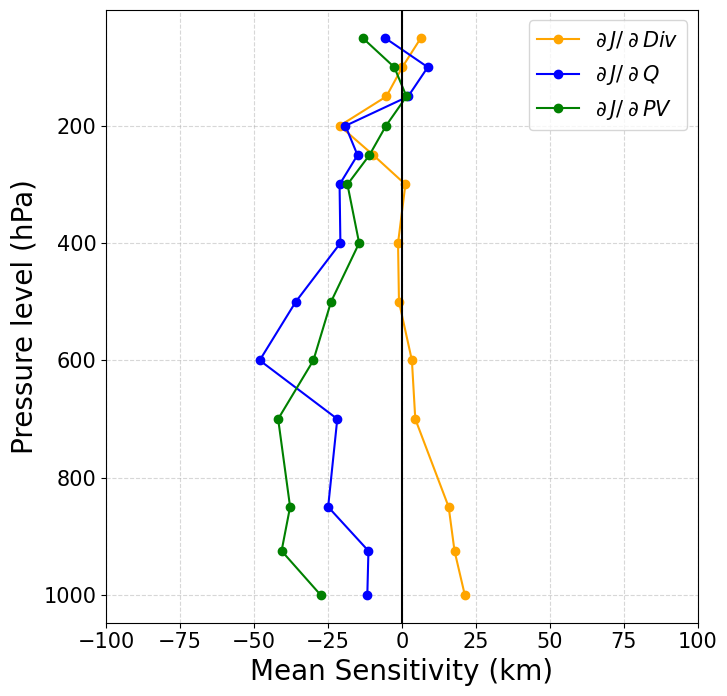

In [27]:
# cov_var: (161, 241) 예시
predict_interval = 12

tpw_cv = cov_var_dict[predict_interval]['tpw']
# tpw_cv = cov_var_dict[predict_interval]['pv'][500]
window = 13
mean_map = uniform_filter(tpw_cv, size=window, mode='constant')  # 가장자리는 0-padding

# 최대값 위치
max_idx = np.unravel_index(np.argmax(mean_map), mean_map.shape)
min_idx = np.unravel_index(np.argmin(mean_map), mean_map.shape)

lat0, lon0 = lat_grid[max_idx[0], max_idx[1]], lon_grid[max_idx[0], max_idx[1]]   
# lat0, lon0 = 28, 150
lat1, lon1 = lat_grid[min_idx[0], min_idx[1]], lon_grid[min_idx[0], min_idx[1]]
distance0 = np.sqrt((lon_grid - lon0)**2 + (lat_grid - lat0)**2)
distance1 = np.sqrt((lon_grid - lon1)**2 + (lat_grid - lat1)**2)
max_idx = np.unravel_index(np.argmin(distance0), distance0.shape)
min_idx = np.unravel_index(np.argmin(distance1), distance1.shape)


print(f"슬라이딩 4x4 평균 최댓값 위치: (lat, lon) = ({lat0}, {lon0})")
print(f"슬라이딩 4x4 평균 최솟값 위치: (lat, lon) = ({lat1}, {lon1})")
print(f"최댓값: {mean_map[max_idx]:.4f}")
print(f"최댓값: {mean_map[min_idx]:.4f}")

for idx, point_name in zip([max_idx, min_idx], ['max', 'min']):
    div_cv_list = []
    q_cv_list = []
    pv_cv_list = []
    for pres in pres_array:
        div_cv = cov_var_dict[predict_interval]['div'][pres]
        q_cv = cov_var_dict[predict_interval]['q'][pres]
        pv_cv = cov_var_dict[predict_interval]['pv'][pres]

        div_cv_mean = np.mean(div_cv[idx[0] - window//2:idx[0] + window//2 + 1, idx[1] - window//2:idx[1] + window//2 + 1])
        q_cv_mean = np.mean(q_cv[idx[0] - window//2:idx[0] + window//2 + 1, idx[1] - window//2:idx[1] + window//2 + 1])
        pv_cv_mean = np.mean(pv_cv[idx[0] - window//2:idx[0] + window//2 + 1, idx[1] - window//2:idx[1] + window//2 + 1])
        div_cv_list.append(div_cv_mean)
        q_cv_list.append(q_cv_mean)
        pv_cv_list.append(pv_cv_mean)

    plt.figure(figsize=(7, 7))

    plt.plot(div_cv_list, pres_array, label='$\partial \, J/\;\partial \,Div$', color='orange', marker='o')
    plt.plot(q_cv_list, pres_array, label='$\partial \, J/\;\partial \, Q$', color='blue', marker='o')
    plt.plot(pv_cv_list, pres_array, label='$\partial \, J/\;\partial \,PV$', color='green', marker='o')

    # plt.plot(div_cv_list, level_list, label=r'$\frac{\partial \,J}{\partial \,Div}$', color='orange', marker='o')
    # plt.plot(q_cv_list, level_list, label=r'$\frac{\partial \,J}{\partial \,Q}$', color='blue', marker='o')

    FontProperties = fm.FontProperties(size=15, weight='black')
    plt.gca().invert_yaxis()  # y축이 위가 낮고, 아래가 높도록 (pressure profile convention)
    plt.axvline(0, color='black', linestyle='-')
    plt.xlabel('Mean Sensitivity (km)', fontsize = 20)
    plt.ylabel('Pressure level (hPa)', fontsize = 20)
    plt.legend(loc='upper right', prop=FontProperties)

    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.xlim(-100,100)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    # plt.gca().invert_yaxis()
    plt.show()

Plotting sensitive wind at steerhPa for 12h forecast with 32 ENS...
max: 169.88270568847656


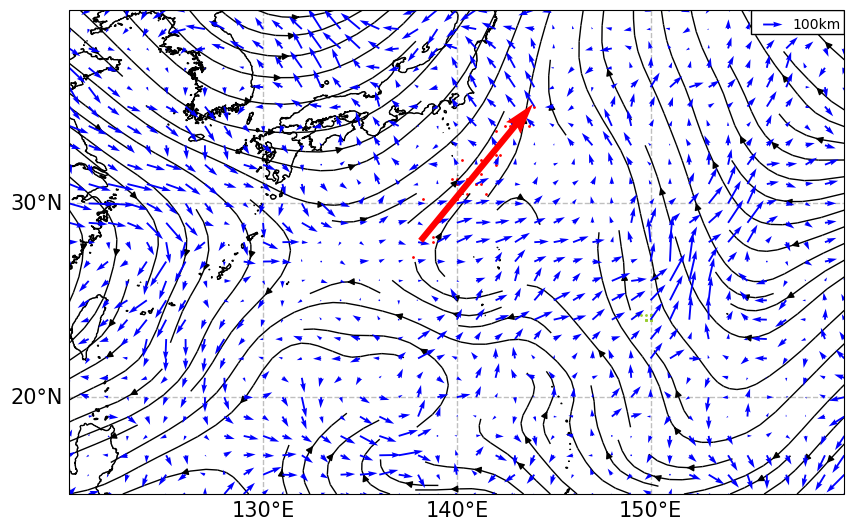

Plotting sensitive wind at 850hPa for 12h forecast with 32 ENS...
max: 171.2957000732422


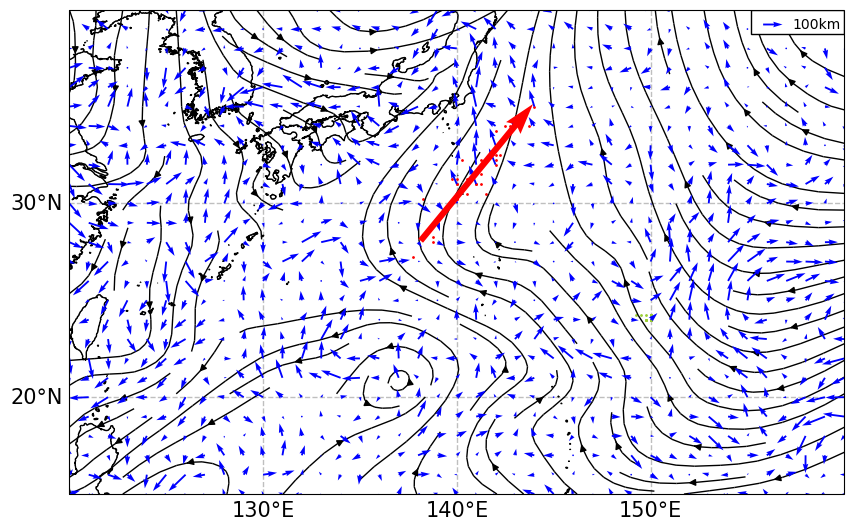

Plotting sensitive wind at 500hPa for 12h forecast with 32 ENS...
max: 162.8335723876953


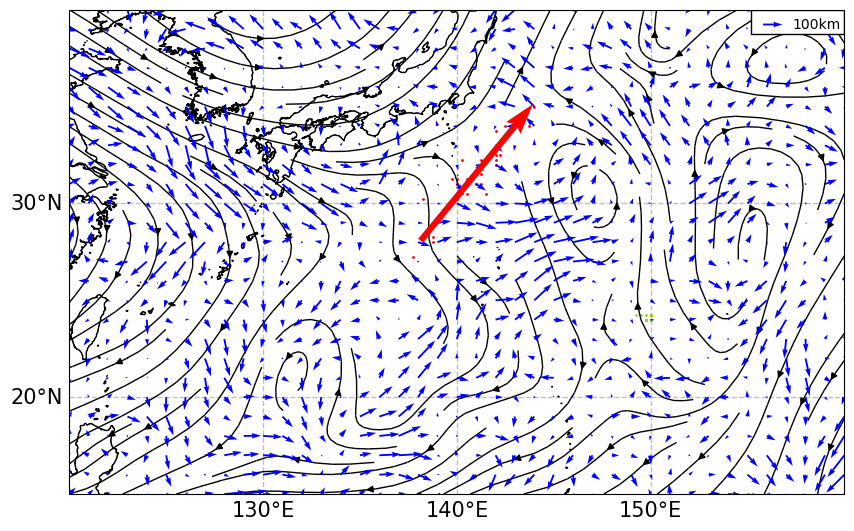

In [42]:
from matplotlib.colors import BoundaryNorm

step = 4
quiver_scale = 100
# quiver_scale = 25
sensitivity_scale = 250
sig_thres = 99
if storm_name == 'DEBBY':
    extent = [250, 290, 15, 40]
else:
    extent = [120, 160, 15, 40]
window = 13

levels = np.linspace(-sensitivity_scale, sensitivity_scale, 51)
norm = BoundaryNorm(levels, ncolors=plt.get_cmap('seismic').N, clip=False)

# for predict_interval in cov_var_dict:
# for predict_interval in [12,18,24]:
for predict_interval in [12]:
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    wind_speed = np.sqrt(mean_flow_500hPa[predict_interval]['u']**2+mean_flow_500hPa[predict_interval]['v']**2)
    masked_u = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['u'])
    masked_v = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['v'])
    masked_u_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['u'])
    masked_v_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['v'])
    
    
    ens_idx_list = []
    for ens in ens_list:
        if (start_time in ssv_dict[key_time][ens]) and (target_time in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)

        if ENS_ERA5:
            if len(ens_idx_list) >= ENS_ERA5:
                break

        # 데이터를 추출합니다
        mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list])
        tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])

    

    # for upper_variable in cov_var_dict[predict_interval]:
    #     if upper_variable in ['tpw']:
    #         print(f"Plotting {upper_variable} for {predict_interval}h forecast...")
    #         cov_var = cov_var_dict[predict_interval][upper_variable].reshape(161,241)
    #         sig_mask = sig_mask_dict[predict_interval][upper_variable][sig_thres].reshape(161,241)
    #         print(f"max: {np.max(cov_var)}, min: {np.min(cov_var)}")
    #         # Plotting the covariance/variance
    #         fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
    #         ax.set_extent(extent, crs=proj)
    #         ax.coastlines('10m', linewidth=0.5)
    #         if storm_name == 'DEBBY':
    #             lon_wrapped = (lon_grid + 180) % 360 - 180
    #             ax.streamplot(lon_wrapped[0, :], lat_grid[:, 0], masked_u, masked_v,
    #                         color='black', linewidth=1, density=1)
    #         else:
    #             ax.streamplot(lon_grid, lat_grid, masked_u, masked_v, color='black', linewidth=1, density=1)
    #         sax = ax.contourf(
    #             lon_grid, lat_grid, cov_var, cmap='seismic',
    #             norm=norm,                # ✅ BoundaryNorm 강제 지정
    #             transform=proj,
    #             levels=levels,
    #             extend='both', zorder=-1
    #         )
    #         ax.contourf(
    #                     lon_grid,
    #                     lat_grid,
    #                     sig_mask.astype(int),   # True/False → 1/0
    #                     levels=[0.5, 1.5],       # True 영역만 선택
    #                     hatches=['xx'],         # 빗금 스타일
    #                     colors='none',           # 색 채우기 제거
    #                     transform=proj
    #                 )
    #         sax_cb = plt.colorbar(sax, ax=ax, orientation='horizontal', label='Sensitivity (km)', shrink=0.8, pad=0.05)
    #         sax_cb.set_label('Sensitivity (km)', fontsize=15)  # colorbar 자체의 label
    #         sax_cb.ax.tick_params(labelsize=15)
    #         sax_cb.ax.set_xticks(np.linspace(-sensitivity_scale, sensitivity_scale, 5))
    #         # ax.quiver(pca_tar.mean_[0]+pca_tar.components_[0, 0]*6, pca_tar.mean_[1]+pca_tar.components_[0, 1]*6, -pca_tar.components_[0, 0], -pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    #         ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    #         # ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], -pca_tar.components_[0, 0], -pca_tar.components_[0, 1] , scale=20, color='r', width=0.005, label='Principal Axis', zorder = 2)
    #         plt.scatter(mid_pos[:, 0], mid_pos[:, 1], c='yellowgreen', s=1, transform=proj)
    #         map_background(ax, proj=proj)

           
    #         mean_map = uniform_filter(cov_var, size=window, mode='constant')  # 가장자리는 0-padding

    #         # # 최대값 위치
    #         # max_idx = np.unravel_index(np.argmax(mean_map), mean_map.shape)
    #         # lat0, lon0 = lat_grid[max_idx[0], max_idx[1]], lon_grid[max_idx[0], max_idx[1]]  
    #         # # lat0, lon0 = 28, 150 
    #         # print(f"Maximum value at: {lat0}, {lon0} with value: {mean_map[max_idx]}")

    #         # min_idx = np.unravel_index(np.argmin(mean_map), mean_map.shape)
    #         # lat1, lon1 = lat_grid[min_idx[0], min_idx[1]], lon_grid[min_idx[0], min_idx[1]]  
    #         # print(f"Minimum value at: {lat1}, {lon1} with value: {mean_map[min_idx]}")
            

    #         # # Rectangle: (x, y), width, height
    #         # rect = patches.Rectangle(
    #         #     (lon0-(window-1)/8, lat0 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
    #         #     window//4,  # 경도 간격 × width
    #         #     window//4, # 위도 간격 × height
    #         #     linewidth=2, edgecolor='black', facecolor='none', zorder=3, transform=proj
    #         # )
    #         # ax.add_patch(rect)

    #         # rect = patches.Rectangle(
    #         #     (lon1-(window-1)/8, lat1 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
    #         #     window//4,  # 경도 간격 × width
    #         #     window//4, # 위도 간격 × height
    #         #     linewidth=2, edgecolor='cyan', facecolor='none', zorder=3, transform=proj
    #         # )
    #         # ax.add_patch(rect)

    #         plt.show()

    #     else:
    #         # for pres in cov_var_dict[predict_interval][upper_variable]:
    #         # for pres in pres_array:
    #         for pres in [500,400,300,250]:
    #             if upper_variable == 'z':
    #                 cov_var = cov_var_dict[predict_interval][upper_variable][pres].reshape(161,241)
    #                 sig_mask = sig_mask_dict[predict_interval][upper_variable][pres][sig_thres].reshape(161,241)
    #                 print(f"Plotting {upper_variable} at {pres}hPa for {predict_interval}h forecast...")
                    
    #                 # Plotting the covariance/variance
    #                 fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
    #                 ax.set_extent(extent, crs=proj)
    #                 ax.coastlines('10m', linewidth=0.5)
    #                 if storm_name == 'DEBBY':
    #                     lon_wrapped = (lon_grid + 180) % 360 - 180
    #                     ax.streamplot(lon_wrapped[0, :], lat_grid[:, 0], masked_u, masked_v,
    #                                 color='black', linewidth=1, density=1)
    #                 else:
    #                     ax.streamplot(lon_grid, lat_grid, masked_u if pres != 850 else masked_u_850, masked_v if pres != 850 else masked_v_850, color='black', linewidth=1, density=1)
    #                 cov_var = uniform_filter(cov_var, size=window, mode='constant')  # 가장자리는 0-padding
    #                 sax = ax.contourf(lon_grid, lat_grid, cov_var, cmap='seismic', norm=norm,                # ✅ BoundaryNorm 강제 지정
    #                                 transform=proj,
    #                                 levels=levels, extend='both', zorder = -1)
    #                 ax.contourf(
    #                     lon_grid,
    #                     lat_grid,
    #                     sig_mask.astype(int),   # True/False → 1/0
    #                     levels=[0.5, 1.5],       # True 영역만 선택
    #                     hatches=['xx'],         # 빗금 스타일
    #                     colors='none',           # 색 채우기 제거
    #                     transform=proj
    #                 )
    #                 sax_cb = plt.colorbar(sax, ax=ax, orientation='horizontal', shrink=0.8, pad=0.05)
    #                 sax_cb.set_label('Sensitivity (km)', fontsize=15)  # colorbar 자체의 label
    #                 sax_cb.ax.tick_params(labelsize=15)
    #                 sax_cb.ax.set_xticks(np.linspace(-sensitivity_scale, sensitivity_scale, 5))
    #                 ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    #                 plt.scatter(mid_pos[:, 0], mid_pos[:, 1], c='yellowgreen', s=3, transform=proj)
    #                 map_background(ax, proj=proj)

    #                 # rect = patches.Rectangle(
    #                 #     (lon0-(window-1)/8, lat0 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
    #                 #     window//4,  # 경도 간격 × width
    #                 #     window//4, # 위도 간격 × height
    #                 #     linewidth=2, edgecolor='black', facecolor='none', zorder=3, transform=proj
    #                 # )
    #                 # ax.add_patch(rect)
    #                 # rect = patches.Rectangle(
    #                 #     (lon1-(window-1)/8, lat1 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
    #                 #     window//4,  # 경도 간격 × width
    #                 #     window//4, # 위도 간격 × height
    #                 #     linewidth=2, edgecolor='cyan', facecolor='none', zorder=3, transform=proj
    #                 # )
    #                 # ax.add_patch(rect)
    #                 # print(lon0, lat0, lon1, lat1)
    #                 plt.show()

    
    # for pres in level_list:
    # for pres in [850, 500, 250, 'steer']:
    for pres in ['steer', 850, 500]:
        # if pres == 850:
        #     wind_speed = np.sqrt(mean_flow_850hPa[predict_interval]['u']**2+mean_flow_850hPa[predict_interval]['v']**2)
        #     masked_u = np.where(wind_speed < 1, np.nan, mean_flow_850hPa[predict_interval]['u'])
        #     masked_v = np.where(wind_speed < 1, np.nan, mean_flow_850hPa[predict_interval]['v'])
        # elif  pres == 'steer':

        # else:
        #     wind_speed = np.sqrt(mean_flow_500hPa[predict_interval]['u']**2+mean_flow_500hPa[predict_interval]['v']**2)
        #     masked_u = np.where(wind_speed < 1, np.nan, mean_flow_500hPa[predict_interval]['u'])
        #     masked_v = np.where(wind_speed < 1, np.nan, mean_flow_500hPa[predict_interval]['v'])
        
        if pres != 'steer':
            u_cv = cov_var_dict[predict_interval]['u_tc_rm'][pres]
            v_cv = cov_var_dict[predict_interval]['v_tc_rm'][pres]
            wind_speed = np.sqrt(mean_tc_rm[predict_interval]['u_tc_rm'][pres]**2+mean_tc_rm[predict_interval]['v_tc_rm'][pres]**2)
            masked_u = np.where(wind_speed < 1, np.nan, mean_tc_rm[predict_interval]['u_tc_rm'][pres])
            masked_v = np.where(wind_speed < 1, np.nan, mean_tc_rm[predict_interval]['v_tc_rm'][pres])
        else:
            # u_cv = cov_var_dict[predict_interval]['u_steer']
            # v_cv = cov_var_dict[predict_interval]['v_steer']
            u_cv = cov_var_dict[predict_interval]['u_tc_rm_steer']
            v_cv = cov_var_dict[predict_interval]['v_tc_rm_steer']
            wind_speed = np.sqrt(mean_steer_tc_rm[predict_interval]['u']**2+mean_steer_tc_rm[predict_interval]['v']**2)
            masked_u = np.where(wind_speed < 1, np.nan, mean_steer_tc_rm[predict_interval]['u'])
            masked_v = np.where(wind_speed < 1, np.nan, mean_steer_tc_rm[predict_interval]['v'])

        
        print(f"Plotting sensitive wind at {pres}hPa for {predict_interval}h forecast with {len(mid_pos)} ENS...")
        print(f"max: {np.max(np.sqrt(u_cv**2+v_cv**2))}")

        # Plotting the covariance/variance
        fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
        ax.set_extent(extent, crs=proj)
        ax.coastlines('10m', linewidth=0.5)
        # if storm_name == 'DEBBY':
        #     lon_wrapped = (lon_grid + 180) % 360 - 180
        #     ax.streamplot(lon_wrapped[0, :], lat_grid[:, 0], mean_steer_tc_rm[predict_interval]['u'], mean_steer_tc_rm[predict_interval]['v'],
        #                 color='black', linewidth=1, density=1)
        #     # ax.streamplot(lon_wrapped[0, :], lat_grid[:, 0], masked_u, masked_v,
        #     #             color='black', linewidth=1, density=1)
        # else:
        ax.streamplot(lon_grid, lat_grid, masked_u, masked_v, color='black', linewidth=1, density=1)

        # if predict_interval == 24:
        #     start_point = np.array([[150, 30.5]])  # 타겟 위치
        # elif predict_interval == 12:
        #     start_point = np.array([[150, 27.43]])  # 타겟 위치
        # elif predict_interval == 6:
        #     start_point = np.array([[150, 30.5]])
        # else:
        #     start_point = np.array([[150, 30.5]])

        # ax.streamplot(lon_grid, lat_grid, masked_u, masked_v,
        #       start_points=start_point, # 다른 시작점
        #       color='orange', linewidth=5, zorder=20,arrowsize=3,density=10,
        #       transform=ccrs.PlateCarree())
        uv_quiver = ax.quiver(lon_grid[::step, ::step], lat_grid[::step, ::step], u_cv[::step, ::step], v_cv[::step, ::step], color = 'blue', transform=proj, scale = quiver_scale*40, zorder = 2)
        uv_quiver_key = ax.quiverkey(uv_quiver, 0.92, 0.97, quiver_scale, f'{quiver_scale}km', labelpos='E', coordinates='axes', color = 'blue', zorder = 10)
        # ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
        # ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], -pca_tar.components_[0, 0], -pca_tar.components_[0, 1] , scale=20, color='r', width=0.005, label='Principal Axis', zorder = 2)
        explained_var = pca_tar.explained_variance_[0]
        spread_scale  = 1 * np.sqrt(explained_var)*4

        # --- PCA 성분 추출 및 보정 ---
        v1 = pca_tar.components_[0]  # [dx_corrected, dy]

        # 위경도 평면에서 보여질 실제 방향 벡터 (경도 보정 역산)
        # dx = dx_corrected / cos_lat
        cos_lat = np.cos(np.radians(tar_pos[:, 1].mean()))  # 타겟 위치의 평균 위도에서 cos 계산
        v_lon = v1[0] / cos_lat
        v_lat = v1[1]

        # 화살표의 길이를 결정하는 스케일 (사용자 정의 spread_scale 사용)
        # 여기서는 중심으로부터 양쪽으로 spread_scale만큼 뻗어나가게 설정
        origin_lon = np.mean(tar_pos[:, 0])
        origin_lat = np.mean(tar_pos[:, 1])

        # --- Quiver 그리기 ---
        # 중심에서 시작하지 않고, 벡터의 뒤쪽 절반 지점에서 시작하여 
        # 중심을 관통하도록 그려야 "축"처럼 보입니다.
        ax.quiver(
            origin_lon - v_lon * spread_scale / 2, 
            origin_lat - v_lat * spread_scale / 2, 
            v_lon * spread_scale, 
            v_lat * spread_scale,
            angles='xy', scale_units='xy', scale=1, # 단위계를 데이터 좌표계에 고정
            color='red', width=0.008, headwidth=3, 
            label='Principal Axis', zorder=30
        )

        plt.scatter(mid_pos[:, 0], mid_pos[:, 1], c='yellowgreen', s=1, transform=proj)
        plt.scatter(tar_pos[:, 0], tar_pos[:, 1], c='red', s=1, transform=proj)
        map_background(ax, proj=proj)
        rect = patches.Rectangle((0.88, 0.95), 0.12, 0.05, linewidth=1, edgecolor='black', facecolor='white', transform=ax.transAxes, zorder = 2)
        ax.add_patch(rect)

        
        # mean_map = uniform_filter(cov_var, size=window, mode='constant')  # 가장자리는 0-padding


        # Rectangle: (x, y), width, height
        # rect = patches.Rectangle(
        #     (lon0-(window-1)/8, lat0 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
        #     window//4,  # 경도 간격 × width
        #     window//4, # 위도 간격 × height
        #     linewidth=2, edgecolor='black', facecolor='none', zorder=3, transform=proj
        # )
        # ax.add_patch(rect)

        # rect = patches.Rectangle(
        #     (lon1-(window-1)/8, lat1 - (window-1)/8),         # 왼쪽 아래 꼭짓점 (경도, 위도)
        #     window//4,  # 경도 간격 × width
        #     window//4, # 위도 간격 × height
        #     linewidth=2, edgecolor='cyan', facecolor='none', zorder=3, transform=proj
        # )
        # ax.add_patch(rect)

        plt.show()


In [85]:
for ens in ens_list:
    # if (target_time in ssv_dict[key_time][ens]): #! u,v _tc_rm을 쓸거면 이거 선택 x
    if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
    # if (steer_target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

print(f'Processing {predict_interval} hours forecast... with {len(ens_idx_list)} ensemble members')

# 데이터를 추출합니다
tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])


#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

#distance 구하기
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
distances_tar = (projection - ensemble_mean) * 111

Processing 24 hours forecast... with 812 ensemble members


Analysis Hour: 12h


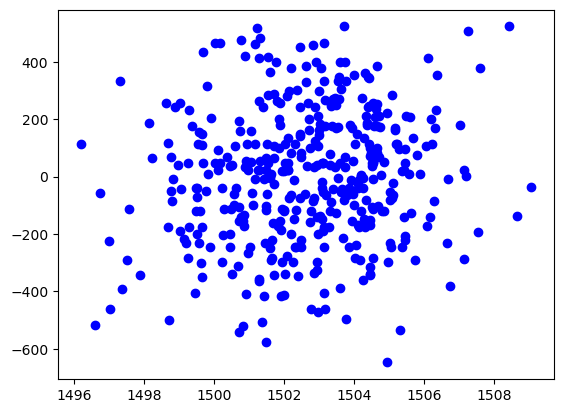

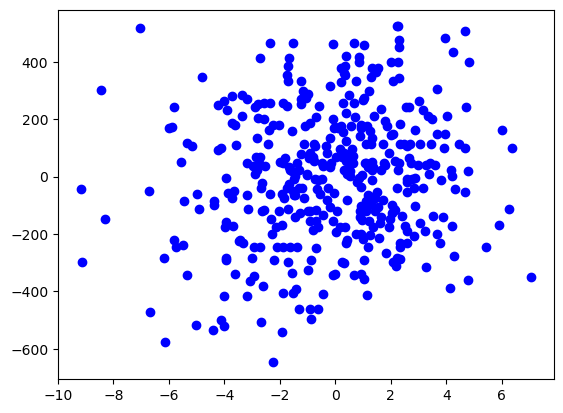

Analysis Hour: 24h


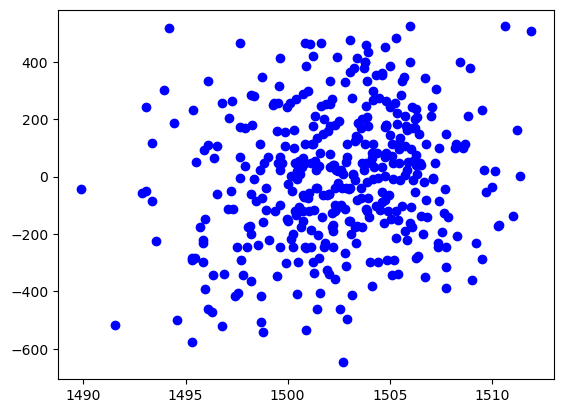

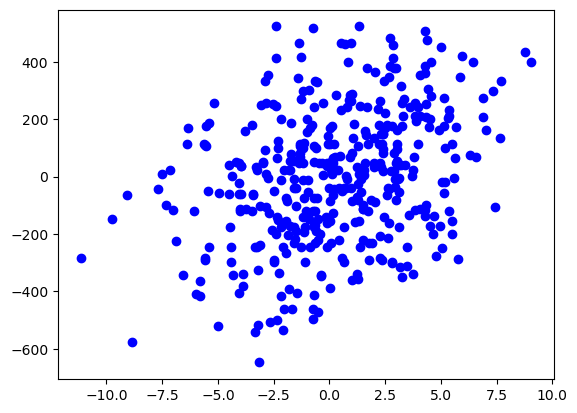

Analysis Hour: 36h


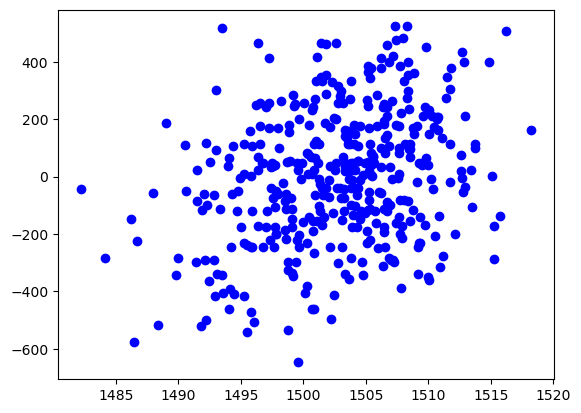

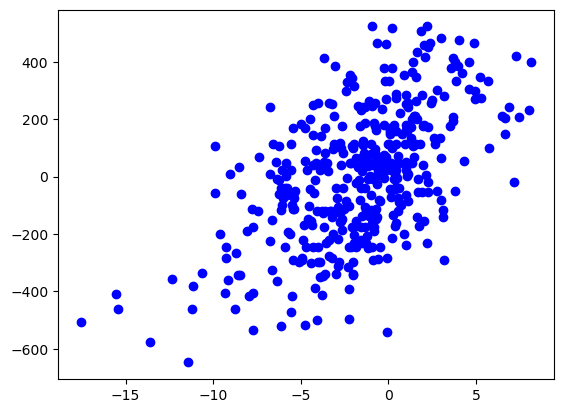

Analysis Hour: 48h


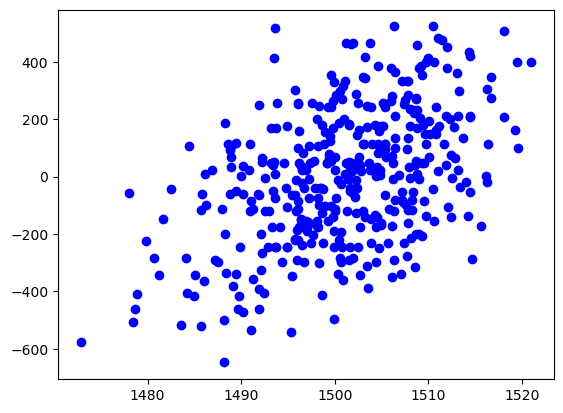

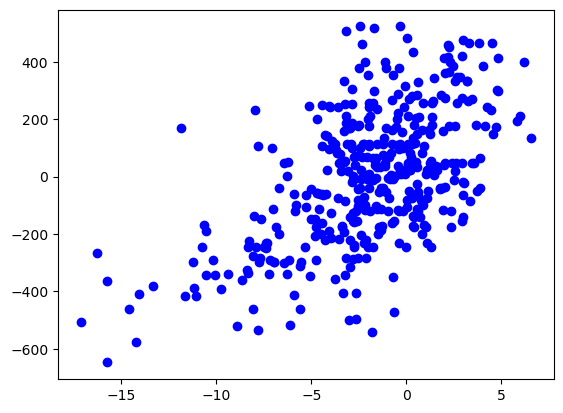

In [13]:

analysis_hour = 12
level = 850
group_num = 20
levels_bold = np.arange(1000, 15000, 100)
levels = np.setdiff1d(np.arange(1000, 15000, 10), levels_bold)

ens_idx_list = []
for ens in ens_list:
    # if (target_time in ssv_dict[key_time][ens]): #! u,v _tc_rm을 쓸거면 이거 선택 x
    if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
    # if (steer_target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])


#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

#distance 구하기
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
distances_tar = (projection - ensemble_mean) * 111
        
mems_sort = np.array(ens_idx_list)[np.argsort(distances_tar)]

for analysis_hour in [12,24, 36, 48]:
    # for level in [850, 500]:

    print(f"Analysis Hour: {analysis_hour}h")

    mid_lon_sort = [ssv_dict[key_time][ens][key_time+timedelta(hours=analysis_hour)]['lon'] for ens in mems_sort]
    mid_lat_sort = [ssv_dict[key_time][ens][key_time+timedelta(hours=analysis_hour)]['lat'] for ens in mems_sort]
    mid_z_850_sort = [ssv_dict[key_time][ens][key_time+timedelta(hours=analysis_hour)]['mslp'] for ens in mems_sort]
    mid_z_850_sort_next = [ssv_dict[key_time][ens][key_time+timedelta(hours=analysis_hour + 12)]['mslp'] for ens in mems_sort]

    plt.scatter(mid_z_850_sort, distances_tar[np.argsort(distances_tar)], color='blue')
    plt.show()
    plt.scatter(np.array(mid_z_850_sort_next) - np.array(mid_z_850_sort), distances_tar[np.argsort(distances_tar)], color='blue')
    plt.show()

In [75]:
var = 'z'

ds_era5 = xr.load_dataset(f"/data06/ERA5/hourly/{var}/ERA5_{var}_202208.nc")

Analysis Hour: 12h, Level: 850 hPa


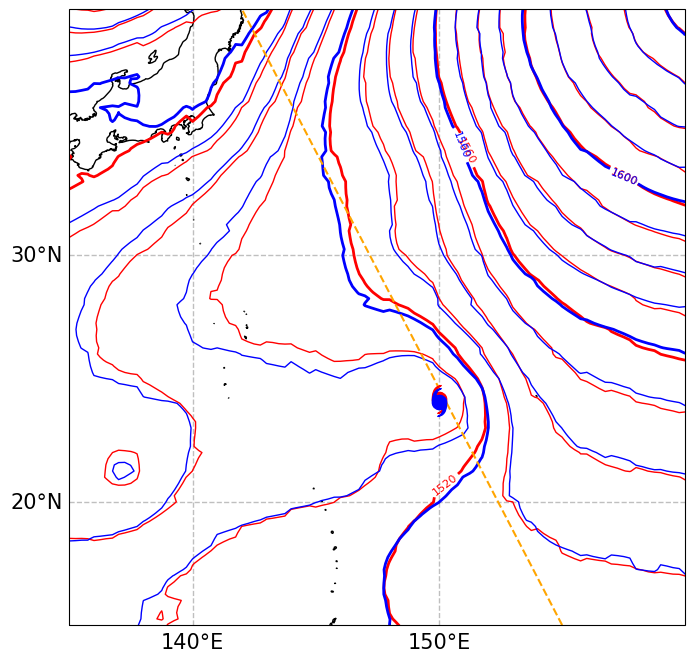

Analysis Hour: 12h, Level: 500 hPa


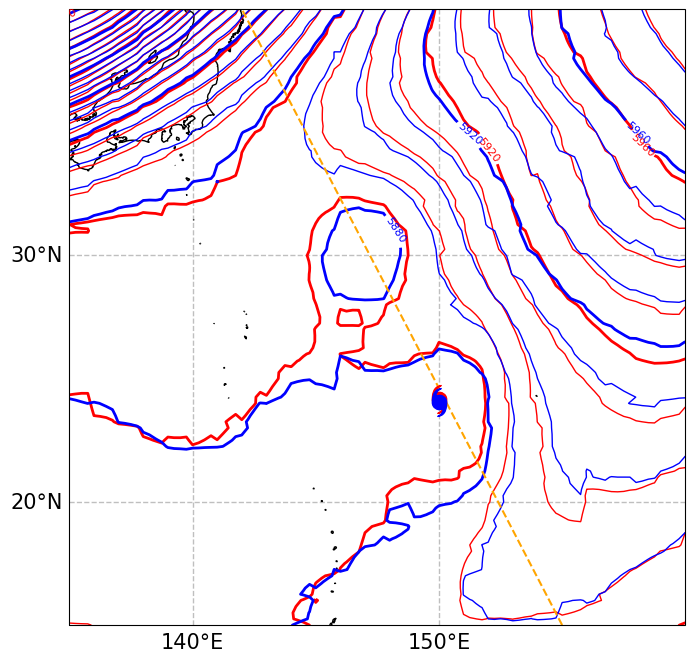

Analysis Hour: 12h, Level: 250 hPa


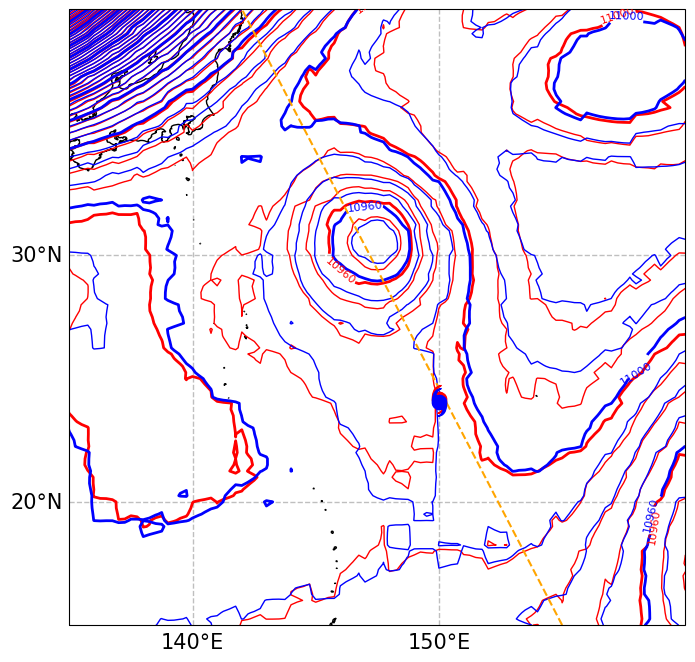

Analysis Hour: 24h, Level: 850 hPa


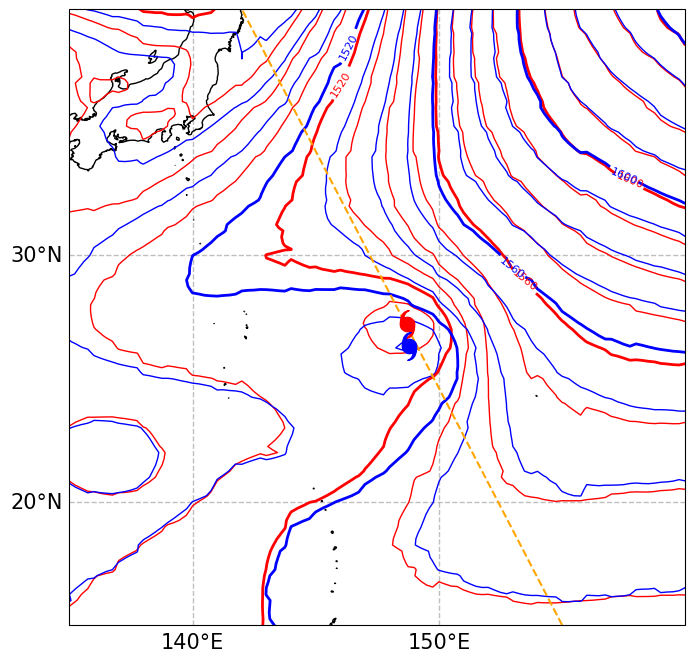

Analysis Hour: 24h, Level: 500 hPa


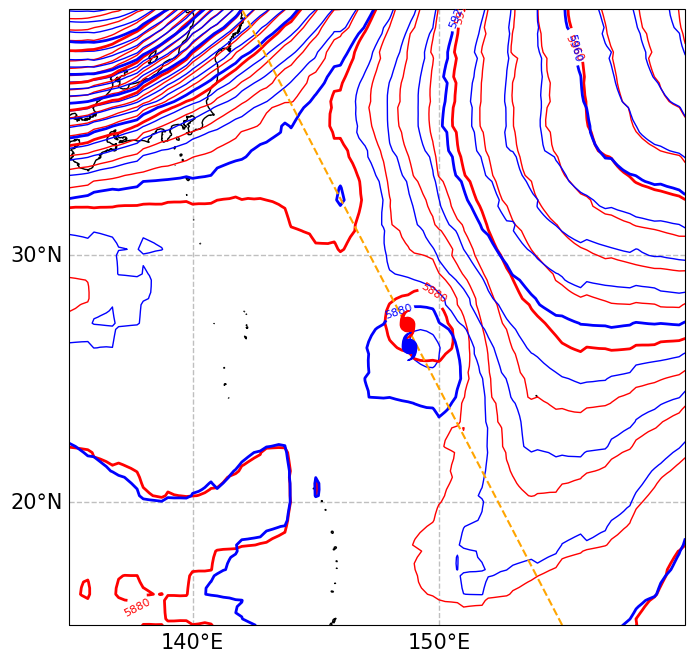

Analysis Hour: 24h, Level: 250 hPa


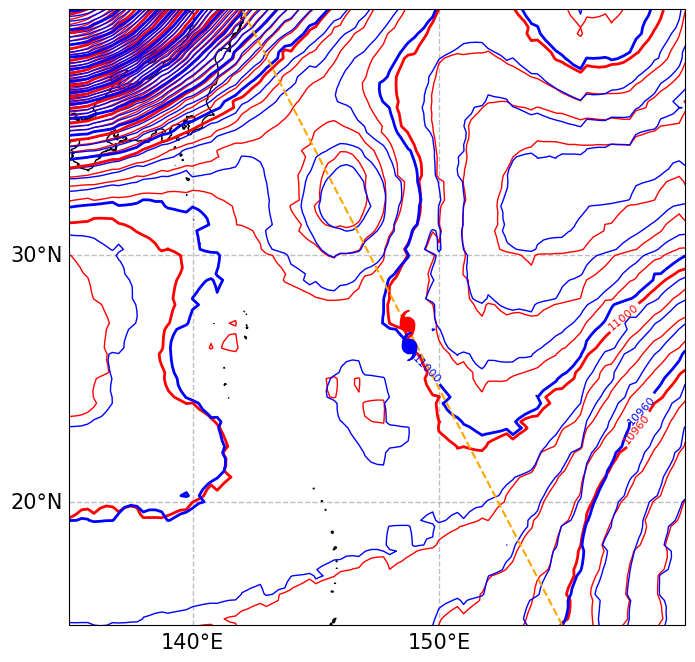

In [32]:
G = 9.80665
# analysis_hour = 12
group_num = 20
levels_bold = np.arange(0, 15000, 40)
levels = np.setdiff1d(np.arange(0, 15000, 10), levels_bold)
end_point = (40.0, 142.0) 
start_point = (15.0, 155.0) 
var = "z"

ens_idx_list = []
for ens in ens_list:
    # if (target_time in ssv_dict[key_time][ens]): #! u,v _tc_rm을 쓸거면 이거 선택 x
    if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
    # if (steer_target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])
end_point = (40.0, 142.0) 
start_point = (15.0, 155.0) 

#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

#distance 구하기
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
distances_tar = (projection - ensemble_mean) * 111
        
mems_sort = np.array(ens_idx_list)[np.argsort(distances_tar)]

for analysis_hour in [12, 24]:
    for level in [850, 500, 250]:

        analysis_time = key_time + timedelta(hours=analysis_hour)

        mid_lon_sort = [ssv_dict[key_time][ens][analysis_time]['lon'] for ens in mems_sort]
        mid_lat_sort = [ssv_dict[key_time][ens][analysis_time]['lat'] for ens in mems_sort]
        mid_z_850_sort = [ssv_dict[key_time][ens][analysis_time]['mslp'] for ens in mems_sort]

        # plt.scatter(mid_z_850_sort, distances_tar[np.argsort(distances_tar)], color='blue')

        print(f"Analysis Hour: {analysis_hour}h, Level: {level} hPa")

        z_sw_list = []
        for ens in mems_sort[:group_num]:
            met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", analysis_hour, surface_dict, upper_dict, 
                        lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
            z = met.met_data('z', level=level)
            z_sw_list.append(z)

        # print(f'{np.mean(d_anom_sort[:group_num])} km')

        z_ne_list = []
        for ens in mems_sort[-group_num:]:
            met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", analysis_hour, surface_dict, upper_dict, 
                        lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
            z = met.met_data('z', level=level)
            z_ne_list.append(z)

        # ds_era5_part = ds_era5[var].sel(pressure_level=level).sel(latitude=slice(45, 10), longitude=slice(110, 160), valid_time = analysis_time)/G
        # era_lon, era_lat = ds_era5_part['longitude'].values, ds_era5_part['latitude'].values
        # era_lon_grid, era_lat_grid = np.meshgrid(era_lon, era_lat)

        z_sw_mean = np.mean(z_sw_list, axis=0)
        z_ne_mean = np.mean(z_ne_list, axis=0)
        # z_total_std = np.std(z_total_list, axis=0)

        # plt.imshow(z_sw_mean - z_ne_mean, origin='lower', cmap='RdBu_r')

        fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
        ax.coastlines("10m")
        ax.set_extent([135, 160, 15, 40], crs=ccrs.PlateCarree())

        cax = ax.contour(lon_grid, lat_grid, z_ne_mean, levels=levels, colors='red', linewidths=1, transform=ccrs.PlateCarree())
        cax = ax.contour(lon_grid, lat_grid, z_sw_mean, levels=levels, colors='blue', linewidths=1, transform=ccrs.PlateCarree())
        # cax = ax.contour(era_lon_grid, era_lat_grid, ds_era5_part.values, levels=levels, colors='black', linewidths=0.5, transform=ccrs.PlateCarree())
        cax = ax.contour(lon_grid, lat_grid, z_ne_mean, levels=levels_bold, colors='red', linewidths=2, transform=ccrs.PlateCarree())
        plt.clabel(cax, inline=True, fontsize=8, fmt='%d')
        cax = ax.contour(lon_grid, lat_grid, z_sw_mean, levels=levels_bold, colors='blue', linewidths=2, transform=ccrs.PlateCarree())
        plt.clabel(cax, inline=True, fontsize=8, fmt='%d')
        # cax = ax.contour(era_lon_grid, era_lat_grid, ds_era5_part.values, levels=levels_bold, colors='black', linewidths=1, transform=ccrs.PlateCarree())
        # plt.clabel(cax, inline=True, fontsize=8, fmt='%d')

        ax.scatter(np.mean(mid_lon_sort[-group_num:]), np.mean(mid_lat_sort[-group_num:]), color='red'  , marker=tcmarkers.HU, s= 100, label='NE Group', transform=ccrs.PlateCarree(), zorder = 80)
        ax.scatter(np.mean(mid_lon_sort[:group_num]) , np.mean(mid_lat_sort[:group_num]) , color='blue' , marker=tcmarkers.HU, s= 100, label='SW Group', transform=ccrs.PlateCarree(), zorder = 80)
        # hin_lon, hin_lat = np.array(storm_lon)[:len(storm_time)][storm_time == analysis_time], np.array(storm_lat)[:len(storm_time)][storm_time == analysis_time]
        # ax.scatter(hin_lon, hin_lat, color='black', s=100, marker=tcmarkers.HU, transform=ccrs.PlateCarree(), zorder = 100)
        
        ax.plot([start_point[1], end_point[1]], [start_point[0], end_point[0]], color='orange', linestyle='--', transform=ccrs.PlateCarree(), label='SW-NE Axis')

        gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder=0)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlocator = plt.FixedLocator(np.arange(110, 161, 10))
        gl.ylocator = plt.FixedLocator(np.arange(10, 46, 10))
        gl.xlabel_style = {'size': 15}
        gl.ylabel_style = {'size': 15}
        # plt.colorbar(cax)
        plt.show()


Analysis Hour: 12h, Cross-section at Lon: 145-152E


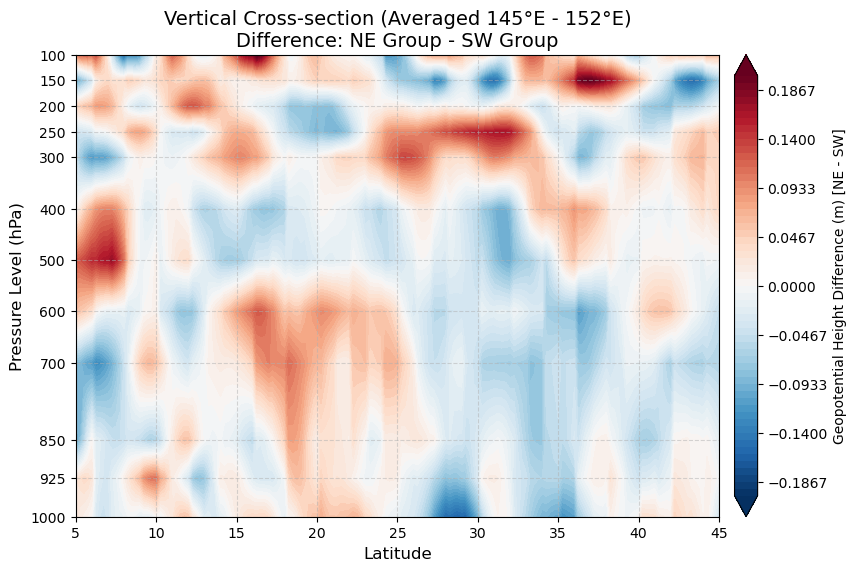

In [95]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# --- 기존 초기화 및 PCA 그룹핑 코드 (동일하게 유지) ---
# ... (distances_tar, mems_sort 구하는 부분까지 동일)
var = 't'

analysis_hour = 12 
group_num = 20

# 1. 수직 단면도를 그릴 고도(Level) 리스트 설정 (하층부터 상층까지)
levels_3d = [1000, 925, 850, 700, 600, 500, 400, 300, 250, 200, 150, 100]

# 2. 단면도를 자를 경도(Longitude) 범위 설정 (TUTT가 강하게 위치했던 구역)
target_lon_min = 145
target_lon_max = 152

print(f"Analysis Hour: {analysis_hour}h, Cross-section at Lon: {target_lon_min}-{target_lon_max}E")


if lon_grid.ndim == 2:
    lon_1d = lon_grid[0, :]  # 경도는 x축(열)이므로 첫 번째 행 전체
    lat_1d = lat_grid[:, 0]  # 위도는 y축(행)이므로 첫 번째 열 전체
else:
    lon_1d = lon_grid
    lat_1d = lat_grid

# 경도 인덱스 찾기 (lon_grid가 1D 배열이라고 가정)
lon_idx = np.where((lon_1d >= target_lon_min) & (lon_1d <= target_lon_max))[0]

# --- 3. 데이터 수집 함수화 (반복 방지) ---
def get_3d_z_group(mems_group):
    group_z_3d = [] # (member, level, lat) 저장용
    for ens in mems_group:
        ens_z_2d = [] # (level, lat)
        met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", analysis_hour, surface_dict, upper_dict, 
                  lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
        
        for level in levels_3d:
            # (lat, lon) 2D 데이터 로드
            z = met.met_data(var, level=level) 
            # 타겟 경도 구간의 평균을 내어 1D(lat) 배열로 축소
            z_lon_mean = np.mean(z[:, lon_idx], axis=1) 
            ens_z_2d.append(z_lon_mean)
            
        group_z_3d.append(ens_z_2d)
    return np.array(group_z_3d) # shape: (group_num, len(levels_3d), len(lat_grid))

# SW(서진) 그룹과 NE(북동진) 그룹의 3D 데이터 수집
z_sw_3d = get_3d_z_group(mems_sort[:group_num])
z_ne_3d = get_3d_z_group(mems_sort[-group_num:])

# 멤버 앙상블 평균 계산 -> shape: (len(levels_3d), len(lat_grid))
z_sw_mean_3d = np.mean(z_sw_3d, axis=0)
z_ne_mean_3d = np.mean(z_ne_3d, axis=0)

# 두 그룹 간의 지위고도 차이 (NE 그룹 - SW 그룹)
# 이 값이 음수(-)인 영역이 NE그룹에서 TUTT가 더 깊게 파고 내려온 '한랭/저기압 쐐기' 영역입니다.
z_diff_3d = z_ne_mean_3d - z_sw_mean_3d 

# --- 4. 수직 단면도 (Cross-section) 그리기 ---
fig, ax = plt.subplots(figsize=(10, 6))

# X축: 위도 (lat_grid), Y축: 고도 (levels_3d)
# 배경 색상: 지위고도 차이 (파란색일수록 NE 그룹의 고도가 더 낮음 = 저기압성/TUTT가 강함)
X, Y = np.meshgrid(lat_1d, levels_3d)
# contour_diff = ax.contourf(X, Y, z_diff_3d, levels=np.linspace(-5, 5, 61), cmap='RdBu_r', extend='both')
contour_diff = ax.contourf(X, Y, z_diff_3d, levels=np.linspace(-0.2, 0.2, 61), cmap='RdBu_r', extend='both')
contour_diff = ax.contourf(X, Y, z_diff_3d, levels=np.linspace(-0.2, 0.2, 61), cmap='RdBu_r', extend='both')
plt.colorbar(contour_diff, label='Geopotential Height Difference (m) [NE - SW]', pad=0.02)

# 등고선: SW 그룹의 평균 지위고도 (배경 대기 구조 참조용)
# 상층으로 갈수록 Z값이 기하급수적으로 커지므로, 직관적인 시각화를 위해 차이값(Diff)에 집중
# contour_base = ax.contour(X, Y, z_sw_mean_3d, colors='black', linewidths=0.5, alpha=0.5)

# Y축(고도)를 기압 단위에 맞게 뒤집기 (하층이 아래로 가도록)
ax.invert_yaxis()
# 상층 변화를 잘 보기 위해 로그 스케일 적용 (선택 사항)
# ax.set_yscale('symlog') 
# ax.set_xlim(33,25)

ax.set_title(f"Vertical Cross-section (Averaged {target_lon_min}°E - {target_lon_max}°E)\nDifference: NE Group - SW Group", fontsize=14)
ax.set_xlabel("Latitude", fontsize=12)
ax.set_ylabel("Pressure Level (hPa)", fontsize=12)
ax.set_yticks(levels_3d)
ax.set_yticklabels(levels_3d)
ax.grid(True, linestyle='--', alpha=0.5)

plt.show()

NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...
SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...


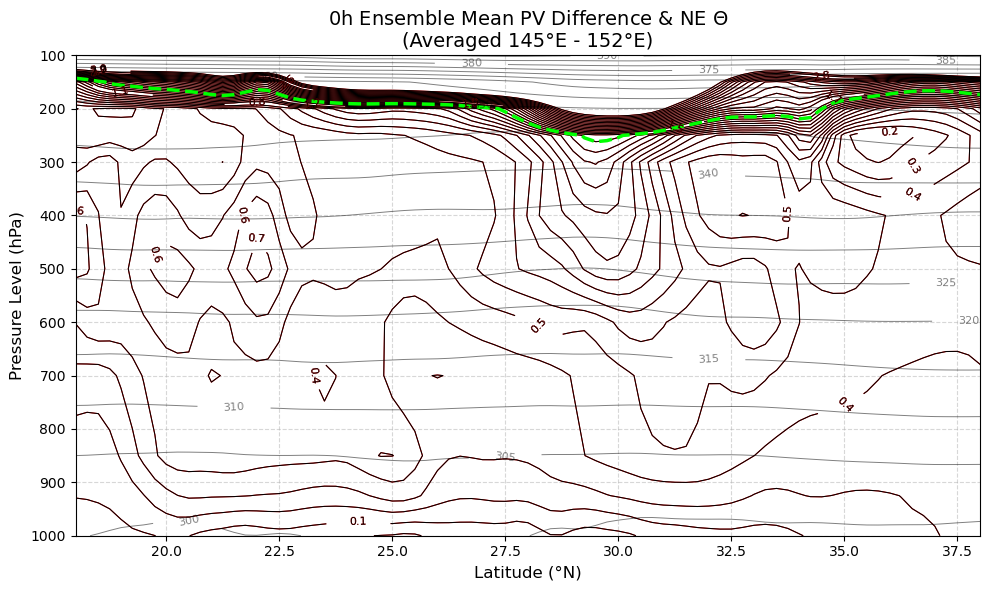

NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...
SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...


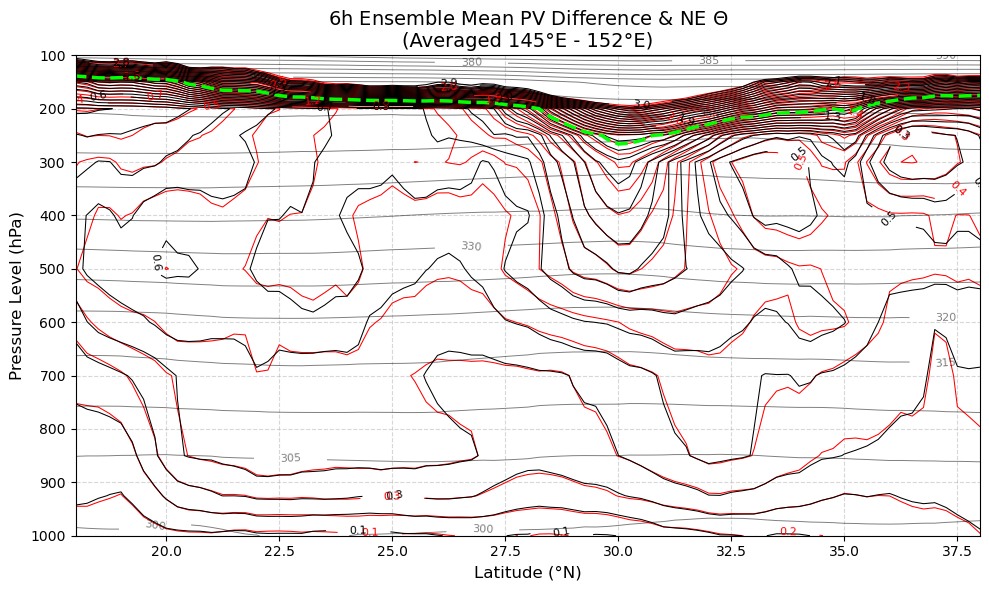

NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...
SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...


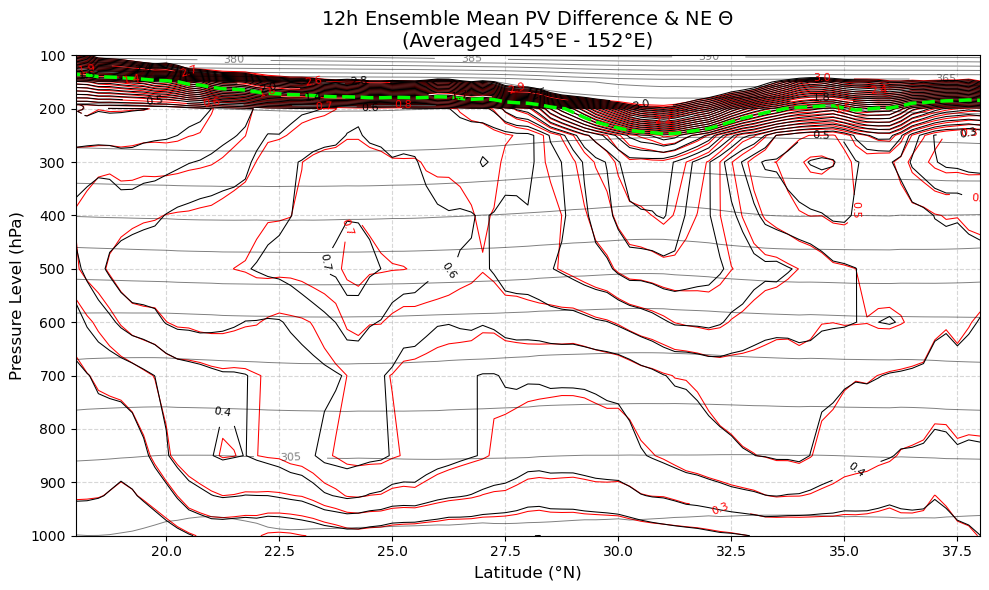

NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...
SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...


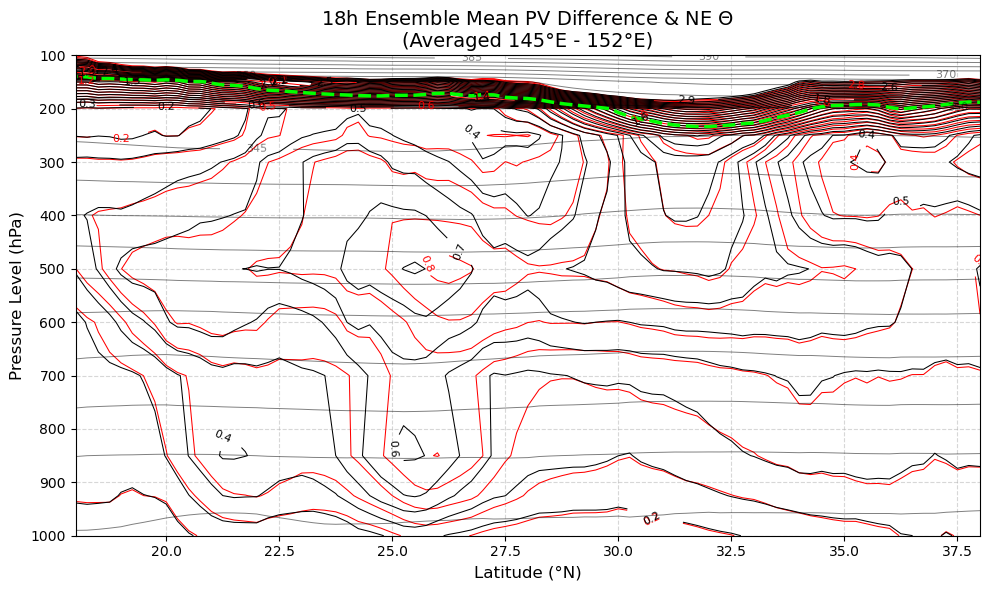

NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...
SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...


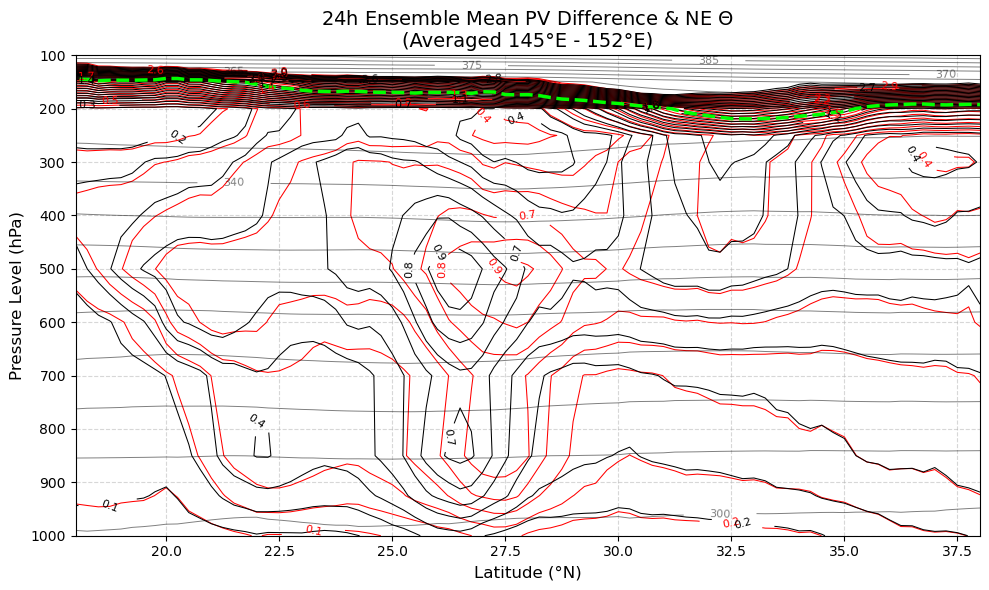

In [115]:
import numpy as np
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.units import units

# ---------------------------------------------------------
# 1. 1D 좌표계 및 기본 설정
# ---------------------------------------------------------


if lon_grid.ndim == 2:
    lon_1d = lon_grid[0, :]
    lat_1d = lat_grid[:, 0]
else:
    lon_1d = lon_grid
    lat_1d = lat_grid



# ---------------------------------------------------------
# 2. 그룹별 PV 앙상블 평균을 구하는 함수 정의
# ---------------------------------------------------------
def get_pv_ensemble_mean(mems_group, tutt_lon_min = 145, tutt_lon_max = 150):

    lon_idx = np.where((lon_1d >= tutt_lon_min) & (lon_1d <= tutt_lon_max))[0]
    group_pv_2d = []    
    group_theta_2d = [] 
    
    # ★ 수정: 차원의 이름을 'level'에서 'pressure'로 완전히 바꿉니다!
    coords = {
        'pressure': ('pressure', levels_3d, {'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}),
        'latitude': ('latitude', lat_1d, {'units': 'degrees_north', 'standard_name': 'latitude', 'axis': 'Y'}),
        'longitude': ('longitude', lon_1d, {'units': 'degrees_east', 'standard_name': 'longitude', 'axis': 'X'})
    }
    dims = ['pressure', 'latitude', 'longitude']
    
    # 기압(Pressure) 객체 역시 차원과 좌표 이름을 'pressure'로 맞춤
    P_da = xr.DataArray(levels_3d, coords={'pressure': levels_3d}, dims=['pressure'], 
                        attrs={'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}).metpy.quantify()
    
    for ens in mems_group:
        met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", 
                  analysis_hour, surface_dict, upper_dict, 
                  lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
        
        t_3d, u_3d, v_3d = [], [], []
        # (주의: 여기서 쓰는 level 변수는 met.met_data에 넣기 위한 값이므로 그대로 두시면 됩니다)
        for level in levels_3d:
            t_3d.append(met.met_data('t', level=level))
            u_3d.append(met.met_data('u', level=level))
            v_3d.append(met.met_data('v', level=level))
            
        T_np = np.array(t_3d)
        U_np = np.array(u_3d)
        V_np = np.array(v_3d)
        
        # 배열 생성 시 변경된 dims와 coords가 적용됨
        T_da = xr.DataArray(T_np, coords=coords, dims=dims, attrs={'units': 'K'}).metpy.quantify()
        U_da = xr.DataArray(U_np, coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        V_da = xr.DataArray(V_np, coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        
        # 3. 온위 및 PV 계산
        theta_da = mpcalc.potential_temperature(P_da, T_da)
        # 이제 MetPy가 'pressure'라는 이름을 보고 Z축임을 100% 확신하므로 경고가 사라집니다.
        pv_da = mpcalc.potential_vorticity_baroclinic(theta_da, P_da, U_da, V_da)
        
        # (이하 코드 동일)
        pv_pvu = (pv_da * 1e6).metpy.magnitude
        theta_val = theta_da.metpy.magnitude
        
        pv_cross = np.nanmean(pv_pvu[:, :, lon_idx], axis=2)
        theta_cross = np.nanmean(theta_val[:, :, lon_idx], axis=2)
        
        group_pv_2d.append(pv_cross)
        group_theta_2d.append(theta_cross)
        
    pv_ens_mean = np.mean(np.array(group_pv_2d), axis=0)
    theta_ens_mean = np.mean(np.array(group_theta_2d), axis=0)
    
    return pv_ens_mean, theta_ens_mean

group_num = 20
tutt_lon_min = 145
tutt_lon_max = 152
# tutt_lon_min = 150
# tutt_lon_max = 155
# tutt_lon_min = 147
# tutt_lon_max = 153

for analysis_hour in [0, 6, 12, 18, 24]:
    # ---------------------------------------------------------
    # 3. NE 그룹 및 SW 그룹 실행 (시간이 조금 걸릴 수 있습니다)
    # ---------------------------------------------------------
    print("NE 그룹 멤버별 PV 계산 및 앙상블 평균 중...")
    pv_ne_mean, theta_ne_mean = get_pv_ensemble_mean(mems_sort[-group_num:], tutt_lon_min, tutt_lon_max)

    print("SW 그룹 멤버별 PV 계산 및 앙상블 평균 중...")
    pv_sw_mean, theta_sw_mean = get_pv_ensemble_mean(mems_sort[:group_num], tutt_lon_min, tutt_lon_max)

    # 두 그룹 간의 PV 편차 계산
    pv_diff = pv_ne_mean - pv_sw_mean

    # ---------------------------------------------------------
    # 4. 시각화 (동일)
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6))
    X, Y = np.meshgrid(lat_1d, levels_3d)

    # (1) PV 편차 Shading
    levels_pv = np.linspace(-0.5, 0.5, 31) 
    # cf = plt.contourf(X, Y, pv_diff, levels=levels_pv, cmap='RdBu_r', extend='both')
    # plt.colorbar(cf, label='Potential Vorticity Difference (PVU) [NE - SW]')

    pv_ne_con = plt.contour(X, Y, pv_ne_mean, levels=np.linspace(0,3.0,31), linewidths = 0.75, colors = 'red')
    plt.clabel(pv_ne_con, inline=True, fontsize=8, fmt='%1.1f')
    pv_sw_con = plt.contour(X, Y, pv_sw_mean, levels=np.linspace(0,3.0,31), linewidths = 0.75, colors = 'black')
    plt.clabel(pv_sw_con, inline=True, fontsize=8, fmt='%1.1f')


    # (2) NE 그룹 온위 등치선 오버레이
    cs = plt.contour(X, Y, theta_ne_mean, levels=np.arange(280, 400, 5), colors='black', linewidths=0.7, alpha=0.5)
    plt.clabel(cs, inline=True, fontsize=8, fmt='%1.0f')

    # (3) 대류권계면 (1.5 PVU) 
    plt.contour(X, Y, pv_ne_mean, levels=[1.5], colors='lime', linewidths=2.5, linestyles='--')

    plt.gca().invert_yaxis()
    plt.xlim(18, 38)
    # plt.ylim(1000, 50)
    plt.xlabel('Latitude (°N)', fontsize=12)
    plt.ylabel('Pressure Level (hPa)', fontsize=12)
    plt.title(f'{analysis_hour}h Ensemble Mean PV Difference & NE $\Theta$\n(Averaged {tutt_lon_min}°E - {tutt_lon_max}°E)', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

In [169]:
levels_3d

[1000, 925, 850, 700, 600, 500, 400, 300, 250, 200, 150, 100]


[0h] 대각선 단면 추출 중...


NE Group 200hPa TUTT Max PV: 3.91
NE Group 200hPa TUTT Max RV: 12.89
SW Group 200hPa TUTT Max PV: 3.91
SW Group 200hPa TUTT Max RV: 12.89


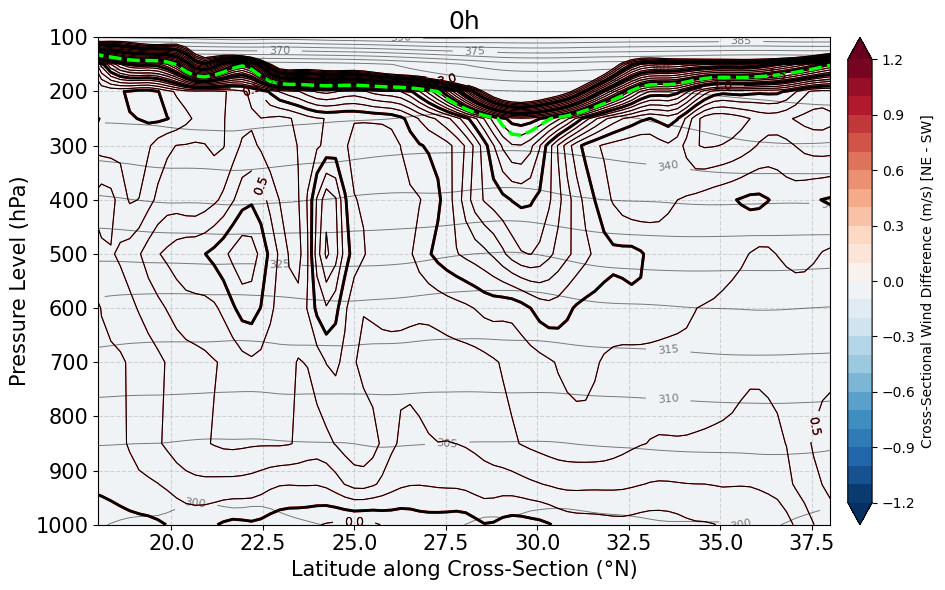

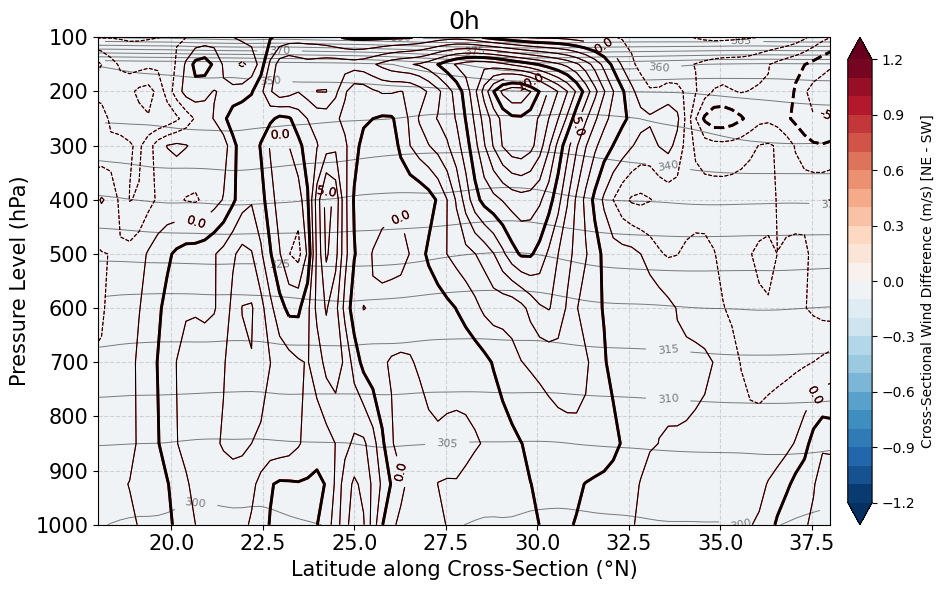


[6h] 대각선 단면 추출 중...
NE Group 200hPa TUTT Max PV: 3.06
NE Group 200hPa TUTT Max RV: 10.48
SW Group 200hPa TUTT Max PV: 3.12
SW Group 200hPa TUTT Max RV: 10.27


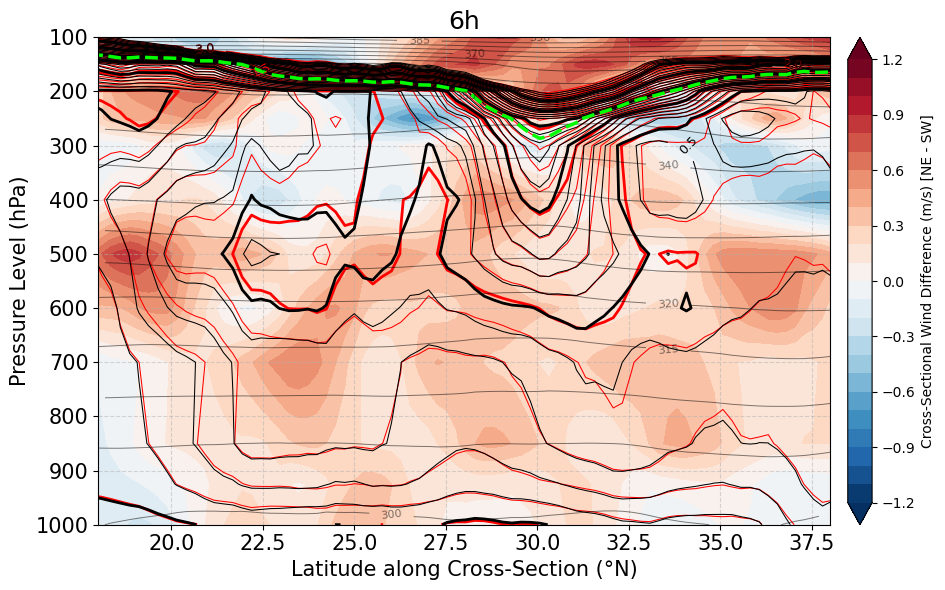

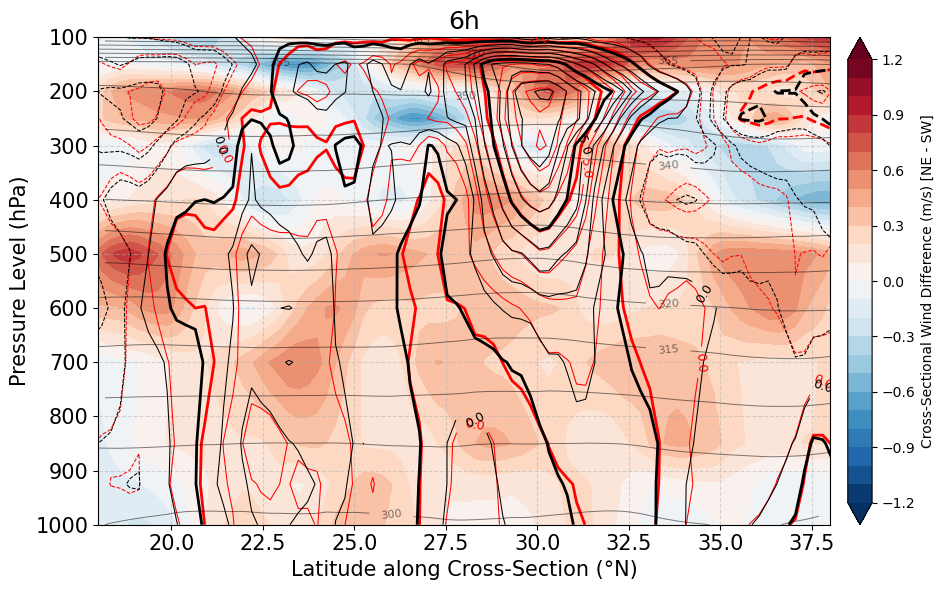


[12h] 대각선 단면 추출 중...
NE Group 200hPa TUTT Max PV: 3.11
NE Group 200hPa TUTT Max RV: 9.38
SW Group 200hPa TUTT Max PV: 3.19
SW Group 200hPa TUTT Max RV: 9.29


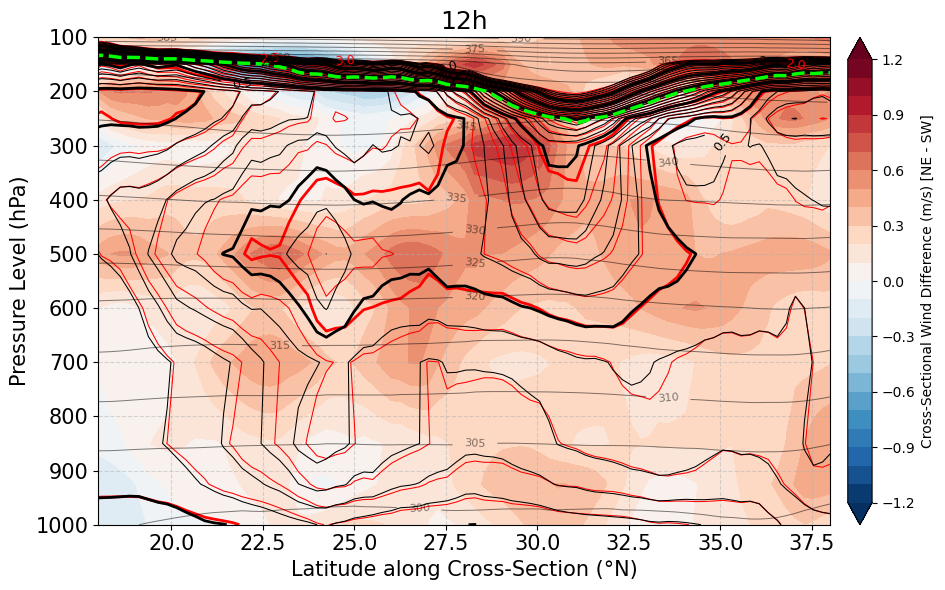

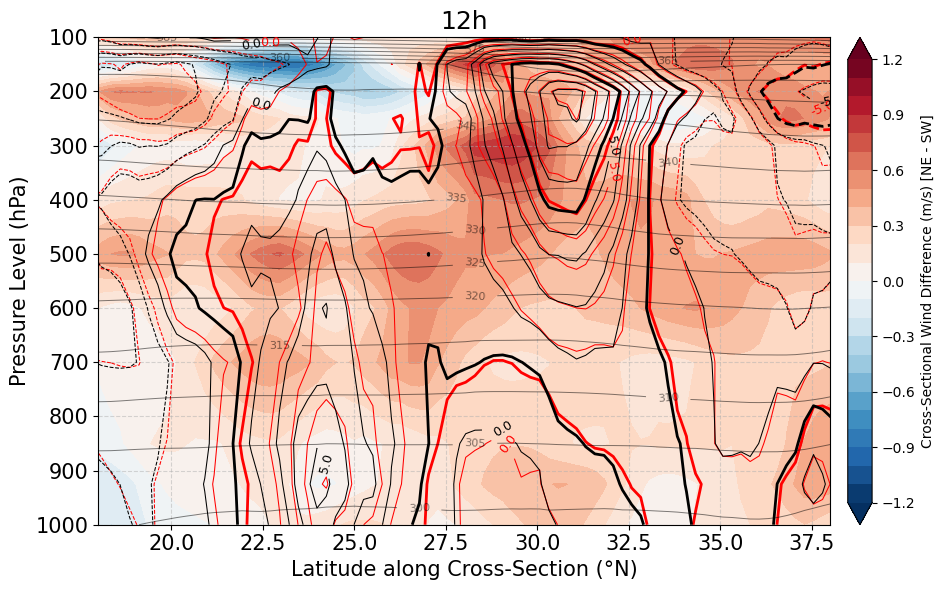


[18h] 대각선 단면 추출 중...
NE Group 200hPa TUTT Max PV: 2.62
NE Group 200hPa TUTT Max RV: 7.14
SW Group 200hPa TUTT Max PV: 2.7
SW Group 200hPa TUTT Max RV: 7.36


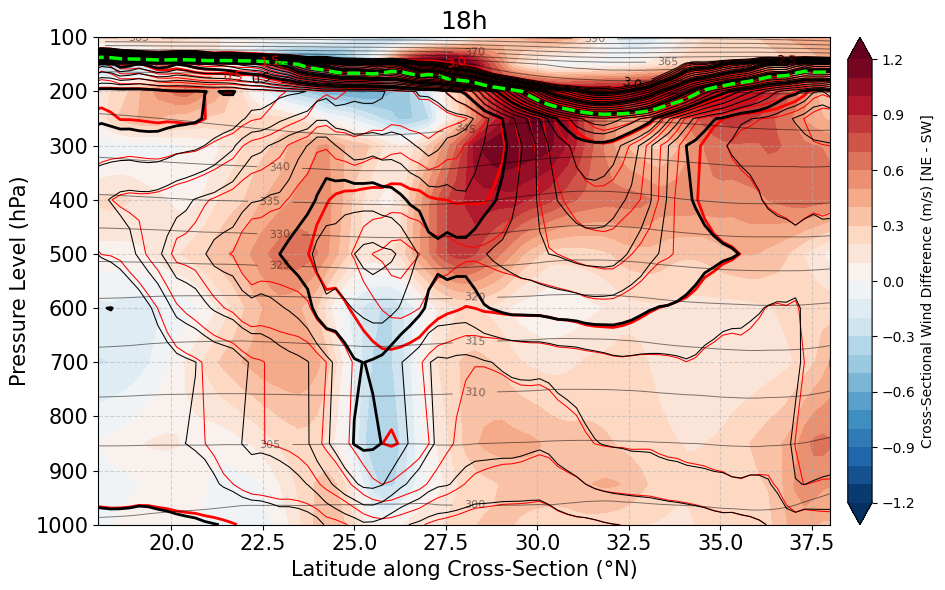

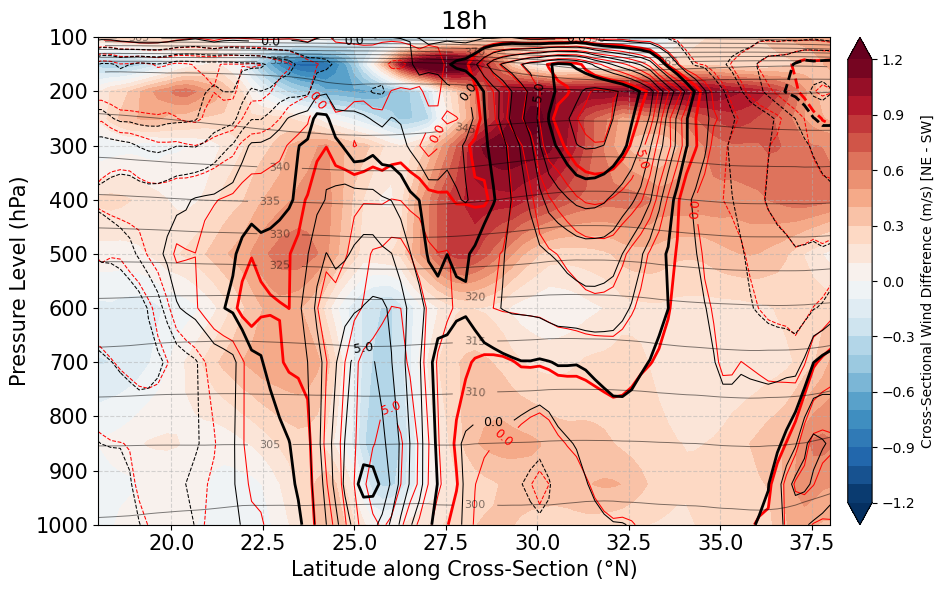


[24h] 대각선 단면 추출 중...
NE Group 200hPa TUTT Max PV: 2.12
NE Group 200hPa TUTT Max RV: 5.43
SW Group 200hPa TUTT Max PV: 2.21
SW Group 200hPa TUTT Max RV: 5.84


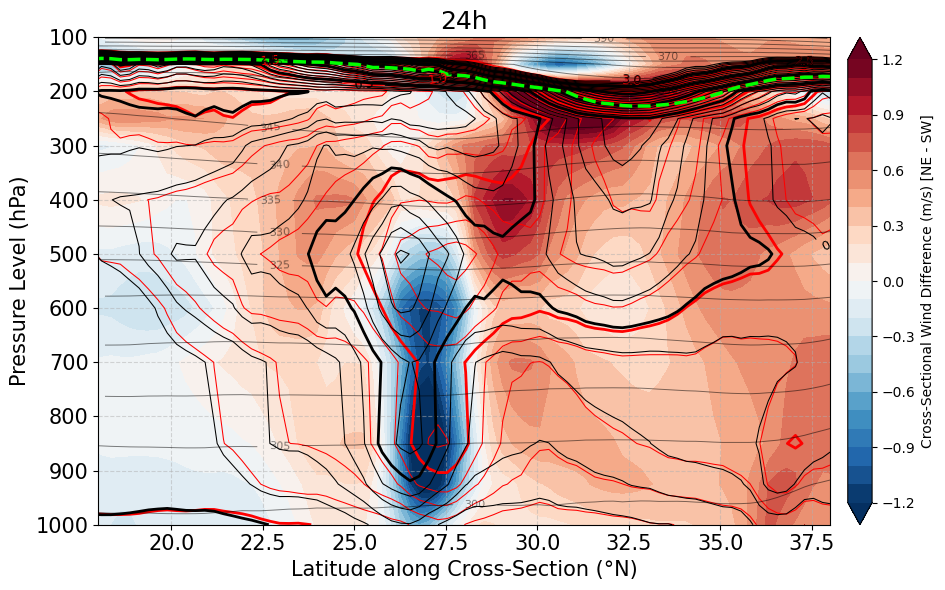

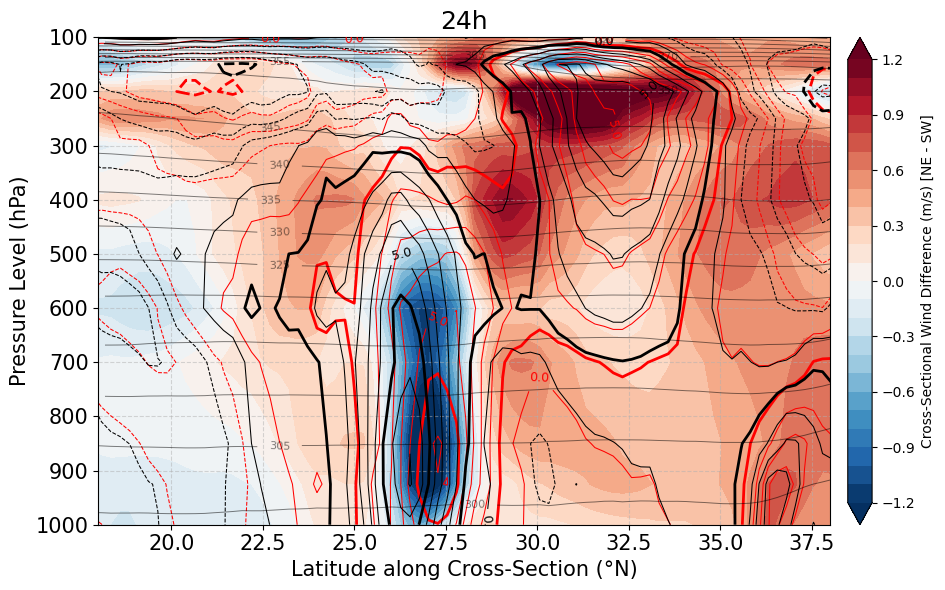


[36h] 대각선 단면 추출 중...
NE Group 200hPa TUTT Max PV: 1.08
NE Group 200hPa TUTT Max RV: 0.4
SW Group 200hPa TUTT Max PV: 1.25
SW Group 200hPa TUTT Max RV: 0.63


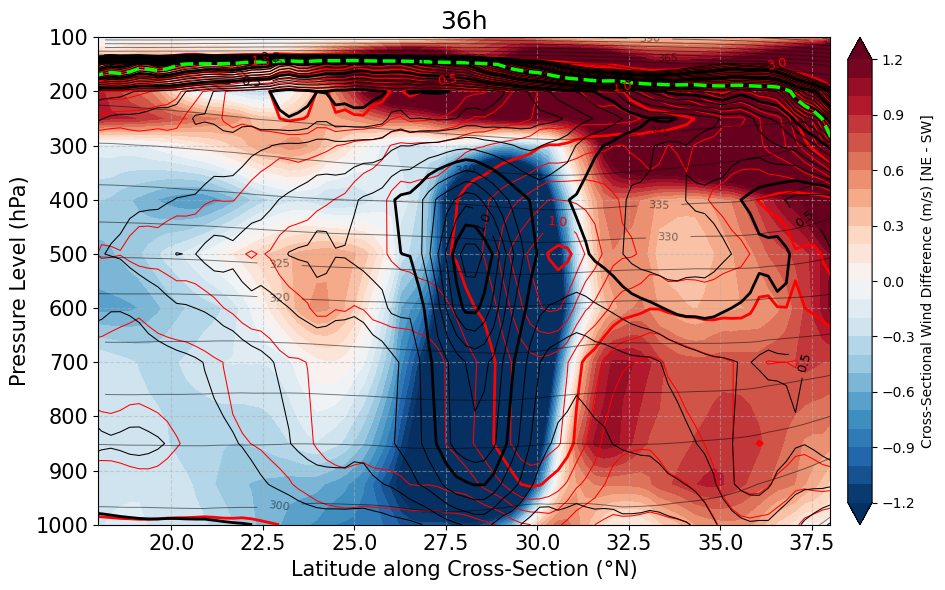

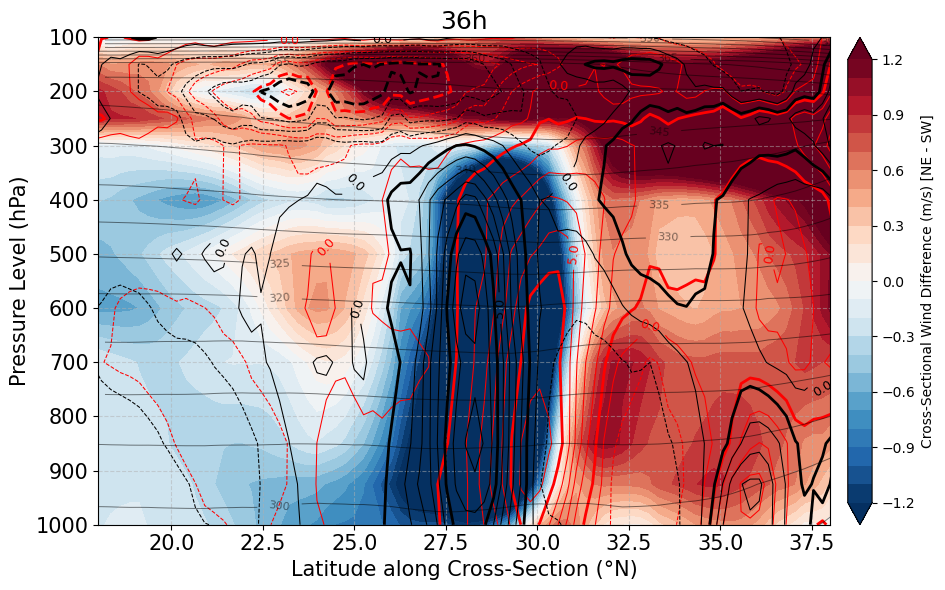

In [195]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import metpy.calc as mpcalc
from metpy.units import units
import metpy.interpolate  # ★ 대각선 단면도를 위한 모듈 추가

# ---------------------------------------------------------
# 1. 1D 좌표계 및 기본 설정 (기존과 동일)
# ---------------------------------------------------------
if lon_grid.ndim == 2:
    lon_1d = lon_grid[0, :]
    lat_1d = lat_grid[:, 0]
else:
    lon_1d = lon_grid
    lat_1d = lat_grid

# ---------------------------------------------------------
# 2. 대각선 단면 PV 앙상블 평균을 구하는 함수 정의
# ---------------------------------------------------------
def get_diagonal_pv_mean(mems_group, start_pt, end_pt, width_deg=6.0, num_lines=13, tangential_wind_opt=True):
    all_mems_pv_cross, all_mems_theta_cross, all_mems_rv_cross, all_mems_t_wind_cross = [],[], [], []
    offsets = np.linspace(-width_deg/2, width_deg/2, num_lines)
    
    # MetPy 인식용 좌표 및 차원 설정
    coords = {
        'pressure': ('pressure', levels_3d, {'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}),
        'latitude': ('latitude', lat_1d, {'units': 'degrees_north', 'standard_name': 'latitude', 'axis': 'Y'}),
        'longitude': ('longitude', lon_1d, {'units': 'degrees_east', 'standard_name': 'longitude', 'axis': 'X'})
    }
    dims = ['pressure', 'latitude', 'longitude']
    
    P_da = xr.DataArray(levels_3d, coords={'pressure': levels_3d}, dims=['pressure'], 
                        attrs={'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}).metpy.quantify()
    
    for ens in mems_group:
        met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", 
                  analysis_hour, surface_dict, upper_dict, 
                  lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
        
        t_3d, u_3d, v_3d = [], [], []
        for level in levels_3d:
            t_3d.append(met.met_data('t', level=level))
            u_3d.append(met.met_data('u', level=level))
            v_3d.append(met.met_data('v', level=level))
            
        T_da = xr.DataArray(np.array(t_3d), coords=coords, dims=dims, attrs={'units': 'K'}).metpy.quantify()
        U_da = xr.DataArray(np.array(u_3d), coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        V_da = xr.DataArray(np.array(v_3d), coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        
        # 온위 및 PV 계산
        theta_da = mpcalc.potential_temperature(P_da, T_da)
        pv_da = mpcalc.potential_vorticity_baroclinic(theta_da, P_da, U_da, V_da)
        rv_da = mpcalc.vorticity(U_da, V_da)
        
        # ★ 핵심: 3D 변수들을 하나의 Xarray Dataset으로 묶기
        ds_3d = xr.Dataset(
            {
                # .m 대신 .metpy.magnitude 사용!
                "pv": (dims, (pv_da * 1e6).metpy.magnitude),
                "theta": (dims, theta_da.metpy.magnitude),
                "rv": (dims, (rv_da * 1e05).metpy.magnitude),
                "u": (dims, U_da.metpy.magnitude), # U 바람
                "v": (dims, V_da.metpy.magnitude)  # V 바람
            },
            coords=coords
        )
        
        # ★ 추가: MetPy에게 이 위경도 좌표가 지구의 표준 위경도(Lat/Lon)임을 알려줌
        ds_3d = ds_3d.metpy.assign_crs(grid_mapping_name='latitude_longitude')
        
        # MetPy가 좌표를 완전히 이해하도록 파싱
        ds_3d = ds_3d.metpy.parse_cf() 

        line_pvs, line_thetas, line_rvs, line_t_winds = [], [], [], []
        # 대각선 단면도 추출
        for off in offsets:
            # 시작점과 끝점에 오프셋을 적용하여 대각선의 위치를 조정
            start_pt_off = (start_pt[0], start_pt[1]+off)
            end_pt_off = (end_pt[0], end_pt[1]+off)
            cross = metpy.interpolate.cross_section(ds_3d, start=start_pt_off, end=end_pt_off, steps=100)
            t_wind, n_wind = mpcalc.cross_section_components(cross['u'], cross['v'])
            tn_wind = t_wind if tangential_wind_opt else n_wind  # ★ 옵션에 따라 접선풍 또는 수직풍 선택
            if off == 0:
                cross_0 = cross  # 중심선 단면 저장 (시각화용)
            line_pvs.append(cross['pv'].values)
            line_thetas.append(cross['theta'].values)
            line_rvs.append(cross['rv'].values)
            line_t_winds.append(tn_wind.values) # ★ 계산된 단면 방향 바람값 저장

        all_mems_pv_cross.append(np.mean(line_pvs, axis=0))
        all_mems_theta_cross.append(np.mean(line_thetas, axis=0))
        all_mems_rv_cross.append(np.mean(line_rvs, axis=0))
        all_mems_t_wind_cross.append(np.mean(line_t_winds, axis=0))
        
    # 앙상블 평균
    pv_ens_mean = np.mean(np.array(all_mems_pv_cross), axis=0)
    theta_ens_mean = np.mean(np.array(all_mems_theta_cross), axis=0)
    rv_ens_mean = np.mean(np.array(all_mems_rv_cross), axis=0)
    t_wind_ens_mean = np.mean(np.array(all_mems_t_wind_cross), axis=0) # ★ 평균 계산
    
    lats_cross = cross_0['latitude'].values
    lons_cross = cross_0['longitude'].values

    # ★ t_wind_ens_mean 추가 반환
    return pv_ens_mean, theta_ens_mean, rv_ens_mean, t_wind_ens_mean, lats_cross, lons_cross

# ---------------------------------------------------------
# 3. 실행 파트
# ---------------------------------------------------------
group_num = 20

# ★ 자르고 싶은 대각선의 시작점(위도, 경도)과 끝점(위도, 경도) 지정
# 예시: 북서쪽(40N, 140E)에서 남동쪽(15N, 155E)으로 긋는 선
end_point = (40, 142) 
start_point = (15, 155) 
tangential_wind_opt = True

for analysis_hour in [0, 6, 12, 18, 24, 36]:
    print(f"\n[{analysis_hour}h] 대각선 단면 추출 중...")
    
    pv_ne_mean, theta_ne_mean, rv_ne_mean, t_wind_ne_mean, lats_cross, lons_cross = get_diagonal_pv_mean(mems_sort[-group_num:], start_point, end_point, tangential_wind_opt = tangential_wind_opt)
    pv_sw_mean, theta_sw_mean, rv_sw_mean, t_wind_sw_mean, _, _ = get_diagonal_pv_mean(mems_sort[:group_num], start_point, end_point, tangential_wind_opt = tangential_wind_opt)
    print(f'NE Group 200hPa TUTT Max PV: {np.max(pv_ne_mean[np.where(np.array(levels_3d) == 200)[0][0],(lats_cross <=35) & (lats_cross >= 25)]).round(2)}')
    print(f'NE Group 200hPa TUTT Max RV: {np.max(rv_ne_mean[np.where(np.array(levels_3d) == 200)[0][0],(lats_cross <=35) & (lats_cross >= 25)]).round(2)}')
    print(f'SW Group 200hPa TUTT Max PV: {np.max(pv_sw_mean[np.where(np.array(levels_3d) == 200)[0][0],(lats_cross <=35) & (lats_cross >= 25)]).round(2)}')
    print(f'SW Group 200hPa TUTT Max RV: {np.max(rv_sw_mean[np.where(np.array(levels_3d) == 200)[0][0],(lats_cross <=35) & (lats_cross >= 25)]).round(2)}')

    # ---------------------------------------------------------
    # 4. 시각화 
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6))
    
    # X축은 대각선 상의 위도(Latitude)를 사용
    X, Y = np.meshgrid(lats_cross, levels_3d)

    #--- tangential wind 차이 ---
    t_wind_diff = t_wind_ne_mean - t_wind_sw_mean
    t_wind_conf = plt.contourf(X, Y, t_wind_diff, levels=np.arange(-1.2, 1.3, 0.1), cmap='RdBu_r', extend = 'both')
    plt.colorbar(t_wind_conf, label='Cross-Sectional Wind Difference (m/s) [NE - SW]', pad=0.02)

    # (1) 등치선 그리기
    levels_all = np.linspace(0, 3.0, 31)
    
    # 0.5 단위(인덱스가 5의 배수)일 때는 굵게(1.8), 아닐 때는 얇게(0.5) 리스트 생성
    lws = [2 if i % 5 == 1 else 0.75 for i in range(len(levels_all))]
    
    # 라벨을 달 0.5 간격의 레벨만 따로 추출 (부동소수점 오차 방지를 위해 슬라이싱 사용)
    levels_thick = levels_all[::5]
  
    # --- NE 그룹 ---
    pv_ne_con = plt.contour(X, Y, pv_ne_mean, levels=levels_all, linewidths=lws, colors='red')
    # levels 인자를 주어 특정 레벨(0.5 간격)에만 라벨을 달아줌
    plt.clabel(pv_ne_con, levels=levels_thick, inline=True, fontsize=9, fmt='%1.1f')
    
    # --- SW 그룹 ---
    pv_sw_con = plt.contour(X, Y, pv_sw_mean, levels=levels_all, linewidths=lws, colors='black')
    plt.clabel(pv_sw_con, levels=levels_thick, inline=True, fontsize=9, fmt='%1.1f')


    # (2) 온위 및 대류권계면 (NE 그룹 기준)
    cs = plt.contour(X, Y, theta_ne_mean, levels=np.arange(280, 400, 5), colors='black', linewidths=0.7, alpha=0.5)
    plt.clabel(cs, inline=True, fontsize=8, fmt='%1.0f')
    plt.contour(X, Y, pv_ne_mean, levels=[1.5], colors='lime', linewidths=2.5, linestyles='--')

    plt.gca().invert_yaxis()
    

    plt.xlim(18, 38)

    plt.xlabel('Latitude along Cross-Section (°N)', fontsize=15)
    plt.ylabel('Pressure Level (hPa)', fontsize=15)
    plt.title(f'{analysis_hour}h', fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.tight_layout()
    plt.show()

    #! 동일한 플롯에 Relative vorticity 등치선 추가
    plt.figure(figsize=(10, 6))
    
    # X축은 대각선 상의 위도(Latitude)를 사용
    X, Y = np.meshgrid(lats_cross, levels_3d)

    #--- tangential wind 차이 ---
    t_wind_diff = t_wind_ne_mean - t_wind_sw_mean
    t_wind_conf = plt.contourf(X, Y, t_wind_diff, levels=np.arange(-1.2, 1.3, 0.1), cmap='RdBu_r', extend = 'both')
    plt.colorbar(t_wind_conf, label='Cross-Sectional Wind Difference (m/s) [NE - SW]', pad=0.02)

    levels_all = np.linspace(-20, 20, 41)

    # 0.5 단위(인덱스가 5의 배수)일 때는 굵게(1.8), 아닐 때는 얇게(0.5) 리스트 생성
    lws = [2 if i % 5 == 1 else 0.75 for i in range(len(levels_all))]
    
    # 라벨을 달 0.5 간격의 레벨만 따로 추출 (부동소수점 오차 방지를 위해 슬라이싱 사용)
    levels_thick = levels_all[::5]

    # (1) 등치선 그리기
    pv_ne_con = plt.contour(X, Y, rv_ne_mean, levels=levels_all, linewidths=lws, colors='red')
    plt.clabel(pv_ne_con, levels=levels_thick, inline=True, fontsize=9, fmt='%1.1f')

    pv_sw_con = plt.contour(X, Y, rv_sw_mean, levels=levels_all, linewidths=lws, colors='black')
    plt.clabel(pv_sw_con, levels=levels_thick, inline=True, fontsize=9, fmt='%1.1f')


    # (2) 온위 및 대류권계면 (NE 그룹 기준)
    cs = plt.contour(X, Y, theta_ne_mean, levels=np.arange(280, 400, 5), colors='black', linewidths=0.7, alpha=0.5)
    plt.clabel(cs, inline=True, fontsize=8, fmt='%1.0f')

    plt.gca().invert_yaxis()

    plt.xlim(18, 38)

    plt.xlabel('Latitude along Cross-Section (°N)', fontsize=15)
    plt.ylabel('Pressure Level (hPa)', fontsize=15)
    plt.title(f'{analysis_hour}h', fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.tight_layout()
    plt.show()

In [194]:
np.where(np.array(levels_3d) == 200)[0][0]
# levels_3d

9

In [183]:
np.max(pv_ne_mean[10,(lats_cross <=35) & (lats_cross >= 25)]).round(2)

3.49


[0h] 대각선 단면 추출 중...


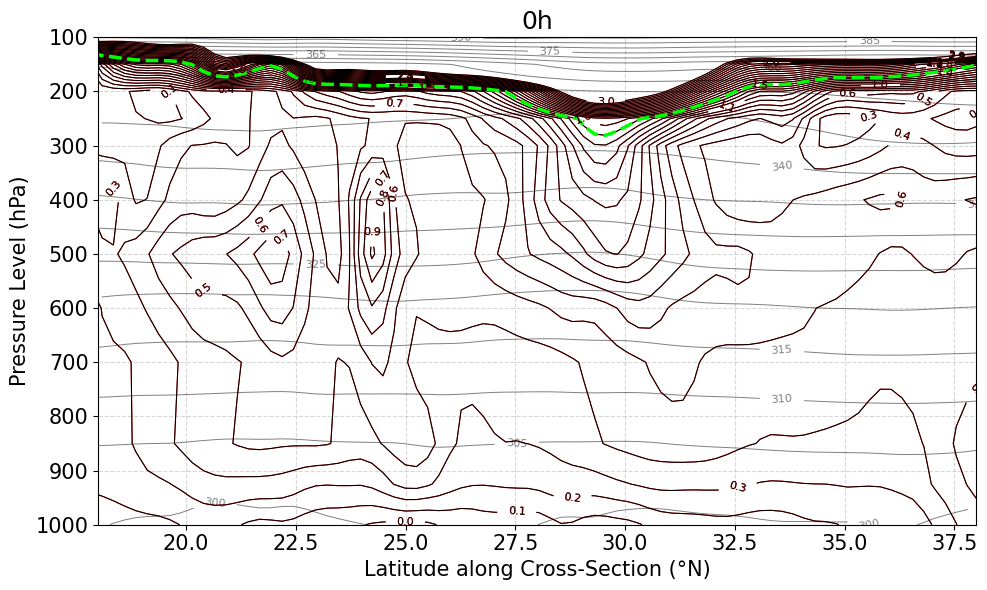

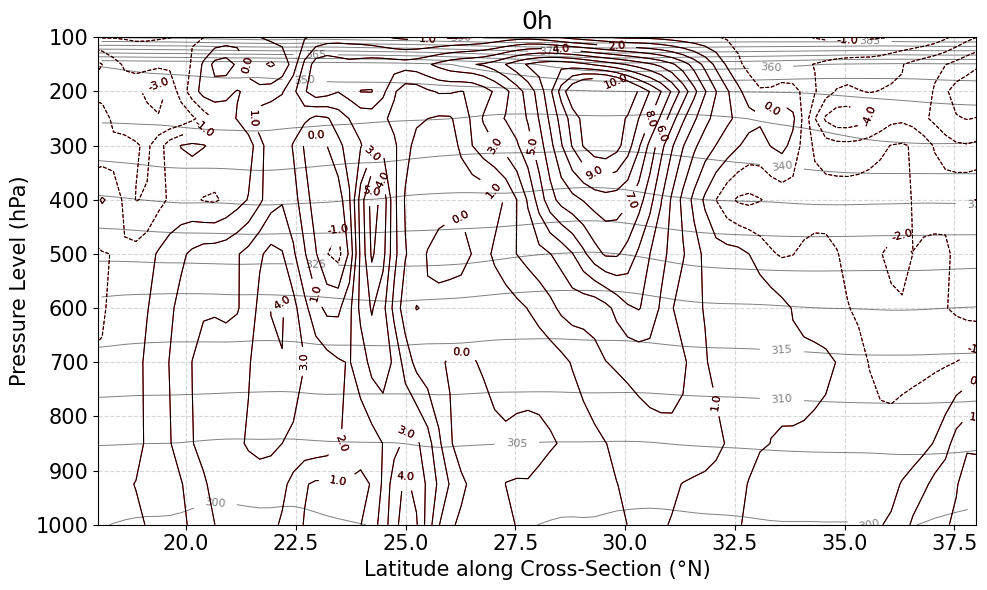


[6h] 대각선 단면 추출 중...


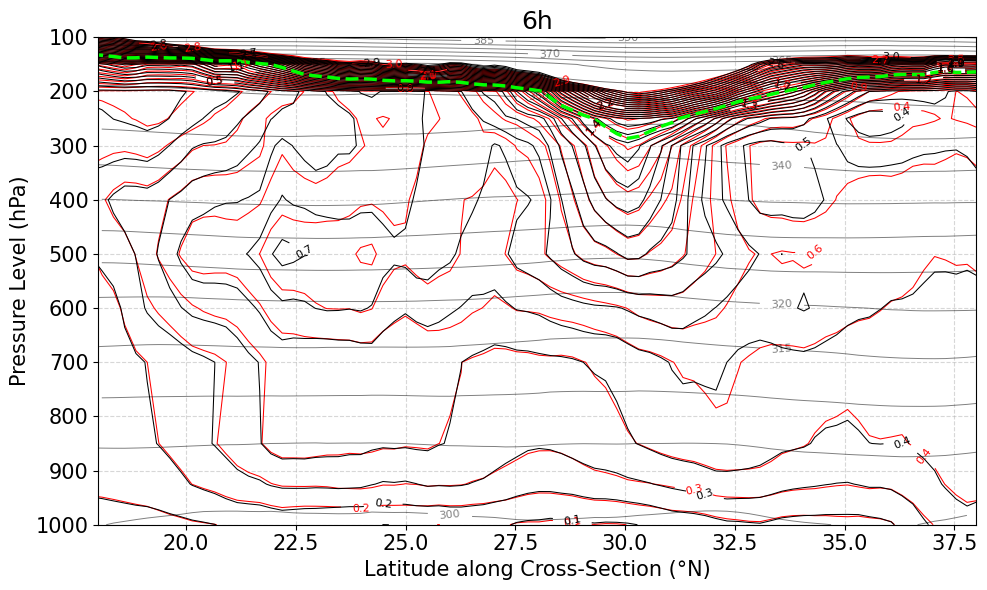

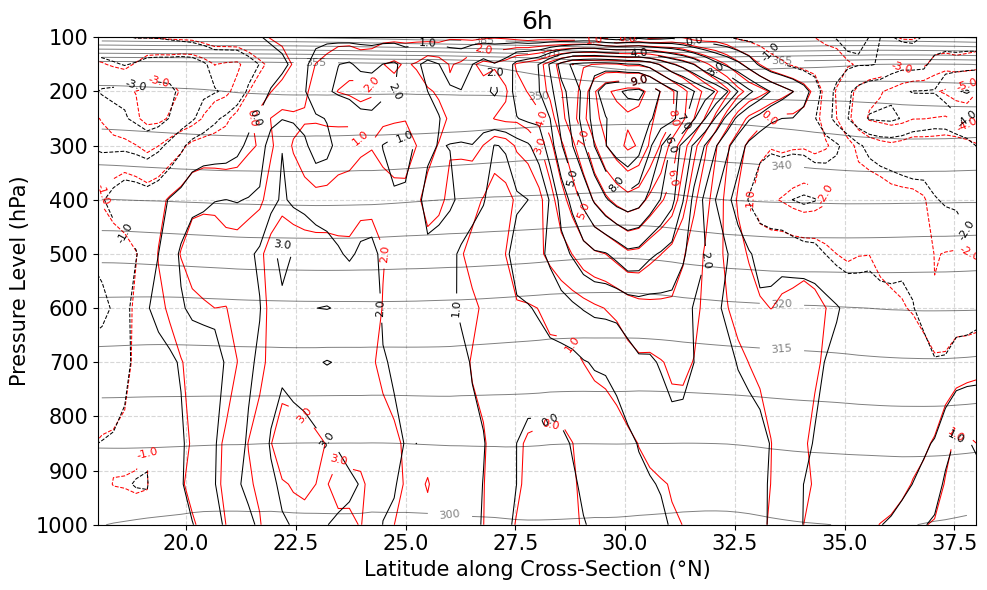


[12h] 대각선 단면 추출 중...


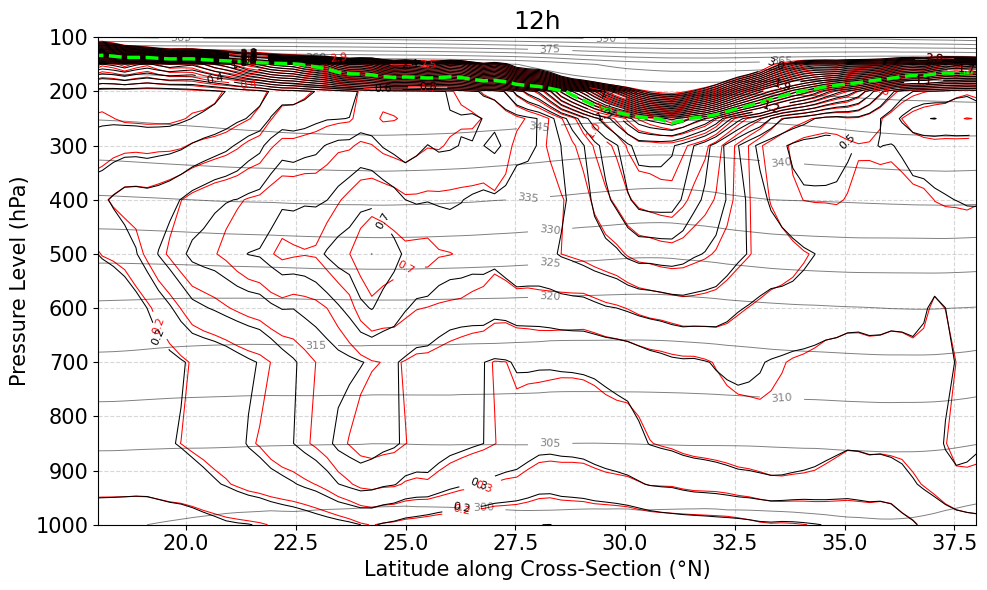

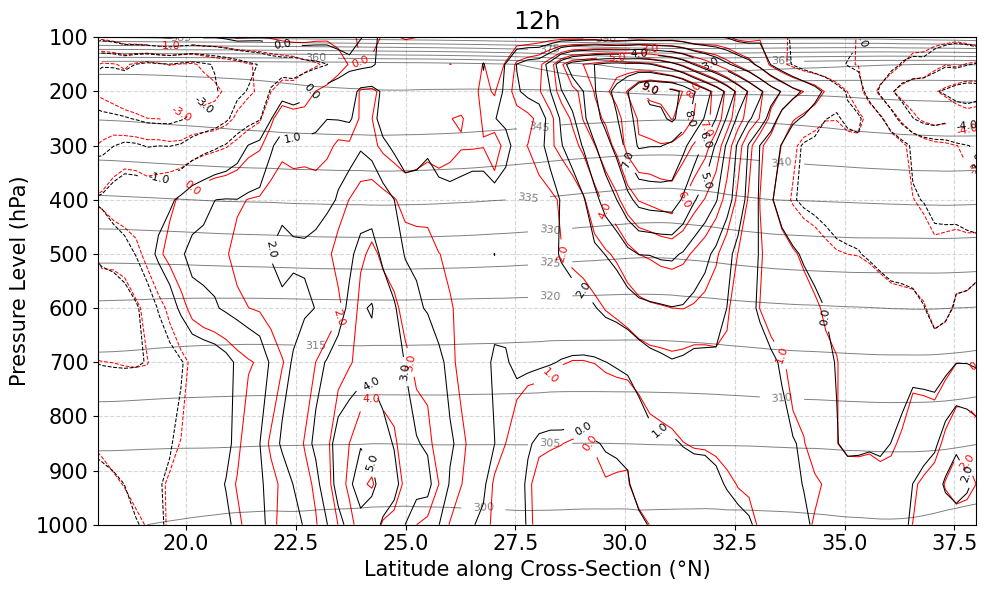


[18h] 대각선 단면 추출 중...


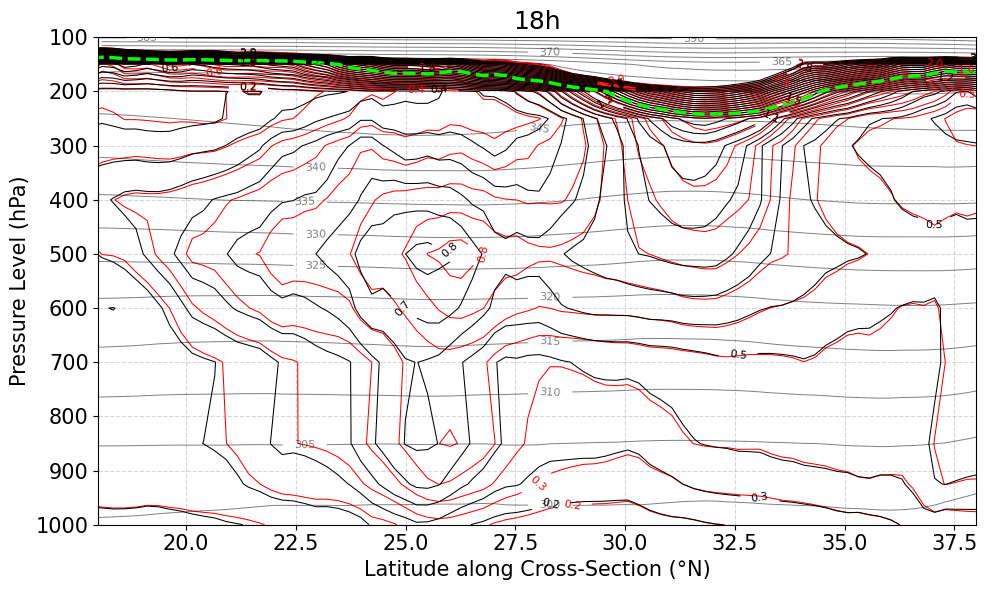

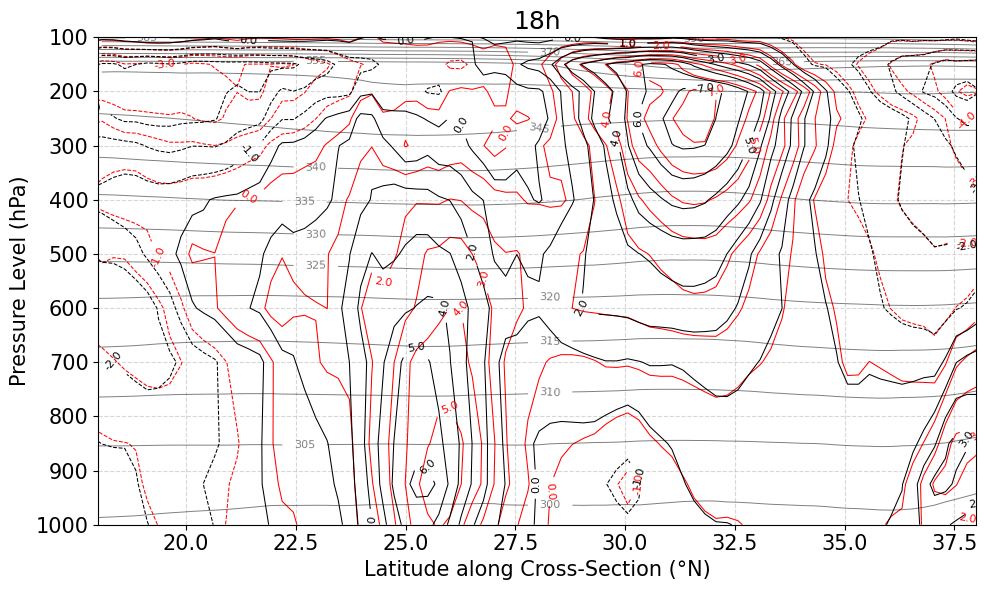


[24h] 대각선 단면 추출 중...


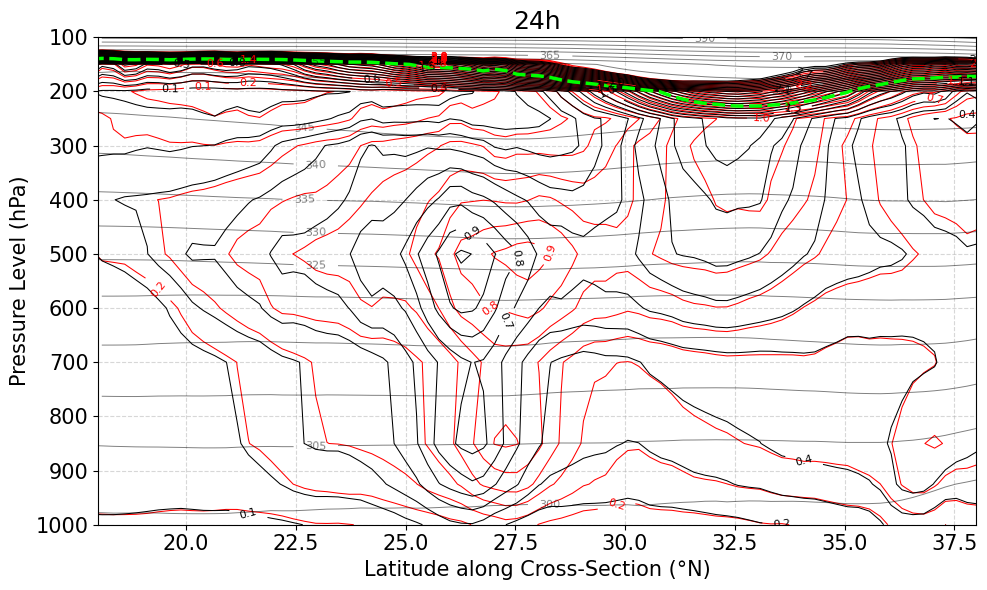

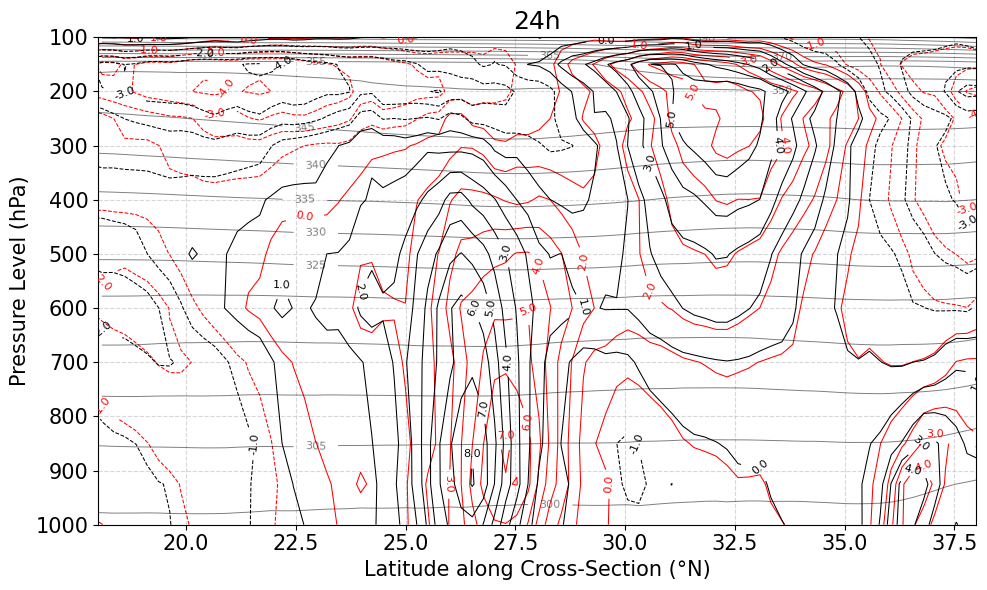

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import metpy.calc as mpcalc
from metpy.units import units
import metpy.interpolate  # ★ 대각선 단면도를 위한 모듈 추가

# ---------------------------------------------------------
# 1. 1D 좌표계 및 기본 설정 (기존과 동일)
# ---------------------------------------------------------
if lon_grid.ndim == 2:
    lon_1d = lon_grid[0, :]
    lat_1d = lat_grid[:, 0]
else:
    lon_1d = lon_grid
    lat_1d = lat_grid

# ---------------------------------------------------------
# 2. 대각선 단면 PV 앙상블 평균을 구하는 함수 정의
# ---------------------------------------------------------
def get_diagonal_pv_mean(mems_group, start_pt, end_pt, width_deg=6.0, num_lines=13):
    all_mems_pv_cross = []
    all_mems_theta_cross = []
    all_mems_rv_cross = []
    offsets = np.linspace(-width_deg/2, width_deg/2, num_lines)
    
    # MetPy 인식용 좌표 및 차원 설정
    coords = {
        'pressure': ('pressure', levels_3d, {'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}),
        'latitude': ('latitude', lat_1d, {'units': 'degrees_north', 'standard_name': 'latitude', 'axis': 'Y'}),
        'longitude': ('longitude', lon_1d, {'units': 'degrees_east', 'standard_name': 'longitude', 'axis': 'X'})
    }
    dims = ['pressure', 'latitude', 'longitude']
    
    P_da = xr.DataArray(levels_3d, coords={'pressure': levels_3d}, dims=['pressure'], 
                        attrs={'units': 'hPa', 'standard_name': 'air_pressure', 'axis': 'Z'}).metpy.quantify()
    
    for ens in mems_group:
        met = Met(f"{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}{six_hour_suffix}/{ens}", 
                  analysis_hour, surface_dict, upper_dict, 
                  lat_start, lat_end, lon_start, lon_end, lat_grid, lon_grid)
        
        t_3d, u_3d, v_3d = [], [], []
        for level in levels_3d:
            t_3d.append(met.met_data('t', level=level))
            u_3d.append(met.met_data('u', level=level))
            v_3d.append(met.met_data('v', level=level))
            
        T_da = xr.DataArray(np.array(t_3d), coords=coords, dims=dims, attrs={'units': 'K'}).metpy.quantify()
        U_da = xr.DataArray(np.array(u_3d), coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        V_da = xr.DataArray(np.array(v_3d), coords=coords, dims=dims, attrs={'units': 'm/s'}).metpy.quantify()
        
        # 온위 및 PV 계산
        theta_da = mpcalc.potential_temperature(P_da, T_da)
        pv_da = mpcalc.potential_vorticity_baroclinic(theta_da, P_da, U_da, V_da)
        rv_da = mpcalc.vorticity(U_da, V_da)
        
        # ★ 핵심: 3D 변수들을 하나의 Xarray Dataset으로 묶기
        ds_3d = xr.Dataset(
            {
                # .m 대신 .metpy.magnitude 사용!
                "pv": (dims, (pv_da * 1e6).metpy.magnitude),
                "theta": (dims, theta_da.metpy.magnitude),
                "rv": (dims, (rv_da * 1e05).metpy.magnitude)
            },
            coords=coords
        )
        
        # ★ 추가: MetPy에게 이 위경도 좌표가 지구의 표준 위경도(Lat/Lon)임을 알려줌
        ds_3d = ds_3d.metpy.assign_crs(grid_mapping_name='latitude_longitude')
        
        # MetPy가 좌표를 완전히 이해하도록 파싱
        ds_3d = ds_3d.metpy.parse_cf() 

        line_pvs = []
        line_thetas = []
        line_rvs = []
        # 대각선 단면도 추출
        for off in offsets:
            # 시작점과 끝점에 오프셋을 적용하여 대각선의 위치를 조정
            start_pt_off = (start_pt[0], start_pt[1]+off)
            end_pt_off = (end_pt[0], end_pt[1]+off)
            cross = metpy.interpolate.cross_section(ds_3d, start=start_pt_off, end=end_pt_off, steps=100)
            if off == 0:
                cross_0 = cross  # 중심선 단면 저장 (시각화용)
            line_pvs.append(cross['pv'].values)
            line_thetas.append(cross['theta'].values)
            line_rvs.append(cross['rv'].values)
            # group_pv_cross.append(cross['pv'].values)
            # group_theta_cross.append(cross['theta'].values)

        all_mems_pv_cross.append(np.mean(line_pvs, axis=0))
        all_mems_theta_cross.append(np.mean(line_thetas, axis=0))
        all_mems_rv_cross.append(np.mean(line_rvs, axis=0))
        
    # 앙상블 평균
    pv_ens_mean = np.mean(np.array(all_mems_pv_cross), axis=0)
    theta_ens_mean = np.mean(np.array(all_mems_theta_cross), axis=0)
    rv_ens_mean = np.mean(np.array(all_mems_rv_cross), axis=0)
    
    # x축 시각화를 위해 단면의 위도(또는 경도) 배열 반환
    lats_cross = cross_0['latitude'].values
    lons_cross = cross_0['longitude'].values

    return pv_ens_mean, theta_ens_mean, rv_ens_mean, lats_cross, lons_cross

# ---------------------------------------------------------
# 3. 실행 파트
# ---------------------------------------------------------
group_num = 20

# ★ 자르고 싶은 대각선의 시작점(위도, 경도)과 끝점(위도, 경도) 지정
# 예시: 북서쪽(40N, 140E)에서 남동쪽(15N, 155E)으로 긋는 선
end_point = (40, 142) 
start_point = (15, 155) 

for analysis_hour in [0, 6, 12, 18, 24]:
    print(f"\n[{analysis_hour}h] 대각선 단면 추출 중...")
    
    pv_ne_mean, theta_ne_mean, rv_ne_mean, lats_cross, lons_cross = get_diagonal_pv_mean(mems_sort[-group_num:], start_point, end_point)
    pv_sw_mean, theta_sw_mean, rv_sw_mean, _, _ = get_diagonal_pv_mean(mems_sort[:group_num], start_point, end_point)

    # ---------------------------------------------------------
    # 4. 시각화 
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6))
    
    # X축은 대각선 상의 위도(Latitude)를 사용
    X, Y = np.meshgrid(lats_cross, levels_3d)

    # (1) 등치선 그리기
    pv_ne_con = plt.contour(X, Y, pv_ne_mean, levels=np.linspace(0,3.0,31), linewidths=0.75, colors='red')
    plt.clabel(pv_ne_con, inline=True, fontsize=8, fmt='%1.1f')
    
    pv_sw_con = plt.contour(X, Y, pv_sw_mean, levels=np.linspace(0,3.0,31), linewidths=0.75, colors='black')
    plt.clabel(pv_sw_con, inline=True, fontsize=8, fmt='%1.1f')

    # (2) 온위 및 대류권계면 (NE 그룹 기준)
    cs = plt.contour(X, Y, theta_ne_mean, levels=np.arange(280, 400, 5), colors='black', linewidths=0.7, alpha=0.5)
    plt.clabel(cs, inline=True, fontsize=8, fmt='%1.0f')
    plt.contour(X, Y, pv_ne_mean, levels=[1.5], colors='lime', linewidths=2.5, linestyles='--')

    plt.gca().invert_yaxis()
    

    plt.xlim(18, 38)

    plt.xlabel('Latitude along Cross-Section (°N)', fontsize=15)
    plt.ylabel('Pressure Level (hPa)', fontsize=15)
    plt.title(f'{analysis_hour}h', fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.tight_layout()
    plt.show()

    #! 동일한 플롯에 Relative vorticity 등치선 추가
    plt.figure(figsize=(10, 6))
    
    # X축은 대각선 상의 위도(Latitude)를 사용
    X, Y = np.meshgrid(lats_cross, levels_3d)

    # (1) 등치선 그리기
    pv_ne_con = plt.contour(X, Y, rv_ne_mean, levels=np.linspace(-10,10,21), linewidths=0.75, colors='red')
    plt.clabel(pv_ne_con, inline=True, fontsize=8, fmt='%1.1f')
    
    pv_sw_con = plt.contour(X, Y, rv_sw_mean, levels=np.linspace(-10,10,21), linewidths=0.75, colors='black')
    plt.clabel(pv_sw_con, inline=True, fontsize=8, fmt='%1.1f')

    # (2) 온위 및 대류권계면 (NE 그룹 기준)
    cs = plt.contour(X, Y, theta_ne_mean, levels=np.arange(280, 400, 5), colors='black', linewidths=0.7, alpha=0.5)
    plt.clabel(cs, inline=True, fontsize=8, fmt='%1.0f')

    plt.gca().invert_yaxis()
    

    plt.xlim(18, 38)

    plt.xlabel('Latitude along Cross-Section (°N)', fontsize=15)
    plt.ylabel('Pressure Level (hPa)', fontsize=15)
    plt.title(f'{analysis_hour}h', fontsize=18)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.tight_layout()
    plt.show()

In [92]:
len(mems_sort)

406

### Steering wind ESA

max: 96.75115966796875


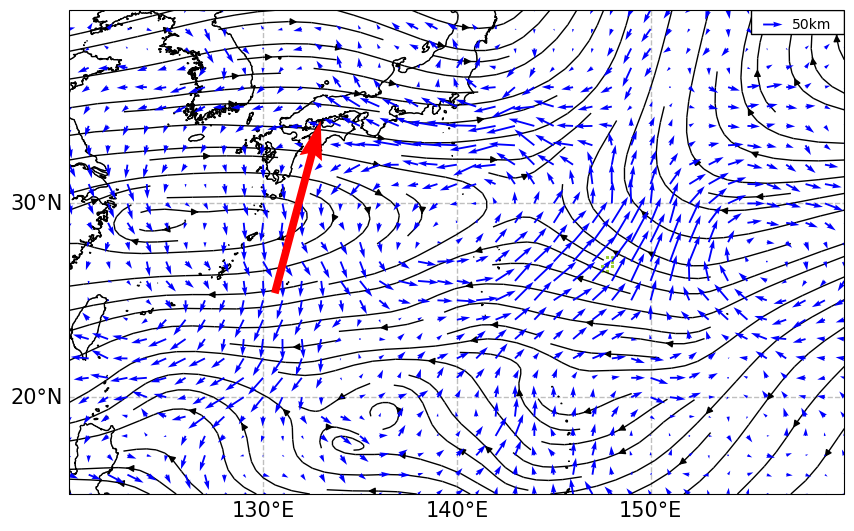

In [88]:
from matplotlib.colors import BoundaryNorm

step = 4
quiver_scale = 50
sensitivity_scale = 250
sig_thres = 99
extent = [120, 160, 15, 40]
window = 13


for predict_interval in [12]:
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    wind_speed = np.sqrt(mean_flow_500hPa[predict_interval]['u']**2+mean_flow_500hPa[predict_interval]['v']**2)
    masked_u = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['u'])
    masked_v = np.where(wind_speed < 0.5, np.nan, mean_flow_500hPa[predict_interval]['v'])
    masked_u_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['u'])
    masked_v_850 = np.where(wind_speed < 0.5, np.nan, mean_flow_850hPa[predict_interval]['v'])
    
    
    mid_ens_idx_list = []
    for ens in ens_list:
        if datetime1 in ssv_dict[key_time][ens]:
            mid_ens_idx_list.append(ens)

    # 데이터를 추출합니다
    mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in mid_ens_idx_list])

    # u_cv = cov_var_dict[predict_interval]['u_steer']
    # v_cv = cov_var_dict[predict_interval]['v_steer']
    u_cv = cov_var_dict[predict_interval]['u_tc_rm_steer']
    v_cv = cov_var_dict[predict_interval]['v_tc_rm_steer']

    print(f"max: {np.max(np.sqrt(u_cv**2+v_cv**2))}")

    # Plotting the covariance/variance
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
    ax.set_extent(extent, crs=proj)
    ax.coastlines('10m', linewidth=0.5)

    ax.streamplot(lon_grid[0, :], lat_grid[:, 0], mean_steer_tc_rm[predict_interval]['u'], mean_steer_tc_rm[predict_interval]['v'],
                color='black', linewidth=1, density=1)

    uv_quiver = ax.quiver(lon_grid[::step, ::step], lat_grid[::step, ::step], u_cv[::step, ::step], v_cv[::step, ::step], color = 'blue', transform=proj, scale = quiver_scale*40, zorder = 2)
    uv_quiver_key = ax.quiverkey(uv_quiver, 0.92, 0.97, quiver_scale, f'{quiver_scale}km', labelpos='E', coordinates='axes', color = 'blue', zorder = 10)
    v1          = pca_tar.components_[0]
    explained_var = pca_tar.explained_variance_[0]
    spread_scale       = 1 * np.sqrt(explained_var)/2
    ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*spread_scale/2, pca_tar.mean_[1]-pca_tar.components_[0, 1]*spread_scale/2, pca_tar.components_[0, 0]*spread_scale, pca_tar.components_[0, 1]*spread_scale , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)

    # ax.quiver(pca_tar.mean_[0]-pca_tar.components_[0, 0]*6, pca_tar.mean_[1]-pca_tar.components_[0, 1]*6, pca_tar.components_[0, 0], pca_tar.components_[0, 1] , scale=3, color='r', width=0.01, label='Principal Axis', zorder = 30)
    # ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], -pca_tar.components_[0, 0], -pca_tar.components_[0, 1] , scale=20, color='r', width=0.005, label='Principal Axis', zorder = 2)
    plt.scatter(mid_pos[:, 0], mid_pos[:, 1], c='yellowgreen', s=1, transform=proj)
    map_background(ax, proj=proj)
    rect = patches.Rectangle((0.88, 0.95), 0.12, 0.05, linewidth=1, edgecolor='black', facecolor='white', transform=ax.transAxes, zorder = 2)
    ax.add_patch(rect)


    plt.show()


# ETC

## Position Correlation Analysis

0 hours forecast: 10 members
[[1. 0.]]
6 hours forecast: 54 members
[[ 0.83677059 -0.54755363]]
12 hours forecast: 811 members
[[ 0.95117691 -0.3086462 ]]
18 hours forecast: 1861 members
[[ 0.96693361 -0.25502822]]
24 hours forecast: 3706 members
[[ 0.97728816 -0.21191472]]
30 hours forecast: 3766 members
[[0.85138993 0.52453331]]
36 hours forecast: 3806 members
[[0.67010745 0.74226411]]
42 hours forecast: 3806 members
[[0.66698001 0.74507561]]
48 hours forecast: 3806 members
[[0.12839841 0.99172267]]
54 hours forecast: 3806 members
[[0.37176149 0.92832828]]
60 hours forecast: 3806 members
[[0.50924163 0.86062359]]
66 hours forecast: 3806 members
[[0.47702278 0.87889093]]
72 hours forecast: 3806 members
[[0.61138598 0.79133254]]
78 hours forecast: 3806 members
[[0.54641453 0.83751487]]
84 hours forecast: 3806 members
[[0.56761287 0.82329559]]
90 hours forecast: 3806 members
[[0.57962975 0.81487996]]
96 hours forecast: 3806 members
[[0.59108709 0.80660775]]


/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:652: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


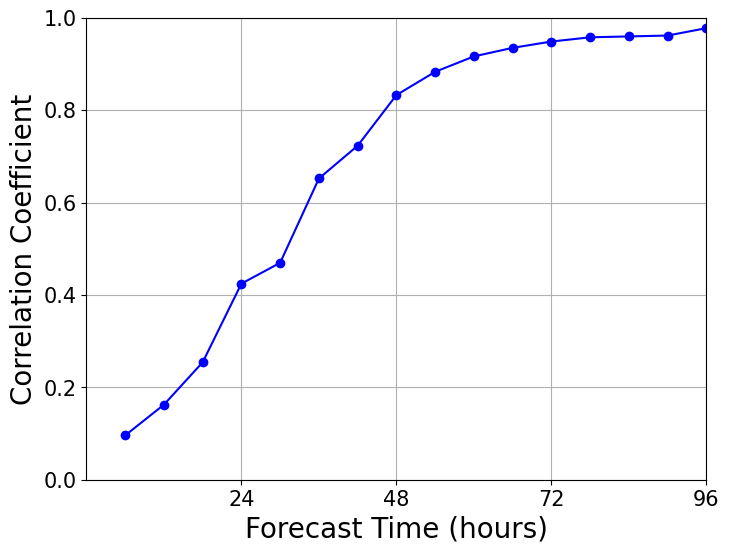

In [8]:
corr_list = []
target_time = key_time + timedelta(hours=96)
for predict_interval in range(0, 97, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]

    print(f'{predict_interval} hours forecast: {len(mid_pos)} members')
    # NumPy 배열로 변환
    mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)
    
    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

    #distance 구하기
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)

    distances_tar = (projection - ensemble_mean) * 111
    
    #타겟 위치의 PCA
    corr_pos_mid = np.copy(mid_pos)
    corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_mid = PCA(n_components=1)
    pca_mid.fit(corr_pos_mid)
    pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
    ensemble_mean = np.mean(pca_mid.transform(corr_pos_mid)[:, 0])
    print(pca_mid.components_)

    #distance 구하기
    corr_pos_mid = np.copy(mid_pos)
    corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_mid.transform(corr_pos_mid)[:, 0]  # 주축에 투영된 데이터 (1차원)

    # distances_mid = (projection - ensemble_mean) * 111
    distances_mid = mid_pos[:,1]

    corr_list.append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))


plt.figure(figsize=(8, 6))
plt.ylim(0,1.0)
plt.xlim(0, 96)
plt.plot(range(0, 97, 6), np.abs(corr_list), marker='o', linestyle='-', color='b')
# plt.title(f'Correlation between Mid and Target Positions for {storm_name} ({key_str})')
plt.xlabel('Forecast Time (hours)', fontsize=20)
plt.ylabel('Correlation Coefficient', fontsize=20)
plt.yticks(np.arange(0, 1.1, 0.2), fontsize=15)
plt.xticks(range(24, 97, 24), fontsize=15)
plt.grid()
plt.show()

0 hours forecast: 10 members
6 hours forecast: 54 members
12 hours forecast: 811 members
18 hours forecast: 1861 members
24 hours forecast: 3706 members
30 hours forecast: 3766 members
36 hours forecast: 3806 members


/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


42 hours forecast: 3806 members
48 hours forecast: 3806 members
54 hours forecast: 3806 members
60 hours forecast: 3806 members
66 hours forecast: 3806 members
72 hours forecast: 3806 members
78 hours forecast: 3806 members
84 hours forecast: 3806 members
90 hours forecast: 3806 members
96 hours forecast: 3806 members


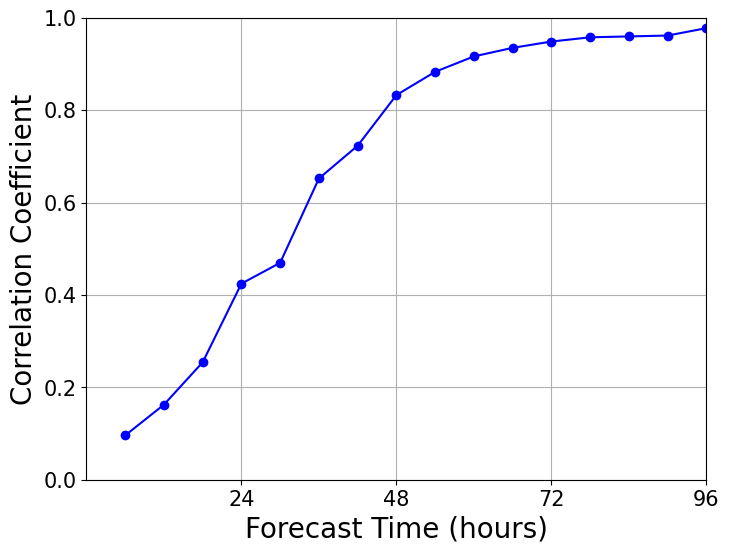

In [19]:
from numba import jit
import numpy as np

@jit(nopython=True)
def haversine_distance(lon1, lat1, lon2, lat2):
    # degrees -> radians (elementwise OK)
    lon1 = np.radians(lon1)
    lat1 = np.radians(lat1)
    lon2 = np.radians(lon2)
    lat2 = np.radians(lat2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # 표준 haversine (테일러 말고)
    a = np.sin(dlat * 0.5)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon * 0.5)**2
    c = 2.0 * np.arcsin(np.sqrt(a))
    return 6371.0 * c


corr_list = []
target_time = key_time + timedelta(hours=96)
for predict_interval in range(0, 97, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]

    print(f'{predict_interval} hours forecast: {len(mid_pos)} members')
    # NumPy 배열로 변환
    mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)
    
    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

    #distance 구하기
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)

    distances_tar = (projection - ensemble_mean) * 111
    
    #타겟 위치의 PCA
    # corr_pos_mid = np.copy(mid_pos)
    # corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    # pca_mid = PCA(n_components=1)
    # pca_mid.fit(corr_pos_mid)
    # pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
    # ensemble_mean = np.mean(pca_mid.transform(corr_pos_mid)[:, 0])
    # print(pca_mid.components_)

    # #distance 구하기
    # corr_pos_mid = np.copy(mid_pos)
    # corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    # projection = pca_mid.transform(corr_pos_mid)[:, 0]  # 주축에 투영된 데이터 (1차원)

    # distances_mid = (projection - ensemble_mean) * 111
    distances_mid = mid_pos[:,1] * 111

    # distances_mid = (
    #                 haversine_distance(mid_pos[:,0], mid_pos[:,1], lon1, lat1)
    #                 - haversine_distance(mid_pos[:,0], mid_pos[:,1], lon0, lat0)
    #             )

    corr_list.append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))


plt.figure(figsize=(8, 6))
plt.ylim(0,1.0)
plt.xlim(0, 96)
plt.plot(range(0, 97, 6), np.abs(corr_list), marker='o', linestyle='-', color='b')
# plt.title(f'Correlation between Mid and Target Positions for {storm_name} ({key_str})')
plt.xlabel('Forecast Time (hours)', fontsize=20)
plt.ylabel('Correlation Coefficient', fontsize=20)
plt.yticks(np.arange(0, 1.1, 0.2), fontsize=15)
plt.xticks(range(24, 97, 24), fontsize=15)
plt.grid()
plt.show()

30 hours forecast: 3982 members


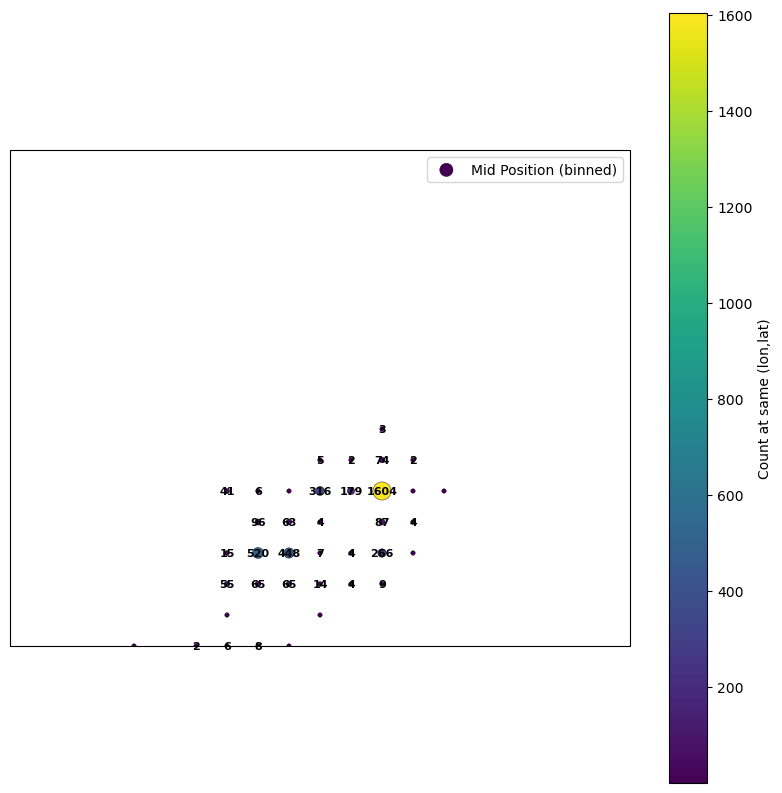

In [ ]:
corr_list = []
target_time = key_time + timedelta(hours=72)
for predict_interval in range(30, 35, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]

    print(f'{predict_interval} hours forecast: {len(mid_pos)} members')
    # NumPy 배열로 변환
    mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)



round_ndec = 3  # 좌표를 소수점 3자리로 반올림해서 같은 칸으로 취급 (필요시 조절)

# 1) 좌표 전처리 (반올림으로 같은 위치 버킷팅)
coords = np.column_stack([np.round(mid_pos[:,0], round_ndec),
                          np.round(mid_pos[:,1], round_ndec)])

# 2) 고유 위치와 개수 집계
uniq, counts = np.unique(coords, axis=0, return_counts=True)
lon_u, lat_u = uniq[:,0], uniq[:,1]

fig, ax = plt.subplots(figsize=(10,10), subplot_kw={'projection': proj})
ax.set_extent([145,150, 26, 30], crs=ccrs.PlateCarree())

# 3) 점 크기/색으로 개수 표현
sc = ax.scatter(lon_u, lat_u,
                s=10 + counts*0.1,      # 개수에 비례해 크기 키움
                c=counts, cmap='viridis',
                edgecolors='k', linewidths=0.3,
                transform=ccrs.PlateCarree(),
                label='Mid Position (binned)')

# 4) 겹침 수를 텍스트로도 표시(원하면)
for x, y, n in zip(lon_u, lat_u, counts):
    if n > 1:
        ax.text(x, y, str(n), ha='center', va='center',
                fontsize=8, weight='bold',
                transform=ccrs.PlateCarree())

plt.colorbar(sc, ax=ax, label='Count at same (lon,lat)')
ax.legend()
plt.show()

6 hours forecast: 54 members
6h Projection vector: [ 0.65324804 -0.75714397], norm: 55.408483902504265
12 hours forecast: 811 members
12h Projection vector: [0.20664554 0.97841587], norm: 133.16447703286207
18 hours forecast: 1861 members
18h Projection vector: [-0.20745246  0.9782451 ], norm: 152.8709374546952
24 hours forecast: 3706 members
24h Projection vector: [-0.02873093  0.99958718], norm: 620.5504162827806
30 hours forecast: 3766 members
30h Projection vector: [-0.37449988  0.92722696], norm: 572.6133847758601
36 hours forecast: 3806 members
36h Projection vector: [-0.25816863  0.96609987], norm: 453.41702755635185
42 hours forecast: 3806 members
42h Projection vector: [-0.04055573  0.99917728], norm: 486.9943864034079
48 hours forecast: 3806 members
48h Projection vector: [0.21348397 0.97694657], norm: 394.9010715925018
54 hours forecast: 3806 members
54h Projection vector: [0.04799042 0.9988478 ], norm: 367.30886391783685
60 hours forecast: 3806 members
60h Projection vector

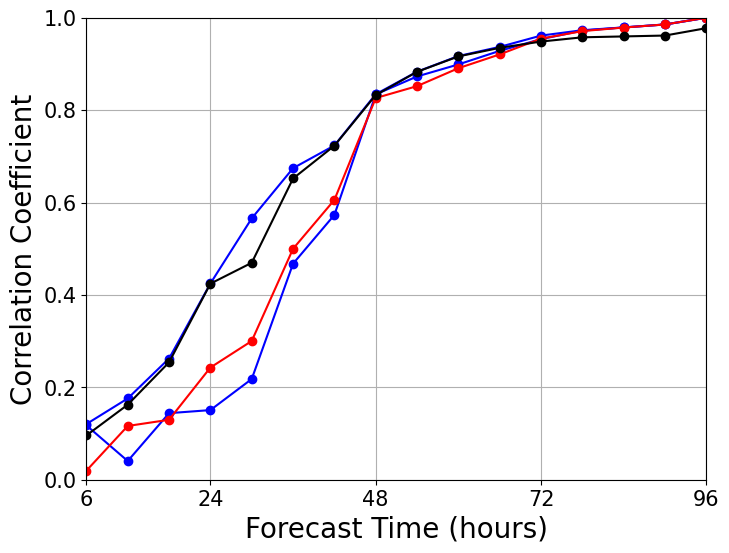

In [9]:
corr_list = {'best': [], 'lat': [], 'mid': [], 'tar': []}
axis_vec_dict = {}
target_time = key_time + timedelta(hours=96)

# 0h에서는 태풍의 위치가 모두 동일해서 효과가 없음
for predict_interval in range(6, 97, 6):
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]

    print(f'{predict_interval} hours forecast: {len(mid_pos)} members')
    # NumPy 배열로 변환
    mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)
    
    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)

    distances_tar = (projection - ensemble_mean) * 111    

    corr_pos_mid = np.copy(mid_pos)
    corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_mid = PCA(n_components=1)
    pca_mid.fit(corr_pos_mid)
    pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:,0])
    ensemble_mean = np.mean(pca_mid.transform(corr_pos_mid)[:, 0])
    projection_mid_pca = pca_mid.transform(corr_pos_mid)[:, 0]
    projection_tar_pca = pca_tar.transform(corr_pos_mid)[:, 0]


    # 2) 중앙화 (상관계수는 평균에 민감하니 X, y 모두 중심화)
    X = corr_pos_mid - corr_pos_mid.mean(axis=0)             # shape (N, 2)
    y = distances_tar - distances_tar.mean()         # shape (N,)

    # 3) 공분산 기반 해: w ∝ Σ_xx^{-1} Σ_xy  (회귀계수와 동일)
    #    수치안정화를 위해 미약한 ridge(람다) 추가
    N = X.shape[0]
    Sxx = (X.T @ X) / max(N-1, 1)
    Sxy = (X.T @ y) / max(N-1, 1)
    lam = 1e-8 * np.trace(Sxx) if np.isfinite(np.trace(Sxx)) else 1e-8
    w = np.linalg.solve(Sxx + lam * np.eye(2), Sxy)  # shape (2,)

    # 4) 축 정규화 후 투영 (km로 보기 좋게 111 곱)
    norm = np.linalg.norm(w)
    if norm == 0 or not np.isfinite(norm):
        # 퇴화 상황: 위도만 쓰는 등 fallback
        axis_vec = np.array([0.0, 1.0])
    else:
        axis_vec = w / norm

    proj_mid = (X @ axis_vec) * 111.0   # 중간시점의 최상관 투영값 (km)
    axis_vec_dict[predict_interval] = axis_vec
    print(f'{predict_interval}h Projection vector: {axis_vec}, norm: {norm}')   

    # 5) 부호 정렬: distances_tar와 양의 상관이 되도록 축 방향 통일(가독성)
    r = np.corrcoef(proj_mid, y)[0, 1]
    if r < 0:
        proj_mid = -proj_mid
        r = -r

    # 6) 최종 상관 저장
    corr_list['best'].append(r)   # 절댓값이 아니라 이미 양(+)으로 맞춤


    distances_mid = mid_pos[:,1]
    corr_list['lat'].append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))
        
    distances_mid = (projection_mid_pca - ensemble_mean) * 111
    corr_list['mid'].append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))

    distances_mid = (projection_tar_pca - ensemble_mean) * 111
    corr_list['tar'].append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))    



plt.figure(figsize=(8, 6))
plt.ylim(0,1.0)
plt.xlim(6, 96)
plt.plot(range(6, 97, 6), np.abs(corr_list['best']), marker='o', linestyle='-', color='b', label = 'best')
plt.plot(range(6, 97, 6), np.abs(corr_list['mid']), marker='o', linestyle='-', color='b', label = 'mid')
plt.plot(range(6, 97, 6), np.abs(corr_list['tar']), marker='o', linestyle='-', color='r', label = 'tar')
plt.plot(range(6, 97, 6), np.abs(corr_list['lat']), marker='o', linestyle='-', color='black', label = 'lat')
# plt.title(f'Correlation between Mid and Target Positions for {storm_name} ({key_str})')
plt.xlabel('Forecast Time (hours)', fontsize=20)
plt.ylabel('Correlation Coefficient', fontsize=20)
plt.yticks(np.arange(0, 1.1, 0.2), fontsize=15)
plt.xticks([6]+list(range(24,97,24)), fontsize=15)
plt.grid()
# plt.legend(fontsize=15)
plt.show()

## <span style ="background:green; color:white; font-weight:bold">Check How Many Ensemble is needed?💠💠</span>

In [ ]:
for predict_interval in range(12, 13, 12):
    print(f'Processing {predict_interval} hours forecast...')
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    ens_idx_list = []
    cov_var_dict[predict_interval] = {}
        
    for ens in ens_list[:]:
        if (target_time in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])
    

    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

    #distance 구하기
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
    distances_tar = (projection - ensemble_mean) * 111



    # (N, M, K) N: ensemble number, M: lon, K: lat
    level_list = pres_array
    input_data_dir = f'{pangu_dir}/output_data/{first_str}/{perturbation_scale}ENS{surface_str}{upper_str}'


    delayed_results = [
        delayed(process_ens)(
            input_data_dir, ens, predict_interval, pres_array=pres_array, lon_grid = lon_grid, lat_grid = lat_grid ,level=level_list
        )
        for ens in ens_idx_list
    ]    

    with ProgressBar():
        results = compute(*delayed_results, scheduler='threads')
    q_col = np.array([r[1] for r in results])

Processing 12 hours forecast...
[########################################] | 100% Completed | 124.81 s


In [ ]:
datetime1 = key_time + timedelta(hours=int(12))
print(datetime1)

ens_idx_list = []
tar_idx_list = []
cov_var_dict[predict_interval] = {}
    
for ens in ens_list:
    if (target_time in ssv_dict[key_time][ens]) & (datetime1 in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

    if target_time in ssv_dict[key_time][ens]:
        tar_idx_list.append(ens)

tar_idx_list = np.array(tar_idx_list)

idx_in_tar = np.where(np.isin(tar_idx_list, ens_idx_list))[0]
# 데이터를 추출합니다
mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in tar_idx_list]

# NumPy 배열로 변환
mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)

#타겟 위치의 PCA
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

#distance 구하기
corr_pos_tar = np.copy(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)
distances_tar = (projection - ensemble_mean) * 111

corr_pos_mid = np.copy(mid_pos)
corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_mid = PCA(n_components=1)
pca_mid.fit(corr_pos_mid)
pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
ensemble_mean = np.mean(pca_mid.transform(corr_pos_mid)[:, 0])

#distance 구하기
corr_pos_mid = np.copy(mid_pos)
corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
projection = pca_tar.transform(corr_pos_mid)[:, 0]  # 주축에 투영된 데이터 (1차원)

# distances_mid = (projection - ensemble_mean) * 111
# distances_mid = mid_pos[:,1]*111

q_total_cov_var = compute_cov_var(q_col, distances_tar, tar_idx_list)

# results = {}
# for m in [100] + list(range(250, 2001, 250)):
#     rng = np.random.default_rng(0)
#     rmse_list = []
#     for _ in tqdm(range(200), desc = f'{m} samples'):
#         idx = rng.choice(len(tar_idx_list), size=m, replace=False)
#         q_mid_cov_var= compute_cov_var(q_col[idx,...], distances_tar[idx,...], tar_idx_list[idx,...])
#         rmse = np.sqrt(np.mean((q_total_cov_var - q_mid_cov_var)**2))
#         rmse_list.append(rmse)

#     results[m] = np.mean(rmse_list)

2022-08-27 12:00:00


2000 samples: 100%|██████████| 200/200 [01:18<00:00,  2.54it/s]

{100: {'rmse_mean': 18.65851956385784, 'rmse_p05': 16.70242974649746, 'rmse_p95': 20.606343809117366, 'r_mean': 0.2792280599844805, 'r_p05': 0.20975731867575131, 'r_p95': 0.3506713364098184}, 250: {'rmse_mean': 11.457931508290057, 'rmse_p05': 10.591801334237031, 'rmse_p95': 12.289933366129757, 'r_mean': 0.4210897909176968, 'r_p05': 0.34149840348704846, 'r_p95': 0.48305789024991663}, 500: {'rmse_mean': 7.890282253844332, 'rmse_p05': 7.391531200057037, 'rmse_p95': 8.380884124832791, 'r_mean': 0.5705236060545547, 'r_p05': 0.5115066245443753, 'r_p95': 0.6235818491216288}, 750: {'rmse_mean': 6.170944702702608, 'rmse_p05': 5.845371778990315, 'rmse_p95': 6.473583031181872, 'r_mean': 0.6591237936030829, 'r_p05': 0.6127270092053416, 'r_p95': 0.6971261987231712}, 1000: {'rmse_mean': 5.119522483633037, 'rmse_p05': 4.892146513634182, 'rmse_p95': 5.356619327274255, 'r_mean': 0.7245247442248012, 'r_p05': 0.6884217644895098, 'r_p95': 0.7545441131782042}, 1250: {'rmse_mean': 4.368166397493042, 'rmse_p

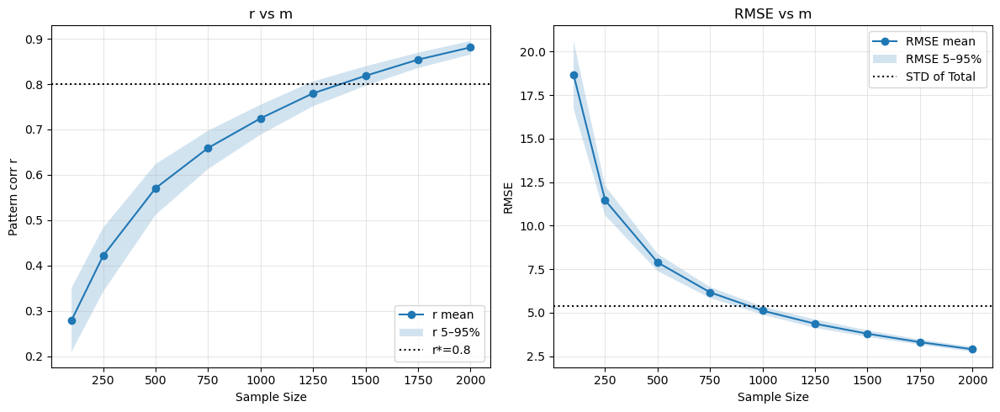

In [ ]:
def _as_map(out):
    return out[0] if isinstance(out, tuple) else out

# 풀셋(≈4000) 결과 지도
q_total_cov_var = _as_map(compute_cov_var(q_col, distances_tar, tar_idx_list))

ens_ids_arr = np.asarray(tar_idx_list)
rng = np.random.default_rng(0)  # 바깥에서 한 번만 생성 (재현 원하면 고정)

results = {}
for m in [100] + list(range(250, 2001, 250)):
    rmse_list, r_list = [], []
    for _ in tqdm(range(200), desc=f'{m} samples'):
        idx = rng.choice(len(ens_ids_arr), size=m, replace=False)

        q_sub = q_col[idx, ...]
        d_sub = distances_tar[idx]
        ens_sub = ens_ids_arr[idx].tolist()

        q_mid_cov_var = _as_map(compute_cov_var(q_sub, d_sub, ens_sub))

        # RMSE (필요시 nan-safe)
        diff = q_total_cov_var - q_mid_cov_var
        rmse = np.sqrt(np.nanmean(diff**2))
        rmse_list.append(rmse)

        # 패턴 상관
        a = q_mid_cov_var.ravel(); b = q_total_cov_var.ravel()
        mask = np.isfinite(a) & np.isfinite(b)
        if mask.sum() > 2:
            a0 = a[mask] - a[mask].mean()
            b0 = b[mask] - b[mask].mean()
            denom = (np.sqrt((a0**2).sum()) * np.sqrt((b0**2).sum())) + 1e-12
            r = float((a0 @ b0) / denom)
        else:
            r = np.nan
        r_list.append(r)

    results[m] = {
        "rmse_mean": float(np.nanmean(rse := np.array(rmse_list))),
        "rmse_p05":  float(np.nanpercentile(rse, 5)),
        "rmse_p95":  float(np.nanpercentile(rse, 95)),
        "r_mean":    float(np.nanmean(rv := np.array(r_list))),
        "r_p05":     float(np.nanpercentile(rv, 5)),
        "r_p95":     float(np.nanpercentile(rv, 95)),
    }

print(results)


m_vals  = list(results.keys())
rm_mean = [results[m]["rmse_mean"] for m in m_vals]
rm_p05  = [results[m]["rmse_p05"]  for m in m_vals]
rm_p95  = [results[m]["rmse_p95"]  for m in m_vals]
r_mean  = [results[m]["r_mean"]    for m in m_vals]
r_p05   = [results[m]["r_p05"]     for m in m_vals]
r_p95   = [results[m]["r_p95"]     for m in m_vals]

fig, ax = plt.subplots(1,2, figsize=(12,5))

# (1) r vs m
ax[0].plot(m_vals, r_mean, marker='o', label='r mean')
ax[0].fill_between(m_vals, r_p05, r_p95, alpha=0.2, label='r 5–95%')
ax[0].axhline(0.8, color='k', linestyle=':', label='r*=0.8')  # 원하는 기준선
# ax[0].set_xscale('log')
ax[0].set_xlabel('Sample Size'); ax[0].set_ylabel('Pattern corr r'); ax[0].set_title('r vs m')
ax[0].grid(alpha=0.3); ax[0].legend()

# (2) RMSE vs m
ax[1].plot(m_vals, rm_mean, marker='o', label='RMSE mean')
ax[1].fill_between(m_vals, rm_p05, rm_p95, alpha=0.2, label='RMSE 5–95%')
# ax[1].set_xscale('log')
ax[1].set_xlabel('Sample Size'); ax[1].set_ylabel('RMSE'); ax[1].set_title('RMSE vs m')
ax[1].grid(alpha=0.3)
ax[1].axhline(np.std(q_total_cov_var), color='k', linestyle=':', label='STD of Total')
ax[1].legend()

plt.tight_layout(); plt.show()

## Draw Deformation flow

In [ ]:
predict_interval = 12
datetime1 = key_time + timedelta(hours=int(predict_interval))

ens_idx_list = []
        
for ens in ens_list[:]:
    if (target_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

delayed_results = [
    delayed(process_ens)(
        input_data_dir, ens, predict_interval, pres_array=pres_array, lon_grid = lon_grid, lat_grid = lat_grid ,level=500
    )
    for ens in ens_idx_list
]    

with ProgressBar():
    results = compute(*delayed_results, scheduler='threads')
uv = np.array([r[0] for r in results])


[########################################] | 100% Completed | 109.62 s


In [ ]:
datetime1 = key_time + timedelta(hours=int(12))

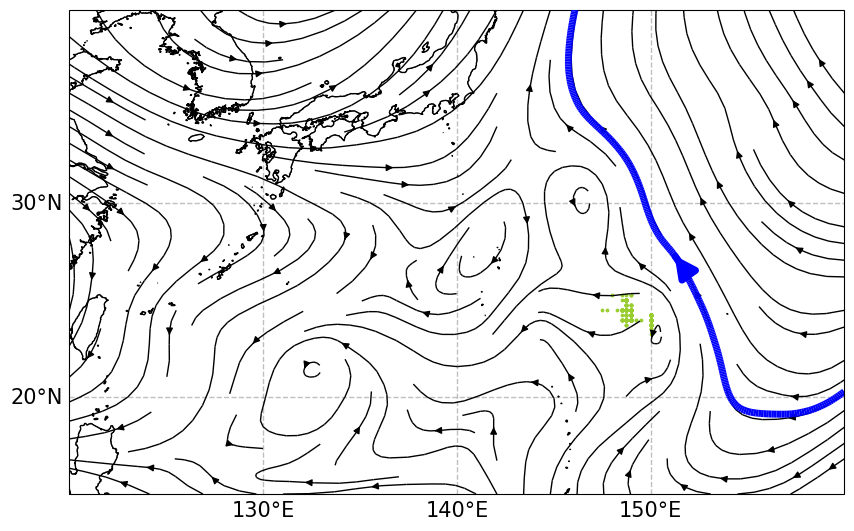

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
# ax.set_extent(extent, crs=proj)
ax.coastlines('10m', linewidth=0.5)
ax.set_extent([120, 160, 15, 40], crs=proj)
ax.streamplot(lon_grid, lat_grid, np.mean(uv[:,upper_dict['u']], axis = 0)[0], np.mean(uv[:,upper_dict['v']], axis = 0)[0], color='black', linewidth=1, transform=proj, density=1)
ax.streamplot(lon_grid, lat_grid, np.mean(uv[:,upper_dict['u']], axis = 0)[0], np.mean(uv[:,upper_dict['v']], axis = 0)[0],
          start_points=np.array([[150, 29.2]]), # 다른 시작점
          color='blue', linewidth=5, zorder=20,arrowsize=3,density=10,
          transform=ccrs.PlateCarree())
# ax.streamplot(lon_grid, lat_grid, np.mean(uv[:,upper_dict['u']], axis = 0)[0], np.mean(uv[:,upper_dict['v']], axis = 0)[0],
#           start_points=np.array([[150, 25.5]]), # 다른 시작점
#           color='red', linewidth=5, zorder=20,arrowsize=3,density=10,
#           transform=ccrs.PlateCarree())
map_background(ax, proj = proj, gl_font_size=15)

ens_idx_list = []
for ens in ens_list:
    if (target_time in ssv_dict[key_time][ens]) and (datetime1 in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)

mid_pos = np.array([(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list])
plt.scatter(mid_pos[:, 0], mid_pos[:, 1], c='yellowgreen', s=3, transform=proj)

plt.show()